In [2]:
import os, sys, socket
import math
import numpy as np
import scipy
import pandas as pd
import pickle
import matplotlib
import matplotlib.pyplot as plt
import pynbody
import pynbody.analysis.gravity


# This line add the E-MOSAICS repository scripts to PYTHONPATH. 
# Change the path to your local copy of the Python 3 repository:
sys.path.append("/home2/st/Projects/GCkinematics/git-E-MOSAICS_python3/")

import fnmatch, h5py
from optparse import OptionParser

# load functions commonly used in E-MOSAICS repository:
from read_data_mosaics import read_data_mosaics
from read_snapshot_mosaics import read_snapshot_mosaics
from read_subfind import read_subfind_eagle
from functions import getAttrs, elapsed_time, time_to_redshift, lastSnapshot, centre_positions
from apertureBox import apertureBox
import readmodule
from read_other import read_other

# for high resolution in-line plots in Mac OS:
%config InlineBackend.figure_format ='retina'


In [3]:
matplotlib.rcParams['font.size'] = 16.0 # 22.0
matplotlib.rcParams['axes.labelsize'] = 18.0 
matplotlib.rcParams['legend.fontsize'] = 14.0 # 20.0

In [ ]:
# sometimes needed for opening the HDF5 files
os.environ[“HDF5_USE_FILE_LOCKING”] = “FALSE”

# Auxiliary functions

In [4]:
### Auxiliary functions:

###################################################################

def rotate_x(ar, angle):
    """Rotates the snapshot about the current x-axis by 'angle' degrees."""
    angle *= np.pi/180
    mat = np.matrix([[1,      0,             0],
                     [0, np.cos(angle), -np.sin(angle)],
                     [0, np.sin(angle),  np.cos(angle)]])
    return np.array(np.dot(mat, ar.transpose()).transpose())

def rotate_y(ar, angle):
    """Rotates the snapshot about the current y-axis by 'angle' degrees."""
    angle *= np.pi/180
    mat = np.matrix([[np.cos(angle),    0,   np.sin(angle)],
                     [0,                1,        0       ],
                     [-np.sin(angle),   0,   np.cos(angle)]])
    return np.array(np.dot(mat, ar.transpose()).transpose())

def rotate_z(ar, angle):
    """Rotates the snapshot about the current z-axis by 'angle' degrees."""
    angle *= np.pi/180
    mat = np.matrix([[np.cos(angle), -np.sin(angle), 0],
                     [np.sin(angle),  np.cos(angle), 0],
                     [      0,             0,        1]])
    return np.array(np.dot(mat, ar.transpose()).transpose())

####################################################################


### transform coordinate vectors to spherical coords. (NEW: uses physical convention):
def pos_sph(x,y,z):
    r     = np.sqrt( x**2 + y**2 + z**2 )
    phi   = np.arctan2(y, x)      # azimuthal angle in [0, 2*pi]
    theta = np.arccos(z/r)    # elevation wrt z axis [0, pi]
    return r, phi, theta

### transform velocity vectors to spherical coordinates (NEW: uses physics convention)
def v_sph(x,y,z, vx,vy,vz):
    r, phi, theta = pos_sph(x, y, z)
    #
    v_rad   = np.sin(theta)*np.cos(phi)*vx + np.sin(theta)*np.sin(phi)*vy + np.cos(theta)*vz
    v_theta = np.cos(theta)*np.cos(phi)*vx + np.cos(theta)*np.sin(phi)*vy - np.sin(theta)*vz # elevation
    v_phi   = -np.sin(phi)*vx + np.cos(phi)*vy   # azimuth
    #
    return v_rad, v_phi, v_theta

### transform velocities from spherical to cartesian:
def v_cart(theta, phi, r, Vth, Vphi, Vr):
    el = phi + np.pi/2.
    az = theta
    sph = [ Vaz, Vel, Vr ]
    matrix = np.matrix( [[ -np.sin(az), -np.sin(el)*np.cos(az), np.cos(el)*np.cos(az) ],
                         [  np.cos(az), -np.sin(el)*np.sin(az), np.cos(el)*np.sin(az) ],
                         [  0         ,  np.cos(el)           , np.sin(el)            ]] )
    cart = np.matmul( matrix, sph )
    return cart[0], cart[1], cart[2]

### cartesian velocities to cylindrical:
def v_cyl(x,y,z,vx,vy,vz):
    rad = np.sqrt( x**2 + y**2 )
    vr = vx*(x/rad) + vy*(y/rad)
    vth = vy*(x/rad) - vx*(y/rad)
    vz = vz
    return vr, vth, vz

### velocity anistropy
def beta_func(sigma_r, sigma_th, sigma_phi):
    beta = 1. - ( sigma_th**2 + sigma_phi**2 ) / ( 2.*sigma_r**2 )
    return beta

### z-comp. of angular momentum
def Lz_func(x, y, vx, vy):
    L_z = x*vy - y*vx
    return L_z

### magnitude of angular momentum
def Ltot_func(x, y, z, vx, vy, vz):
    L_x =  y*vz - z*vy
    L_y = -x*vz + z*vx
    L_z =  x*vy - y*vx
    L_tot = np.sqrt( L_x**2 + L_y**2 + L_z**2 )
    return L_tot

# Subfind snapshot info

In [26]:
# This script provides information on the structure and contents of any snapshot file 
# usage: python /path_to_E-MOSAICS_repository/hdf5keys.py directory/to/snapshot/snapshot_file.hdf5

%run /home2/st/Projects/GCkinematics/git-E-MOSAICS_python3/hdf5keys.py /home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED/data/groups_028_z000p000/eagle_subfind_tab_028_z000p000.0.hdf5


*** hdf5keys ***

File : /home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED/data/groups_028_z000p000/eagle_subfind_tab_028_z000p000.0.hdf5

/Constants :
  attrs.keys:
     AVOGADRO         : "6.0222e+23"
     BOLTZMANN        : "1.38066e-16"
     C                : "29979000000.0"
     CM_PER_MPC       : "3.085678e+24"
     ELECTRONCHARGE   : "4.8032e-10"
     ELECTRONMASS     : "9.10953e-28"
     EV_TO_ERG        : "1.60217646e-12"
     GAMMA            : "1.6666666666666667"
     GAS_CONST        : "83142500.0"
     GRAVITY          : "6.672e-08"
     HUBBLE           : "3.2407789e-18"
     PI               : "3.1415927"
     PLANCK           : "6.6262e-27"
     PROTONMASS       : "1.6726e-24"
     RAD_CONST        : "7.565e-15"
     SEC_PER_MEGAYEAR : "31550000000000.0"
     SEC_PER_YEAR     : "31550000.0"
     SOLAR_LUM        : "3.826e+33"
     SOLAR_MASS       : "1.989e+33"
     STEFAN           : "7.5657e-15"
     THOMPSON         : "6.65245e-25"
     T_CMB0           : "2.728"


/Subhalo/ApertureMeasurements/VelDisp/100kpc      : <HDF5 dataset "100kpc": shape (11488,), type "<f4">
                                                    "b'Stellar velocity dispersion within apertures from 1 to 100 kpc (physical) of the centre of potential of the subhalo'"
/Subhalo/BlackHoleMass                            : <HDF5 dataset "BlackHoleMass": shape (11488,), type "<f4">
                                                    "b'BH mass. Physical m = Mass h^-1 U_M [g]'"
/Subhalo/BlackHoleMassAccretionRate               : <HDF5 dataset "BlackHoleMassAccretionRate": shape (11488,), type "<f4">
                                                    "b'BH accretion rate. Physical mdot = BH_Mdot h^-1 U_M /U_T [g/s]'"
/Subhalo/CentreOfMass                             : <HDF5 dataset "CentreOfMass": shape (11488, 3), type "<f4">
                                                    "b'Co-moving position of COM. Physical position = position h^-1 a U_L[cm]'"
/Subhalo/CentreOfPotential     

In [21]:
# This script provides information on the structure and contents of any snapshot file 
# usage: python /path_to_E-MOSAICS_repository/hdf5keys.py directory/to/snapshot/snapshot_file.hdf5

%run /home2/st/Projects/GCkinematics/git-E-MOSAICS_python3/hdf5keys.py /home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED/data/clusterdata_028_z000p000/mosaics_altphys_0_028_z000p000.hdf5


*** hdf5keys ***

File : /home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED/data/clusterdata_028_z000p000/mosaics_altphys_0_028_z000p000.hdf5

/Clusters/BirthPressure                      : <HDF5 dataset "BirthPressure": shape (72121977,), type "<f4">
                                               "b'Gas pressure at star formation site [g/cm/s^2].'"
/Clusters/BirthWeightedDensity               : <HDF5 dataset "BirthWeightedDensity": shape (72121977,), type "<f4">
                                               "b'SphP Density or WeightedDensity [g/cm^3].'"
/Clusters/CFE                                : <HDF5 dataset "CFE": shape (72121977,), type "<f4">
                                               "b'Cluster formation efficiency.'"
/Clusters/Coordinates                        : <HDF5 dataset "Coordinates": shape (72121977, 3), type "<f4">
                                               "b'Co-moving coordinates. Physical: r = a x = Coordinates h^-1 a U_L [cm]'"
/Clusters/DF_Disrupted   

     PROTONMASS       : "1.6726e-24"
     RAD_CONST        : "7.565e-15"
     SEC_PER_MEGAYEAR : "31550000000000.0"
     SEC_PER_YEAR     : "31550000.0"
     SOLAR_LUM        : "3.826e+33"
     SOLAR_MASS       : "1.989e+33"
     STEFAN           : "7.5657e-15"
     THOMPSON         : "6.65245e-25"
     T_CMB0           : "2.728"
     Z_Solar          : "0.012663729"
/Header :
  attrs.keys:
     BoxSize                : "23.2959"
     E(z)                   : "1.0000000000000002"
     ExpansionFactor        : "0.9999999999999998"
     Flag_Cooling           : "0"
     Flag_DoublePrecision   : "0"
     Flag_Feedback          : "0"
     Flag_IC_Info           : "3"
     Flag_Metals            : "0"
     Flag_Sfr               : "0"
     Flag_StellarAge        : "0"
     H(z)                   : "2.1962758605300003e-18"
     HubbleParam            : "0.6777"
     MassTable              : "[0.00000000e+00 8.21291611e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]"
     Nu

In [29]:
# This script provides information on the structure and contents of any snapshot file 
# usage: python /path_to_E-MOSAICS_repository/hdf5keys.py directory/to/snapshot/snapshot_file.hdf5

%run /home2/st/Projects/GCkinematics/git-E-MOSAICS_python3/hdf5keys.py /home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED/data/particledata_028_z000p000/eagle_subfind_particles_028_z000p000.1.hdf5)


*** hdf5keys ***



OSError: Unable to open file (unable to open file: name = '/home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED/data/particledata_028_z000p000/eagle_subfind_particles_028_z000p000.1.hdf5)', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

# Read snapshot and produce galaxy + GC catalogs:

In [381]:
# Routine to read the galaxy, star particle (optional-ask me if you need this feature), 
# and star cluster data for all haloes in the 34 Mpc box from z=0 snapshot

# Notes:
# The option spin_disk=True needs to read in the stars to calculate their spin within a 30 kpc aperture. 
# This requires updating the functionality for the stars. In the meantime, if you want to align the
# galaxy using the disk spin, the standard way is to use the SubFind value, for which you set align=True

def read_data_volume_all(halonum='all', massrange=(2e7,1e12),
                         spin_disk=True, align=True, 
                         mlim=1e5, metcut=True, agecut=0, 
                         accreted=False, 
                         load_pynbody=False, galplots=False, energy=False, galpy=False, 
                         save=False, stars=False, suppress=True):
    
    ### simulation and snapshot info for all halos
    Dir = '/home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED'
    snap = 28 # last snapshot number (redshift= 0)
    
    Header = getAttrs(Dir, snap, 'Header')
    Lbox = Header['BoxSize'] * Header['ExpansionFactor'] / Header['HubbleParam']
    print('Lbox =', Lbox, 'Mpc')
    
    ### galaxy stellar mass range:
    Mstar_min = massrange[0]; Mstar_max = massrange[1]
    
    MSTARLIM = 2e7 # [Msun] fiducial=1e8 ~about 1000 particles post-stellar evo mass loss
    M200LIM = 1e9  # ~1000 DM particles [Msun]
    #SMLfac = 1.5 # Approximately account for stellar mass loss so we're looking at similar init/fin populations

    print('snap:',snap)
    print(f'galaxy Mstar limit: {MSTARLIM:.3g} Msun')
    print(f'galaxy M200 limit: {M200LIM:.3g} Msun')
    print(f'GC Mlim: {mlim:.3g} Msun')
    print('GC agecut:',agecut, 'Gyr')
    print('GC met. cut:', metcut, '\n')
    
    ### get center of potential and velocity from subfind table:
    FirstSubhaloID = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/FOF/FirstSubhaloID', suppress=suppress)
    
    #CofP = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/FOF/GroupCentreOfPotential', suppress=suppress)
    CofP = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/CentreOfPotential', suppress=suppress)
    CofP.data = CofP.data/CofP.cm_per_mpc
    
    CofV = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/Velocity', suppress=suppress)
    CofV.data = CofV.data / 1e5  # cgs to km/s
    
    #print('number of fof groups =',len(CofP.data))
    print('total number of subhaloes =',len(CofV.data))
    print()
    

    ### Group/Subhalo properties from Subfind group catalogues:

    # FOF group total mass
    GroupMass = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/FOF/GroupMass', suppress=suppress)
    GroupMass.data = GroupMass.data/GroupMass.solar_mass
    # FOF group mass within R200
    GroupM200 = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/FOF/Group_M_Crit200', suppress=suppress)
    GroupM200.data = GroupM200.data/GroupM200.solar_mass
    # R200
    GroupR200 = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/FOF/Group_R_Crit200', suppress=suppress)
    # Number of subhaloes in FOF group
    NumOfSubhalos = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/FOF/NumOfSubhalos', suppress=suppress)
    # Group and Subgroup number
    GroupNumber = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/GroupNumber', suppress=suppress)
    SubGroupNumber = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/SubGroupNumber', suppress=suppress)
    # aperture mass (for each particle type, incl. Mstar):
    Maper = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/ApertureMeasurements/Mass/030kpc', suppress=suppress)
    Maper.data /= Maper.solar_mass
    # total stellar mass:
    MstarTot = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/Stars/Mass', suppress=suppress)
    MstarTot.data /= MstarTot.solar_mass
    # total mass for each particle type
    MassType = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/MassType', suppress=suppress)
    MassType.data/=MassType.solar_mass
    # Vmax and Rvmax
    Sub_Vmax = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/Vmax', suppress=suppress)
    Sub_Vmax.data /= 1e5 # [km/s] 
    Sub_VmaxRadius = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/VmaxRadius', suppress=suppress)
    # angular momentum per unit mass
    Spin = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/Stars/Spin', suppress=suppress)
    GasSpin = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/GasSpin', suppress=suppress)
    # 3D and 2D Rhalf
    HalfMassRad = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/HalfMassRad', suppress=suppress)
    HalfMassProjRad = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/HalfMassProjRad', suppress=suppress)
    # Stellar metallicity
    Elements = getAttrs(Dir, snap, '/Parameters/ChemicalElements')
    solar_H = Elements['SolarAbundance_Hydrogen']
    solar_Fe = Elements['SolarAbundance_Iron']
    Sub_Hydrogen = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, 'Subhalo/Stars/SmoothedElementAbundance/Hydrogen', suppress=suppress)
    Sub_Iron = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, 'Subhalo/Stars/SmoothedElementAbundance/Iron', suppress=suppress)
    Sub_Iron.data[Sub_Iron.data < 1e-20] = 1e-20 # avoid zeros in Fe content
    Sub_FeH = np.log10(Sub_Iron.data/Sub_Hydrogen.data) - np.log10(solar_Fe/solar_H)
    # mass-weighted stellar age:
    StellarAge = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/InitialMassWeightedStellarAge', suppress=suppress)
    # SFR:
    StarFormationRate = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/StarFormationRate', suppress=suppress)
    # stellar velocity dispersion at projected Rhalf:
    StarsVdispRhalf = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/StellarVelDisp_HalfMassProjRad', suppress=suppress)
    StarsVdispRhalf.data /= 1e5 # [km/s]?
    # stellar vdisp at r=10kpc:
    StarsVdisp10kpc = read_subfind_eagle(Dir, 'eagle_subfind_tab', snap, '/Subhalo/ApertureMeasurements/VelDisp/010kpc', suppress=suppress)
    StarsVdisp10kpc.data /= 1e5 # [km/s]?
    

    
    ### Read cluster properties from snapshot:
    
    #clusters_mass = read_data_mosaics(opts.Dir, "clusterdata", altphys, opts.snap, "Clusters/cluster_mass", suppress=suppress)
#     H = read_data_mosaics(opts.Dir, "clusterdata", altphys, opts.snap, "Clusters/SmoothedElementAbundance/Hydrogen", suppress=suppress)
#     Fe = read_data_mosaics(opts.Dir, "clusterdata", altphys, opts.snap, "Clusters/SmoothedElementAbundance/Iron", suppress=suppress)
#     Fe.data[Fe.data==0] = 1e-99
#     clusters_FeH = np.log10(Fe.data/H.data)-np.log10(solar_Fe/solar_H)
    
    altphys = 'mosaics_altphys_0' # fiducial physics

    cluster_GroupNumber = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/GroupNumber', suppress=suppress)
    cluster_SubGroupNumber = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/SubGroupNumber', suppress=suppress)
    cluster_ParticleID = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/ParticleIDs', suppress=suppress)
    cluster_id = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/cluster_id', suppress=suppress)
    # Disrupted by dynamical friction
    df_friction = read_data_mosaics(Dir, "clusterdata", altphys, snap, "Clusters/DF_Disrupted", suppress=suppress)
    cluster_Pos = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/Coordinates', suppress=suppress)
    cluster_Pos.data /= cluster_Pos.cm_per_mpc   # [Mpc]
    cluster_Vel = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/Velocity', suppress=suppress)
    cluster_Vel.data /= 1.e5  # [km/s]
    cluster_Age = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/tform', suppress=suppress)
    tnow = elapsed_time(1./cluster_Age.a - 1.)
    cluster_Age.data = tnow - cluster_Age.data
    cluster_mass = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/cluster_mass', suppress=suppress)
    cluster_mass_init = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/cluster_mass_init', suppress=suppress)
    Elements = getAttrs(Dir, snap, '/Parameters/ChemicalElements')
    solar_H = Elements['SolarAbundance_Hydrogen']
    solar_Fe = Elements['SolarAbundance_Iron']
    Hydrogen = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/SmoothedElementAbundance/Hydrogen', suppress=suppress)
    Iron = read_data_mosaics(Dir, 'clusterdata', altphys, snap, 'Clusters/SmoothedElementAbundance/Iron', suppress=suppress)
    Iron.data[Iron.data < 1e-20] = 1e-20 # avoid zeros in Fe content
    cluster_FeH = np.log10(Iron.data/Hydrogen.data) - np.log10(solar_Fe/solar_H)
    
    
    ### initialize dictionaries to store galaxy + individual GC data for all haloes using the halo id as the key:
    gal_group=[]; gal_subgroup=[]; 
    gal_pos=[]; gal_vel=[]; gal_spin=[]; gal_gasspin=[];
    gal_groupM200=[]; gal_groupR200=[]; gal_Mhalo=[]; gal_Mdm=[]
    gal_Vmax=[]; gal_Rmax=[]; 
    gal_Mstar=[]; gal_Mgas=[]; gal_SFR=[];  gal_feh=[]; gal_age=[];
    gal_Rhalf=[]; gal_Rhalf2D=[]; gal_vdisp=[]; gal_vdisp10kpc=[];
    gal_Ngc=[];
    gal_Nsubhalos=[]
    
    gc_pid = {}; gc_pos = {}; gc_vel = {}; 
    gc_mass={}; gc_mass_init={}
    gc_Lz = {}; gc_E = {}; gc_Ltot = {}; gc_Ek = {}
    gc_feh = {}; gc_age = {}
    #GCs_exsitu = {}; GCs_insitu = {}
    gc_eps ={}; gc_ecc ={}; gc_peri={}; gc_apo={}


    if stars or spin_disk:
        ### Read and store star particle properties including group and subgroup ids:
        
        # Group and SubGroup Numbers of all stars
        star_GroupNumber = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap, "PartType4/GroupNumber", suppress=suppress)
        star_SubGroupNumber = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap, "PartType4/SubGroupNumber", suppress=suppress)
        # positions + velocities -- units: cm
        star_Pos = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap, "PartType4/Coordinates", suppress=suppress)
        star_Pos.data /= star_Pos.cm_per_mpc  # [Mpc]
        star_Vel = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap, "PartType4/Velocity", suppress=suppress)
        star_Vel.data /= 1.e5  # [km/s]
        # Masses [Msol]:
        star_Mass = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap, "PartType4/Mass", suppress=suppress)
        star_Mass.data /= star_Mass.solar_mass # [Msun]
        # Metallicity - [Fe/H]
        hydrogen = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap,
                                    "/PartType4/SmoothedElementAbundance/Hydrogen", suppress=suppress)
        iron = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap,
                                "/PartType4/SmoothedElementAbundance/Iron", suppress=suppress)
        Elements = getAttrs(Dir, snap, '/Parameters/ChemicalElements')
        solar_H = Elements['SolarAbundance_Hydrogen']
        solar_Fe = Elements['SolarAbundance_Iron']
        iron.data[iron.data < 1e-20] = 1e-20 # avoid zeros in Fe content
        star_FeH = np.log10(iron.data/hydrogen.data) - np.log10(solar_Fe/solar_H)
        # Age:
        star_Age = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap, "/PartType4/StellarFormationTime", suppress=suppress)
        tnow = elapsed_time(1./star_Age.a - 1.)
        star_Age.data = tnow - elapsed_time(1./star_Age.data - 1.)
        # PID:
        star_ParticleID = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap,"PartType4/ParticleIDs", suppress=suppress)

        print('total number of stars in all fof groups:', len(star_Pos.data))
        print('total number of clusters in all fof groups:', len(cluster_Pos.data))
            
        s_pid = {}
        s_pos = {}
        s_vel = {}
        s_feh = {}; s_age ={}; s_mass = {}
        s_Lz = {}; s_Ltot = {}

   
    ### define which haloes to load:
    if halonum=='all':
        firsthalo = 0; lasthalo = len(GroupNumber.data) # all subhaloes in volume 
    else:
        firsthalo=halonum; lasthalo=halonum
        
    print(f'\nreading data from halo #s: {firsthalo:4d} - {lasthalo:4d}')

    
    
    ### begin loop over all subhaloes ########################################
    
    isel =0
    
    # loop over all galaxies in volume using igal = SubhaloID as the index 
    
    for igal in range(firsthalo,lasthalo):              
    
        if igal%5000==0: print('progress ... reading igal:', igal)
        
        fof_id = GroupNumber.data[igal]-1 # fof_id = GroupNumber-1 
        
        #print("\n-> reading data for halo with FOF id: ", fof_id, '; galaxy:', igal, '\n')

        ### select only resolved and well-behaved subhaloes: 
        if GroupM200.data[fof_id] == 0: continue  # group halo mass
        if NumOfSubhalos.data[fof_id] == 0: continue
        if GroupMass.data[fof_id] < GroupM200.data[fof_id]: continue  # Sometimes get backsplash galaxies with crazy M200
        if GroupM200.data[fof_id] < M200LIM: continue
        # subhalo mass:
        if MassType.data[igal][0]+MassType.data[igal][1]+MassType.data[igal][4]+MassType.data[igal][5] < M200LIM: continue
        # subhalo stellar mass:
        if Maper.data[igal][4] < MSTARLIM: continue
            
            
        ### select galaxies in input Mstar range:
        if Maper.data[igal][4] < Mstar_min or Maper.data[igal][4] > Mstar_max: continue
            
        print("\n\n-> selected halo with SubhaloID=", igal, ' from group with FOF ID= ', fof_id, '\n')
        print(f'  GroupNumber: {GroupNumber.data[igal]}; SubGroupNumber: {SubGroupNumber.data[igal]}')

        targetGroupNumber = GroupNumber.data[igal]
        targetSubGroupNumber = SubGroupNumber.data[igal]
        
        gal_group.append( targetGroupNumber ) 
        gal_subgroup.append( targetSubGroupNumber )

        #GroupIdx = fof_id  # merger tree group, remember fof_id = GroupNumber-1 = GroupIdx
        
        
        ### galaxy/Halo properties:
        
        # Halo mass and Vmax:
        gal_groupM200.append( GroupM200.data[fof_id] )
        gal_groupR200.append( GroupR200.data[fof_id] )
        gal_Mhalo.append( MassType.data[igal][0] + MassType.data[igal][1] 
                           + MassType.data[igal][4] + MassType.data[igal][5] )
        gal_Vmax.append( Sub_Vmax.data[igal] )
        gal_Rmax.append( Sub_VmaxRadius.data[igal] * 1e3 / (Sub_VmaxRadius.cm_per_mpc) )
        gal_Mdm.append( MassType.data[igal][1] )
        
        # stellar mass within 30 kpc (projected):
        gal_Mstar.append( Maper.data[igal][4] ) # GADGET: 0=gas, 1=DM, 4=stars, 5=boundary
        gal_Mgas.append( Maper.data[igal][0] ) # GADGET: 0=gas, 1=DM, 4=stars, 5=boundary
        gal_SFR.append( StarFormationRate.data[igal] )
        gal_feh.append( Sub_FeH[igal] )
        gal_age.append( StellarAge.data[igal] )
       
        # Stellar half-mass radius [kpc] and velocity dispersion:
        gal_Rhalf.append( HalfMassRad.data[igal][4] * 1e3 / (HalfMassRad.cm_per_mpc) )
        gal_Rhalf2D.append( HalfMassProjRad.data[igal][4] * 1e3 / (HalfMassProjRad.cm_per_mpc) ) 
        gal_vdisp.append( StarsVdispRhalf.data[igal] )
        gal_vdisp10kpc.append( StarsVdisp10kpc.data[igal] )
        
        # number of subhalos in group (including central):
        gal_Nsubhalos.append( NumOfSubhalos.data[fof_id] )  # fof_id =  GroupNumber-1
        
        print(f'   M200(group)={gal_groupM200[-1]:.3e}, Mtot(subhalo)={gal_Mhalo[-1]:.3e}')
        print(f'   Mdm(subhalo)={gal_Mdm[-1]:.3e}, Vmax={gal_Vmax[-1]:.2f}')
        print(f'   Mstar={gal_Mstar[-1]:.3e}, Mgas={gal_Mgas[-1]:.3e}, Rhalf={gal_Rhalf[-1]:.2f}, Nsub={gal_Nsubhalos[-1]:d}')
        
          
            
        ### halo center position and velocity:
        
        SubhaloID = igal
        print('   Central SubhaloID =', SubhaloID)    
        targetCofP = CofP.data[SubhaloID]
        print('   Subhalo Center of Potential:', targetCofP, 'Mpc')
        targetVel = CofV.data[SubhaloID]  
        print('   Subhalo Velocity:', targetVel, 'km/s')
        
        gal_pos.append( targetCofP )
        gal_vel.append( targetVel )
        
         
        ### define GC metallicity cuts to remove underdisrupted GCs following the method in MRC+21:
        met_low = -2.5
        
        if np.log10(gal_Mstar[-1]) < 8.5:          met_high = -1.0
        if 8.5 <= np.log10(gal_Mstar[-1]) < 9.0:   met_high = -1.1
        if 9.0 <= np.log10(gal_Mstar[-1]) < 9.5:   met_high = -0.8
        if 9.5 <= np.log10(gal_Mstar[-1]) < 10.0:  met_high = -0.5
        if 10.0 <= np.log10(gal_Mstar[-1]) < 10.5: met_high = -0.2
        if 10.5 <= np.log10(gal_Mstar[-1]) < 11.0: met_high = -0.5
        if np.log10(gal_Mstar[-1]) >= 11.0:        met_high = -0.3
            
            
        ### apply mask to select only GCs in subgroup:
        GCmask = (cluster_GroupNumber.data == targetGroupNumber) * \
                (cluster_SubGroupNumber.data == targetSubGroupNumber) * \
                (df_friction.data == 0) * \
                (cluster_FeH > met_low) * (cluster_FeH < met_high) * \
                (cluster_mass.data > mlim) * \
                (cluster_Age.data > agecut)

           
        GC_ParticleID = cluster_ParticleID.data[GCmask]
        GC_pos = cluster_Pos.data[GCmask]
        GC_vel = cluster_Vel.data[GCmask]
        GC_age = cluster_Age.data[GCmask]
        GC_mass = cluster_mass.data[GCmask]
        GC_mass_init = cluster_mass_init.data[GCmask]
        GC_GroupNumber = cluster_GroupNumber.data[GCmask]
        GC_SubGroupNumber = cluster_SubGroupNumber.data[GCmask]
        GC_feh = cluster_FeH[GCmask]
        
        # center coordinates + velocities using potential & wrap particles around periodic boundaries:
        GC_pos = centre_positions(GC_pos, targetCofP, Dir, snap, units='Mpc')
        GC_vel -= targetVel 
        
        # calculate distance from center of central subhalo:  
        GC_pos *= 1.e3  # [kpc]
        GC_rad = np.linalg.norm(GC_pos, axis=1)


        if stars or spin_disk:
            
            # print star particle properties:
            print('\n  stars in fof group:')

            starmask = (star_GroupNumber.data == targetGroupNumber) * \
                        (star_SubGroupNumber.data == targetSubGroupNumber)

            print('\n  selecting only stars within fof (sub)group...')
            # apply mask to select stars within group:
            st_ParticleID = star_ParticleID.data[starmask]
            st_pos = star_Pos.data[starmask]
            st_vel = star_Vel.data[starmask]
            st_age = star_Age.data[starmask]
            st_mass = star_Mass.data[starmask]
            st_GroupNumber = star_GroupNumber.data[starmask]
            st_SubGroupNumber = star_SubGroupNumber.data[starmask]
            st_feh = star_FeH[starmask]
            st_rad = star_Rad[starmask]
            
            # center stars positions + velocities
            st_pos = centre_positions(st_pos, targetCofP, Dir, snap, units='Mpc')
            st_vel -= targetVel
            st_pos *= 1.e3  # [kpc]
            st_rad = np.linalg.norm(star_pos, axis=1)

            print('    ... number of stars:', len(st_pos))
            print(f'    ... age range: {min(st_age):.3f} - {max(st_age):.3f} Gyr')
            print(f'    ... present mass range: {min(star_mass):.2g} - {max(st_mass):.3g} Msun')
            print()

   
        ### get stars' angular momentum direction from Subfind:

        print('  reading angular momentum vector of stars from Subfind table...')
        norm_init = Spin.data[SubhaloID] / np.linalg.norm(Spin.data[SubhaloID])
        print('   spin axis of stars from SubFind: Spin_init =', norm_init)

        if spin_disk:
            
            ### use spin axis of all stars within 30 kpc:
            print('\n using spin axis of all stars within 30kpc to rotate galaxy coordinate frame...')

            print('\n  number of stars in galaxy:', len(st_pos))
            spos = st_pos[:,0:3]; svel = st_vel[:,0:3]
            smass = st_mass
            sL = np.cross(spos, svel)
            Lvec = np.sum(smass[:,np.newaxis]*sL, axis=0)
            print('   total L vector (all stars):', Lvec)
            print('   unit spin vector:', Lvec/np.linalg.norm(Lvec))

            aper = 30.0 # [kpc]

            star30 = star_Rad < aper
            print('\n  number of stars within 30kpc:', len(st_pos[star30]))
            spos = st_pos[star30][:,0:3]; svel = st_vel[star30][:,0:3]
            smass = st_mass[star30]
            sL = np.cross(spos, svel)
            Lvec = np.sum(smass[:,np.newaxis]*sL, axis=0)
            print('   total L vector (<30kpc):', Lvec)
            print('   unit spin vector:', Lvec/np.linalg.norm(Lvec))
            norm_disk = Lvec/np.linalg.norm(Lvec)
            print()

            ### spin unit vector from all stars within 30 kpc:
            if np.any(abs(norm_disk - norm_init) > 0.2):
                print('  spin vector of stars within 30kpc does not align with total spin!\n')

            ### set z-axis to spin vector of all stars within 30 kpc aperture:
            norm_init = norm_disk

        if align:

            ### rotate coordinates and velocities:
            print('  rotating coordinates and velocities to align z axis with spin...')
            GC_pos = rotate_z(GC_pos, np.arctan2(norm_init[0], norm_init[1])*180./np.pi)
            GC_vel = rotate_z(GC_vel, np.arctan2(norm_init[0], norm_init[1])*180./np.pi)
            norm = rotate_z(np.array([norm_init]), np.arctan2(norm_init[0], norm_init[1])*180./np.pi)[0]
            
            GC_pos = rotate_x(GC_pos, np.arctan2(norm[1], norm[2])*180./np.pi)
            GC_vel = rotate_x(GC_vel, np.arctan2(norm[1], norm[2])*180./np.pi)
            norm = rotate_x(np.array([norm]), np.arctan2(norm[1], norm[2])*180./np.pi)[0]
            
            print(f'   spin in new rotated frame (should be [0,0,1]) = {norm[0]:.6f},{norm[1]:.6f},{norm[2]:.6f}')
            
            if stars:
                st_pos = rotate_z(st_pos, np.arctan2(norm_init[0], norm_init[1])*180./np.pi)
                st_vel = rotate_z(st_vel, np.arctan2(norm_init[0], norm_init[1])*180./np.pi)
                norm = rotate_z(np.array([norm_init]), np.arctan2(norm_init[0], norm_init[1])*180./np.pi)[0]
                
                st_pos = rotate_x(st_pos, np.arctan2(norm[1], norm[2])*180./np.pi)
                st_vel = rotate_x(st_vel, np.arctan2(norm[1], norm[2])*180./np.pi)
                norm = rotate_x(np.array([norm]), np.arctan2(norm[1], norm[2])*180./np.pi)[0]
                print(f'   stars spin in new rotated frame (should be [0,0,1]) = {norm[0]:.6f},{norm[1]:.6f},{norm[2]:.6f}')

    
        gal_spin.append(norm_init)
        
        gal_gasspin.append( GasSpin.data[SubhaloID] / np.linalg.norm(GasSpin.data[SubhaloID]) )
        
    
        print('\n  selecting only GCs:')
        print('   ... number:', len(GC_ParticleID))
              
        gal_Ngc.append( len(GC_ParticleID) )
              
        if len(GC_ParticleID) > 0:  # if galaxy contains GCs, print their properties
              
            print(f'   ... present mass range: {min(GC_mass):.3g} - {max(GC_mass):.3g} Msun')
            print(f'   ... initial mass range: {min(GC_mass_init):.3g} - {max(GC_mass_init):.3g} Msun')
            print(f'   ... age range: {min(GC_age):.2f} - {max(GC_age):.2f} Gyr')
            print(f'   ... [Fe/H] range: {min(GC_feh):.2f} - {max(GC_feh):.2f} solar')
            #print '   ... pressure range:', min(array_pressure[mask]),' - ', max(array_pressure[mask]), 'P/k'
            print(f'   ... distance range: {min(GC_rad):.3g} - {max(GC_rad):.3g} kpc')
            print(f'   ... median distance: {np.median(GC_rad):.3g} kpc')
        
            ### obtain in-situ vs. ex-situ flags for stars and GCs using merger tree (NEEDS UPDATE!):
            if accreted and centrals: 
                print('\n  reading ex-situ list of particles...\n')
                f = h5py.File(Dir+"/mergerTree/exsitu_list.hdf5", "r")
                All_ExSitu = f['/PartType4/ExSitu'][:]
                All_starIDs = f['/PartType4/ParticleIDs'][:]

                match_indices_GCs = np.array( [np.where(All_starIDs == GC_ParticleID[k])[0][0] for k in range(len(GC_ParticleID)) ] )
                mask_GCex = (All_ExSitu[match_indices_GCs] == 1)
                mask_GCin = (All_ExSitu[match_indices_GCs] == 0)
                print(('\n   total number of GCs in central subhalo:', len(mask_GCex)))
                print(('    ... ex-situ GCs:', len(GC_Rad[mask_GCex])))
                print(('          distance range:', min(GC_Rad[mask_GCex]), '-', max(GC_Rad[mask_GCex]), 'kpc'))
                print(('    ... in-situ GCs:', len(GC_Rad[mask_GCin])))
                print(('          distance range:', min(GC_Rad[mask_GCin]), '-', max(GC_Rad[mask_GCin]), 'kpc'))
                print(('    in-situ + ex-situ =', len(GC_Rad[mask_GCin]) + len(GC_Rad[mask_GCex])))

                if stars:
                    match_indices_stars = np.array( [np.where(All_starIDs == star_ParticleID[k])[0][0] for k in range(len(star_ParticleID)) ] )
                    mask_starex = (All_ExSitu[match_indices_stars] == 1)
                    mask_starin = (All_ExSitu[match_indices_stars] == 0)
                    print(('    total number of stars in central subhalo:', len(mask_starex)))
                    print(('    ... ex-situ stars:', len(star_Rad[mask_starex])))
                    print(('          distance range:', min(star_Rad[mask_starex]), '-', max(star_Rad[mask_starex]), 'kpc'))
                    print(('    ... in-situ stars:', len(star_Rad[mask_starin])))
                    print(('          distance range:', min(star_Rad[mask_starin]), '-', max(star_Rad[mask_starin]), 'kpc'))
                    print(('    in-situ + ex-situ =', len(star_Rad[mask_starin]) + len(star_Rad[mask_starex])))


        ### store GC + stars properties in dictionaries using haloid as the key:
        if save:

            gc_pid[isel] = GC_ParticleID
            gc_pos[isel] = GC_pos  # gc_z[igal] = GC_Pos[:,2]
            gc_vel[isel] = GC_vel
            gc_mass[isel] = GC_mass
            gc_mass_init[isel] = GC_mass_init
            gc_feh[isel] = GC_feh
            gc_age[isel] = GC_age
            gc_Lz[isel] = Lz_func( GC_pos[:,0], GC_pos[:,1], GC_vel[:,0], GC_vel[:,1] )
            gc_Ltot[isel] = Ltot_func( GC_pos[:,0], GC_pos[:,1], GC_pos[:,2], 
                                      GC_vel[:,0], GC_vel[:,1], GC_vel[:,2] )

            if accreted:
                GCs_insitu[isel] = mask_GCin
                GCs_exsitu[isel] = mask_GCex

            if stars:

                s_pid[isel] = st_ParticleID
                s_pos[isel] = st_pos
                s_vel[isel] = st_vel
                s_feh[isel] = st_feh
                s_age[isel] = st_age
                s_mass[isel] = st_mass
                s_Lz[isel] = Lz_func( st_pos[:,0], st_pos[:,1], st_pos[:,2], st_vel[:,1] )
                s_Ltot[isel] = Ltot_func( st_pos[:,0], st_pos[:,1], st_pos[:,2], 
                                            st_vel[:,0], star_vel[:,1], st_vel[:,2] )

                if accreted:
                    stars_exsitu[igal] = mask_starex
                    stars_insitu[igal] = mask_starin

                    
        ### calculate GC total energies (not ready):
        
        if load_pynbody:
            print('\n  calculating potential from particle data using pynbody...\n')
        
            ### direct pynbody load snapshot:
            snapname = Dir+'/data/particledata_028_z000p000/eagle_subfind_particles_028_z000p000' # contains all snapshot info
            print('  loading snapshot:', snapname, 'into pynbody...')
            s = pynbody.load(snapname)
            print(' ... done\n')

            print('  converting to physical units...')
            s.physical_units()
            print('  ... done\n')

            s.d['mass'] = s.d['mass']/0.6777  # corrects the DM particle masses

    
            # need to add softening lengths manually:
            s['eps'] = pynbody.array.SimArray([0.35], 'kpc', dtype=s['pos'].dtype)

            ### center and rotate snapshot (only needed for pynbody plots):
            galcenter = targetCofP * 1e3 # [kpc]
            print(' \nusing SubFind center coords for pynbody centering [kpc]:', galcenter)
            #pynbody.analysis.angmom.faceon(h[catnum], cen=galcenter)  # pynbody alignment was wrong
            s['pos'] -= galcenter # manual centering
            print('  rotating pynbody snapshot using galaxy spin vector ...')

            norm = gal_spin    # stored spin axis of alignment routine
            print('   spin axis of disk =', norm)
            ### disk along xy plane:
            xy_angle = np.arctan2(norm[0], norm[1])*180./np.pi
            s.rotate_z( xy_angle )
            norm = rotate_z(np.array([norm]), xy_angle)[0]
            yz_angle = np.arctan2(norm[1], norm[2])*180./np.pi
            s.rotate_x( yz_angle )
            norm = rotate_x(np.array([norm]), yz_angle)[0]
            print('  spin in new rotated frame (should be [0,0,1]) =', norm)

            ### calculate total energy:
            if energy:
                
                print((' calculating GC potential energy for ', len(gc_pid[igal]), ' GCs...'))
                Epot = np.zeros(len(gc_pid[igal]))
                i=0
                for x, y, z in zip(gc_pos[igal,0], gc_y[igal,1], gc_z[igal,2]):
                    if i%20==0: print('  GC #, coordinates [kpc]:', i, ':', x,y,z)
                    Epot[i] = pynbody.analysis.gravity.potential(s, pos_vec=[x, y, z], eps=None, unit='km^2 s^-2') # [km2/s2]
                    i += 1
                print()
                #print '  GC PE =', Epot, '[km2/s2]'
                print(' calculating GC kinetic energy...')
                Ekin = 0.5 * ( gc_vel[igal,0]**2 + gc_vel[igal,1]**2 + GC_vz[igal,2]**2 ) # [km2/s2]
                #print '  GC KE =', Ekin, '[km2/s2]'
                gc_E[igal] = Epot + Ekin
                gc_Ek[igal] = Ekin   # save kinetic energy
                print('  GC energies =', gc_E[igal][::20], '[km2/s2]')

                # if orbits:  # orbits assuming spherical potential (too slow)
               #      kpc_in_km = 3.086e16
               #      for i in range(len(GC_pid[igal])):
               #          x = GC_x[igal][i], y = GC_y[igal][i], z = GC_z[igal][i]
               #          vx = GC_vx[igal][i], vy = GC_vy[igal][i], vz = GC_vz[igal][i]
               #          L = Ltot_func(x, y, z, vx, vy, vz)
               #          E = GC_E[igal][i]
               #          def func(r):
               #              phi = pynbody.analysis.gravity.potential(s, pos_vec=[x, y, z], eps=None, unit='km^2 s^-2') # [km2/s2]
               #              func = (L*kpc_in_km)**2 + 2*(r*kpc_in_km)**2 * (phi - E)   # [km4/s2]
               #          r = scipy.optimize.fsolve(func, 1.0)

                #np.savez('lz_energy_GCs_'+str(gal), pid=GC_pid[igal], Lz=GC_Lz[igal], E=GC_E[igal])

            ### calculate galpy model of potential:
            if galpy:

                print(('     mass range:', min(s['mass']), '-', max(s['mass'])))
                print(('     x range:', min(s['pos'][0]), '-', max(s['pos'][0])))

                print('\nconverting particle masses to G=1 units...')
                from galpy.util.bovy_conversion import _G
                g = pynbody.array.SimArray(_G/1000.)
                g.units= 'kpc Msol**-1 km**2 s**-2 G**-1'
                s._arrays['mass']= s._arrays['mass']*g
                print('... done\n')
                print(('     g =', g, 'units:', g.units))
                print(('     mass range:', min(s['mass']), '-', max(s['mass'])))
                #
                print('\ninterpolating potential using galpy...')
                from galpy.potential import InterpSnapshotRZPotential
                spi = InterpSnapshotRZPotential(s[pynbody.filt.Sphere('1 Mpc')], rgrid=(np.log(0.01),np.log(50.),101), logR=True, zgrid=(0.,50.,101), interpPot=True, zsym=True)
                print('... done\n')
                print('plotting rotation curve and potential...')
                spi.plotRotcurve(Rrange=[0.01,50.], xlabel=r'$R\,(\mathrm{kpc})$', ylabel=r'$v_c(R)\,(\mathrm{km\,s}^{-1})$')
                figname = gal_list[igal]+'/potential_rotcurve.pdf'
                plt.savefig(figname, bbox_inches='tight')
                plt.close()
                print('... done\n')
                #
                # convert to natural units where R0 = 10kpc:
                #spi.normalize(R0=10.)
                print(('v_c(R0) =', spi.vcirc(1.)))
                spi.plot(rmin=0.01, rmax=5., nrs=51, zmin=-5., zmax=5., nzs=51)
                figname = gal_list[igal]+'/potential_Rz.pdf'
                plt.savefig(figname, bbox_inches='tight')
                plt.close()
                print('... done\n')


        print('\n... done reading data for gal:', igal, '\n')
        
        isel += 1

    ### END loop over haloes

    
    print('\n... done loading all galaxies ... selected number:', isel, ' \n\n')

    if save:
        
        print('saving galaxy+GC catalog of ', isel, ' galaxies...')
        
        pickle.dump( 
            {'gal_group': np.array(gal_group), 
             'gal_subgroup': np.array(gal_subgroup), 
             'gal_pos':np.array(gal_pos), 
             'gal_vel':np.array(gal_vel), 
             'gal_spin':np.array(gal_spin),
             'gal_gasspin':np.array(gal_gasspin),
             'gal_groupM200':np.array(gal_groupM200),
             'gal_groupR200':np.array(gal_groupR200),
             'gal_Mhalo':np.array(gal_Mhalo), 
             'gal_Mdm':np.array(gal_Mdm), 
             'gal_Vmax':np.array(gal_Vmax),
             'gal_Mstar':np.array(gal_Mstar), 
             'gal_Mgas':np.array(gal_Mgas), 
             'gal_SFR':np.array(gal_SFR), 
             'gal_feh':np.array(gal_feh), 
             'gal_age':np.array(gal_age),
             'gal_vdisp':np.array(gal_vdisp), 
             'gal_vdisp10kpc':np.array(gal_vdisp10kpc), 
             'gal_Rhalf':np.array(gal_Rhalf), 
             'gal_Rhalf2D':np.array(gal_Rhalf2D), 
             'gal_Ngc':np.array(gal_Ngc),
             'gal_Nsubhalos':np.array(gal_Nsubhalos), 
             'gc_pid':gc_pid, 
             'gc_pos':gc_pos, 
             'gc_vel':gc_vel, 
             'gc_mass':gc_mass, 
             'gc_mass_init':gc_mass_init,
             'gc_feh':gc_feh, 
             'gc_age':gc_age
            }, 
            open( 'volume_all_metmasscut_'+f'1e{np.log10(mlim):.1f}'+'.p', "wb" ) )
        
        print(' ... done')
        
        if stars: # not recommended due to large number of star particles

            print("saving star catalog ...")
            
            pickle.dump( 
                [s_pid, s_pos, s_vel, 
                 s_mass, s_feh, s_age,
                 s_Lz, s_Ltot, 
                 #s_exsitu, s_insitu
                ], 
                open( "volume_stars_all.p", "wb" ) )
            
            print(' ... done')

   

In [382]:
read_data_volume_all(halonum='all', massrange=(2e7,1e12), mlim=10**4.5,
                     spin_disk=False, align=False, stars=False, save=True, suppress=True)

Lbox = 34.374944665781314 Mpc
snap: 28
galaxy Mstar limit: 2e+07 Msun
galaxy M200 limit: 1e+09 Msun
GC Mlim: 3.16e+04 Msun
GC agecut: 0 Gyr
GC met. cut: True 

total number of subhaloes = 652888



/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:88: RuntimeWarning: divide by zero encountered in true_divide



reading data from halo #s:    0 - 652888
progress ... reading igal: 0


-> selected halo with SubhaloID= 0  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=478.79
   Mstar=1.126e+11, Mgas=8.569e+09, Rhalf=28.72, Nsub=10602
   Central SubhaloID = 0
   Subhalo Center of Potential: [29.36983276 10.17392163 31.37698937] Mpc
   Subhalo Velocity: [-78.683175  49.89365  -36.33847 ] km/s


/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:301: RuntimeWarning: invalid value encountered in greater


  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.33625101 0.61957427 0.70926933]

  selecting only GCs:
   ... number: 5849
   ... present mass range: 3.16e+04 - 1.6e+07 Msun
   ... initial mass range: 3.72e+04 - 2.8e+07 Msun
   ... age range: 0.01 - 13.57 Gyr
   ... [Fe/H] range: -2.50 - -0.30 solar
   ... distance range: 0.385 - 1.42e+03 kpc
   ... median distance: 126 kpc

... done reading data for gal: 0 



-> selected halo with SubhaloID= 1  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=319.63
   Mstar=8.664e+10, Mgas=1.397e+07, Rhalf=8.13, Nsub=10602
   Central SubhaloID = 1
   Subhalo Center of Potential: [29.70239304 10.19757355 31.16133842] Mpc
   Subhalo Velocity: [ -41.5334825  426.91204   -288.06586  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.58562181 -0.78239921  0.21189284]

  selecting only GCs:
   ... number: 431
   ... present mass range: 3.18e+04 - 4.88e+07 Msun
   ... initial mass range: 8.89e+04 - 9.06e+07 Msun
   ... age range: 6.59 - 12.87 Gyr
   ... [Fe/H] range: -2.28 - -0.20 solar
   ... distance range: 0.227 - 19.4 kpc
   ... median distance: 2.79 kpc

... done reading data for gal: 10 



-> selected halo with SubhaloID= 11  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 11
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=139.74
   Mstar=1.035e+10, Mgas=0.000e+00, Rhalf=2.19, Nsub=10602
   Central SubhaloID = 11
   Subhalo Center of Potential: [29.21934997 10.52520781 31.37432908] Mpc
   Subhalo Velocity: [-624.91872   84.67312  175.21438] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Sp

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.47297647  0.7877035  -0.39473594]

  selecting only GCs:
   ... number: 384
   ... present mass range: 3.18e+04 - 3.24e+06 Msun
   ... initial mass range: 7.5e+04 - 6.57e+06 Msun
   ... age range: 7.40 - 13.37 Gyr
   ... [Fe/H] range: -2.45 - -0.20 solar
   ... distance range: 0.191 - 33.2 kpc
   ... median distance: 2.1 kpc

... done reading data for gal: 12 



-> selected halo with SubhaloID= 13  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 13
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=146.80
   Mstar=1.260e+10, Mgas=1.751e+08, Rhalf=2.19, Nsub=10602
   Central SubhaloID = 13
   Subhalo Center of Potential: [29.64682584  9.95608341 30.943075  ] Mpc
   Subhalo Velocity: [-136.59387    -68.290245   -31.8877475] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.21350387  0.9659821  -0.14592695]

  selecting only GCs:
   ... number: 24
   ... present mass range: 3.16e+04 - 4.31e+05 Msun
   ... initial mass range: 1.61e+05 - 9.93e+05 Msun
   ... age range: 10.23 - 13.58 Gyr
   ... [Fe/H] range: -2.46 - -0.81 solar
   ... distance range: 0.85 - 21.3 kpc
   ... median distance: 2.96 kpc

... done reading data for gal: 22 



-> selected halo with SubhaloID= 23  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 23
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=102.71
   Mstar=4.068e+09, Mgas=0.000e+00, Rhalf=3.15, Nsub=10602
   Central SubhaloID = 23
   Subhalo Center of Potential: [29.2403304  10.00824603 31.42210969] Mpc
   Subhalo Velocity: [ 204.23386 -243.61134 -195.92322] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.61860849 -0.17978735  0.76485296]

  selecting only GCs:
   ... number: 5
   ... present mass range: 4.24e+04 - 1.8e+05 Msun
   ... initial mass range: 1.18e+05 - 3.89e+05 Msun
   ... age range: 9.62 - 11.49 Gyr
   ... [Fe/H] range: -1.69 - -1.09 solar
   ... distance range: 1.15 - 6.13 kpc
   ... median distance: 2.66 kpc

... done reading data for gal: 32 



-> selected halo with SubhaloID= 33  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 33
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=73.67
   Mstar=2.325e+09, Mgas=0.000e+00, Rhalf=3.33, Nsub=10602
   Central SubhaloID = 33
   Subhalo Center of Potential: [29.26136164  9.58311959 31.22548431] Mpc
   Subhalo Velocity: [ -27.0691175  222.79194   -291.4609   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.53871083  0.41237765 -0.7346668 ]

  selecting only GCs:
   ... number: 3
   ... present mass range: 4.57e+04 - 6.09e+04 Msun
   ... initial mass range: 1.13e+05 - 1.43e+05 Msun
   ... age range: 6.79 - 13.26 Gyr
   ... [Fe/H] range: -2.41 - -1.03 solar
   ... distance range: 1.82 - 3.01 kpc
   ... median distance: 2.07 kpc

... done reading data for gal: 42 



-> selected halo with SubhaloID= 43  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 43
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=41.80
   Mstar=4.657e+08, Mgas=0.000e+00, Rhalf=7.12, Nsub=10602
   Central SubhaloID = 43
   Subhalo Center of Potential: [30.050108    9.47020519 31.24519437] Mpc
   Subhalo Velocity: [-508.71184   33.94469 -155.92722] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_i

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.81160963 -0.49858957  0.30446387]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 52 



-> selected halo with SubhaloID= 53  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 53
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=48.25
   Mstar=7.240e+07, Mgas=0.000e+00, Rhalf=2.61, Nsub=10602
   Central SubhaloID = 53
   Subhalo Center of Potential: [29.31030203  9.70261971 31.27266412] Mpc
   Subhalo Velocity: [445.73912 204.67872 -42.0075 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.22617628 -0.97363136  0.02977033]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 53 



-> selected halo with SubhaloID= 54  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 54
   M200(group)=1.124e+09, Mto

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.43655355 -0.85313715  0.28561862]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.21e+05 - 1.21e+05 Msun
   ... initial mass range: 3.31e+05 - 3.31e+05 Msun
   ... age range: 12.05 - 12.05 Gyr
   ... [Fe/H] range: -1.53 - -1.53 solar
   ... distance range: 3.04 - 3.04 kpc
   ... median distance: 3.04 kpc

... done reading data for gal: 63 



-> selected halo with SubhaloID= 64  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 64
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=43.21
   Mstar=3.800e+07, Mgas=0.000e+00, Rhalf=2.22, Nsub=10602
   Central SubhaloID = 64
   Subhalo Center of Potential: [30.17553325  9.85993182 30.94619561] Mpc
   Subhalo Velocity: [   7.91774063   48.093855   -600.99292   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.36810577  0.49445291 -0.78740997]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.78e+04 - 3.78e+04 Msun
   ... initial mass range: 9.8e+04 - 9.8e+04 Msun
   ... age range: 9.58 - 9.58 Gyr
   ... [Fe/H] range: -1.42 - -1.42 solar
   ... distance range: 5.35 - 5.35 kpc
   ... median distance: 5.35 kpc

... done reading data for gal: 83 



-> selected halo with SubhaloID= 84  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 84
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=47.45
   Mstar=7.584e+07, Mgas=0.000e+00, Rhalf=2.51, Nsub=10602
   Central SubhaloID = 84
   Subhalo Center of Potential: [29.25014956 10.29970033 31.26864379] Mpc
   Subhalo Velocity: [-687.35536  -164.17278    38.452945] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_i

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.10802272 0.94712643 0.30213013]

  selecting only GCs:
   ... number: 4
   ... present mass range: 3.63e+04 - 1.21e+05 Msun
   ... initial mass range: 9.89e+04 - 2.95e+05 Msun
   ... age range: 7.20 - 12.31 Gyr
   ... [Fe/H] range: -2.42 - -1.54 solar
   ... distance range: 2.09 - 11.9 kpc
   ... median distance: 2.59 kpc

... done reading data for gal: 117 



-> selected halo with SubhaloID= 118  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 118
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=38.16
   Mstar=2.444e+08, Mgas=0.000e+00, Rhalf=2.99, Nsub=10602
   Central SubhaloID = 118
   Subhalo Center of Potential: [29.63843247  9.98479064 31.37825973] Mpc
   Subhalo Velocity: [ 256.5434   585.68116 -583.00188] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.95027135 -0.17642639 -0.25662832]

  selecting only GCs:
   ... number: 3
   ... present mass range: 4.05e+04 - 8.87e+04 Msun
   ... initial mass range: 1.51e+05 - 2.86e+05 Msun
   ... age range: 11.91 - 12.47 Gyr
   ... [Fe/H] range: -1.68 - -1.54 solar
   ... distance range: 1.42 - 2.96 kpc
   ... median distance: 2.82 kpc

... done reading data for gal: 162 



-> selected halo with SubhaloID= 163  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 163
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=45.77
   Mstar=4.879e+07, Mgas=0.000e+00, Rhalf=2.41, Nsub=10602
   Central SubhaloID = 163
   Subhalo Center of Potential: [29.35544627 10.12744201 31.35573095] Mpc
   Subhalo Velocity: [589.56464  80.14023 334.90238] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.31021011 0.83307213 0.45799618]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.41e+04 - 4.41e+04 Msun
   ... initial mass range: 1.62e+05 - 1.62e+05 Msun
   ... age range: 12.53 - 12.53 Gyr
   ... [Fe/H] range: -1.43 - -1.43 solar
   ... distance range: 1.45 - 1.45 kpc
   ... median distance: 1.45 kpc

... done reading data for gal: 212 



-> selected halo with SubhaloID= 225  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 225
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=28.87
   Mstar=3.282e+07, Mgas=0.000e+00, Rhalf=3.52, Nsub=10602
   Central SubhaloID = 225
   Subhalo Center of Potential: [29.27841441 10.35781573 31.59444573] Mpc
   Subhalo Velocity: [-387.24088  119.35692  380.33748] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.33727874 -0.93796036 -0.0804576 ]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.54e+04 - 4.54e+04 Msun
   ... initial mass range: 1.56e+05 - 1.56e+05 Msun
   ... age range: 13.05 - 13.05 Gyr
   ... [Fe/H] range: -2.26 - -2.26 solar
   ... distance range: 1.34 - 1.34 kpc
   ... median distance: 1.34 kpc

... done reading data for gal: 347 



-> selected halo with SubhaloID= 393  from group with FOF ID=  0 

  GroupNumber: 1; SubGroupNumber: 393
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=27.62
   Mstar=2.252e+07, Mgas=0.000e+00, Rhalf=2.82, Nsub=10602
   Central SubhaloID = 393
   Subhalo Center of Potential: [30.30522691 10.37553954 31.27493881] Mpc
   Subhalo Velocity: [-380.27244  128.49834  125.90746] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.51160644 -0.84474862  0.15703064]

  selecting only GCs:
   ... number: 54
   ... present mass range: 3.19e+04 - 2.26e+06 Msun
   ... initial mass range: 7.63e+04 - 4.33e+06 Msun
   ... age range: 3.75 - 12.87 Gyr
   ... [Fe/H] range: -2.28 - -0.52 solar
   ... distance range: 1.02 - 74.2 kpc
   ... median distance: 4.08 kpc

... done reading data for gal: 10610 



-> selected halo with SubhaloID= 10611  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 9
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=148.77
   Mstar=1.599e+10, Mgas=0.000e+00, Rhalf=3.48, Nsub=8393
   Central SubhaloID = 10611
   Subhalo Center of Potential: [16.73243618 34.11076109 29.31188027] Mpc
   Subhalo Velocity: [ 378.90216 -139.34476   95.68484] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.2185462  -0.22718465  0.94901248]

  selecting only GCs:
   ... number: 24
   ... present mass range: 3.45e+04 - 7.42e+06 Msun
   ... initial mass range: 3.93e+04 - 1.11e+07 Msun
   ... age range: 0.00 - 11.70 Gyr
   ... [Fe/H] range: -1.12 - -0.21 solar
   ... distance range: 1.37 - 17.1 kpc
   ... median distance: 4.29 kpc

... done reading data for gal: 10620 



-> selected halo with SubhaloID= 10621  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 19
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=102.86
   Mstar=3.014e+09, Mgas=0.000e+00, Rhalf=2.92, Nsub=8393
   Central SubhaloID = 10621
   Subhalo Center of Potential: [16.57426544 34.19211518 29.11311768] Mpc
   Subhalo Velocity: [277.14944 159.5746  736.22264] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind:

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.32862332  0.35883982 -0.87363648]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.5e+04 - 4.83e+04 Msun
   ... initial mass range: 1.11e+05 - 1.37e+05 Msun
   ... age range: 10.80 - 11.82 Gyr
   ... [Fe/H] range: -1.94 - -1.51 solar
   ... distance range: 2.29 - 2.74 kpc
   ... median distance: 2.52 kpc

... done reading data for gal: 10630 



-> selected halo with SubhaloID= 10631  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 29
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.59
   Mstar=1.190e+08, Mgas=2.029e+08, Rhalf=2.24, Nsub=8393
   Central SubhaloID = 10631
   Subhalo Center of Potential: [16.42845011 32.15503179 29.47900034] Mpc
   Subhalo Velocity: [ 384.53068     23.1631425 -162.98766  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.88688415 0.14817722 0.43758429]

  selecting only GCs:
   ... number: 16
   ... present mass range: 3.21e+04 - 4.35e+05 Msun
   ... initial mass range: 1.08e+05 - 1.01e+06 Msun
   ... age range: 9.78 - 13.36 Gyr
   ... [Fe/H] range: -2.35 - -0.81 solar
   ... distance range: 0.86 - 9.63 kpc
   ... median distance: 3.59 kpc

... done reading data for gal: 10640 



-> selected halo with SubhaloID= 10641  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 39
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=53.97
   Mstar=3.313e+08, Mgas=1.406e+08, Rhalf=2.98, Nsub=8393
   Central SubhaloID = 10641
   Subhalo Center of Potential: [16.08232684 32.58327885 29.99172508] Mpc
   Subhalo Velocity: [ 126.90572  211.93538 -240.66926] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.22260824  0.87088733 -0.438179  ]

  selecting only GCs:
   ... number: 8
   ... present mass range: 3.64e+04 - 5.58e+05 Msun
   ... initial mass range: 1.38e+05 - 1.14e+06 Msun
   ... age range: 10.37 - 12.65 Gyr
   ... [Fe/H] range: -2.40 - -1.38 solar
   ... distance range: 0.798 - 10.6 kpc
   ... median distance: 3.67 kpc

... done reading data for gal: 10650 



-> selected halo with SubhaloID= 10651  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 49
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=50.54
   Mstar=2.614e+07, Mgas=0.000e+00, Rhalf=1.81, Nsub=8393
   Central SubhaloID = 10651
   Subhalo Center of Potential: [17.77050112 34.29589343 28.24249115] Mpc
   Subhalo Velocity: [-214.068     -27.660825  498.87776 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.90319083 0.42393731 0.06725683]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 10663 



-> selected halo with SubhaloID= 10664  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 62
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=47.66
   Mstar=5.336e+07, Mgas=0.000e+00, Rhalf=2.05, Nsub=8393
   Central SubhaloID = 10664
   Subhalo Center of Potential: [15.9437212   0.26190524 29.57498603] Mpc
   Subhalo Velocity: [ -80.36029 -374.51096  166.4505 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.17673268 0.85897084 0.4805566 ]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 10664 



-> selected halo with SubhaloID= 10666  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 64
   M200(group)=1.1

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.20715743 -0.87225251 -0.44301394]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.03e+04 - 4.03e+04 Msun
   ... initial mass range: 1.17e+05 - 1.17e+05 Msun
   ... age range: 13.25 - 13.25 Gyr
   ... [Fe/H] range: -1.90 - -1.90 solar
   ... distance range: 6.44 - 6.44 kpc
   ... median distance: 6.44 kpc

... done reading data for gal: 10683 



-> selected halo with SubhaloID= 10684  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 82
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=50.41
   Mstar=3.641e+08, Mgas=0.000e+00, Rhalf=2.84, Nsub=8393
   Central SubhaloID = 10684
   Subhalo Center of Potential: [16.77234502 34.03649115 29.12687945] Mpc
   Subhalo Velocity: [218.0339  219.2353  770.28856] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.34639475 -0.90186883  0.25815361]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.26e+04 - 5.31e+04 Msun
   ... initial mass range: 1.12e+05 - 1.16e+05 Msun
   ... age range: 6.77 - 10.61 Gyr
   ... [Fe/H] range: -2.23 - -1.70 solar
   ... distance range: 2.03 - 3.24 kpc
   ... median distance: 2.64 kpc

... done reading data for gal: 10699 



-> selected halo with SubhaloID= 10700  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 98
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=44.63
   Mstar=1.712e+08, Mgas=0.000e+00, Rhalf=4.19, Nsub=8393
   Central SubhaloID = 10700
   Subhalo Center of Potential: [16.6023629  33.98055928 29.17144082] Mpc
   Subhalo Velocity: [791.41176 -86.76482 391.66972] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.93450762  0.22381741 -0.27676936]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 10727 



-> selected halo with SubhaloID= 10733  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 131
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=37.43
   Mstar=9.743e+07, Mgas=0.000e+00, Rhalf=3.48, Nsub=8393
   Central SubhaloID = 10733
   Subhalo Center of Potential: [16.71913622 33.51832925 29.67457955] Mpc
   Subhalo Velocity: [ 394.69964    44.671735 -112.93657 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.78239623  0.54269452  0.305514  ]

  selecting only GCs:
   ... number: 5
   ... present mass range: 3.52e+04 - 9.83e+04 Msun
   ... initial mass range: 1.07e+05 - 2.28e+05 Msun
   ... age range: 11.31 - 12.76 Gyr
   ... [Fe/H] ra

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.74399023 -0.28257551  0.60549948]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 10791 



-> selected halo with SubhaloID= 10793  from group with FOF ID=  1 

  GroupNumber: 2; SubGroupNumber: 191
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=35.70
   Mstar=9.023e+07, Mgas=0.000e+00, Rhalf=2.91, Nsub=8393
   Central SubhaloID = 10793
   Subhalo Center of Potential: [16.92639828 34.08476796 29.24557326] Mpc
   Subhalo Velocity: [-5.99957520e+02 -1.20772220e+02  1.08180205e-01] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.40928864  0.86661244 -0.28542196]

  selecting only GCs:
   ... number: 2
   ... present mass range: 6.24e+04 - 2.45e+05 Msun
   ... initial mass range: 1.75e+05 - 5.59e+05 Msun
   ... age range: 12.20 - 12.52 Gyr
   .

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.17926888  0.24315922  0.95327659]

  selecting only GCs:
   ... number: 325
   ... present mass range: 3.17e+04 - 2.3e+07 Msun
   ... initial mass range: 7.43e+04 - 4.3e+07 Msun
   ... age range: 4.93 - 13.39 Gyr
   ... [Fe/H] range: -2.50 - -0.20 solar
   ... distance range: 0.281 - 63.6 kpc
   ... median distance: 6.06 kpc

... done reading data for gal: 18998 



-> selected halo with SubhaloID= 18999  from group with FOF ID=  2 

  GroupNumber: 3; SubGroupNumber: 4
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=208.85
   Mstar=2.201e+10, Mgas=4.898e+07, Rhalf=1.45, Nsub=7027
   Central SubhaloID = 18999
   Subhalo Center of Potential: [14.07253236 24.82806457 30.86379534] Mpc
   Subhalo Velocity: [-192.56936  120.73476 -223.1884 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.91436043  0.19127018 -0.35687634]

  selecting only GCs:
   ... number: 13
   ... present mass range: 3.64e+04 - 2.4e+05 Msun
   ... initial mass range: 9.52e+04 - 4.68e+05 Msun
   ... age range: 9.89 - 13.01 Gyr
   ... [Fe/H] range: -2.14 - -0.81 solar
   ... distance range: 2.36 - 63.6 kpc
   ... median distance: 5.25 kpc

... done reading data for gal: 19008 



-> selected halo with SubhaloID= 19009  from group with FOF ID=  2 

  GroupNumber: 3; SubGroupNumber: 14
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=87.12
   Mstar=2.475e+09, Mgas=8.030e+07, Rhalf=3.45, Nsub=7027
   Central SubhaloID = 19009
   Subhalo Center of Potential: [14.28957922 25.24571828 30.32126637] Mpc
   Subhalo Velocity: [  41.9141725  152.09047   -157.74902  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.8538932  -0.4829641   0.19393832]

  selecting only GCs:
   ... number: 6
   ... present mass range: 3.37e+04 - 8.4e+05 Msun
   ... initial mass range: 9.43e+04 - 1.7e+06 Msun
   ... age range: 10.00 - 13.08 Gyr
   ... [Fe/H] range: -2.25 - -1.33 solar
   ... distance range: 0.948 - 22.6 kpc
   ... median distance: 2.31 kpc

... done reading data for gal: 19018 



-> selected halo with SubhaloID= 19019  from group with FOF ID=  2 

  GroupNumber: 3; SubGroupNumber: 24
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=67.45
   Mstar=8.803e+08, Mgas=0.000e+00, Rhalf=4.34, Nsub=7027
   Central SubhaloID = 19019
   Subhalo Center of Potential: [13.37988527 24.48053791 30.84874527] Mpc
   Subhalo Velocity: [521.60744 382.9134  -51.20334] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.97237556 -0.08693571  0.21662863]

  selecting only GCs:
   ... number: 4
   ... present mass range: 4.14e+04 - 3.19e+05 Msun
   ... initial mass range: 1.11e+05 - 6.61e+05 Msun
   ... age range: 11.16 - 12.38 Gyr
   ... [Fe/H] range: -2.35 - -1.43 solar
   ... distance range: 1.81 - 10.2 kpc
   ... median distance: 6.99 kpc

... done reading data for gal: 19028 



-> selected halo with SubhaloID= 19029  from group with FOF ID=  2 

  GroupNumber: 3; SubGroupNumber: 34
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=47.97
   Mstar=2.641e+07, Mgas=0.000e+00, Rhalf=2.16, Nsub=7027
   Central SubhaloID = 19029
   Subhalo Center of Potential: [13.84568876 23.65994129 29.95297152] Mpc
   Subhalo Velocity: [ 255.93516   -410.63196      2.2518775] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.80430986  0.43103068 -0.40902102]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 19038 



-> selected halo with SubhaloID= 19040  from group with FOF ID=  2 

  GroupNumber: 3; SubGroupNumber: 45
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=57.71
   Mstar=1.559e+08, Mgas=0.000e+00, Rhalf=2.47, Nsub=7027
   Central SubhaloID = 19040
   Subhalo Center of Potential: [14.06423763 24.62425191 30.76785748] Mpc
   Subhalo Velocity: [-672.2452     259.35452    -29.5261925] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.96493091  0.0637153   0.25465406]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.58e+04 - 3.58e+04 Msun
   ... initial mass range: 1.43e+05 - 1.43e+05 Msun
   ... age range: 12.27 - 12.27 Gyr
   ... [Fe/H] 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.91332935 -0.39327059 -0.10567753]

  selecting only GCs:
   ... number: 9
   ... present mass range: 3.2e+04 - 2.86e+05 Msun
   ... initial mass range: 1.27e+05 - 6.27e+05 Msun
   ... age range: 11.46 - 13.38 Gyr
   ... [Fe/H] range: -2.45 - -1.10 solar
   ... distance range: 0.112 - 9.8 kpc
   ... median distance: 3.41 kpc

... done reading data for gal: 19050 



-> selected halo with SubhaloID= 19053  from group with FOF ID=  2 

  GroupNumber: 3; SubGroupNumber: 58
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=47.29
   Mstar=7.838e+07, Mgas=0.000e+00, Rhalf=3.83, Nsub=7027
   Central SubhaloID = 19053
   Subhalo Center of Potential: [13.46775408 23.97457151 30.22092558] Mpc
   Subhalo Velocity: [ 229.9197  -303.6759  -326.67404] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.77300223  0.41565567  0.47926809]

  selecting only GCs:
   ... number: 1
   ... present mass range: 6.94e+04 - 6.94e+04 Msun
   ... initial mass range: 2.35e+05 - 2.35e+05 Msun
   ... age range: 13.39 - 13.39 Gyr
   ... [Fe/H] range: -1.85 - -1.85 solar
   ... distance range: 2.66 - 2.66 kpc
   ... median distance: 2.66 kpc

... done reading data for gal: 19074 



-> selected halo with SubhaloID= 19075  from group with FOF ID=  2 

  GroupNumber: 3; SubGroupNumber: 80
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=32.30
   Mstar=2.630e+07, Mgas=0.000e+00, Rhalf=3.18, Nsub=7027
   Central SubhaloID = 19075
   Subhalo Center of Potential: [13.33103306 23.23199464 30.32831465] Mpc
   Subhalo Velocity: [ 57.993385 166.41151   99.65321 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.74124072  0.61579018  0.26714163]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.37e+04 - 3.37e+04 Msun
   ... initial mass range: 9.69e+04 - 9.69e+04 Msun
   ... age range: 10.25 - 10.25 Gyr
   ... [Fe/H] range: -1.12 - -1.12 solar
   ... distance range: 2.49 - 2.49 kpc
   ... median distance: 2.49 kpc

... done reading data for gal: 19125 



-> selected halo with SubhaloID= 19126  from group with FOF ID=  2 

  GroupNumber: 3; SubGroupNumber: 131
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=41.37
   Mstar=9.962e+07, Mgas=6.829e+05, Rhalf=1.89, Nsub=7027
   Central SubhaloID = 19126
   Subhalo Center of Potential: [13.81235591 24.42592872 31.10433944] Mpc
   Subhalo Velocity: [ -69.129435 -301.55618  -732.49152 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.72248236  0.66468316  0.19030379]

  selecting only GCs:
   ... number: 168
   ... present mass range: 3.2e+04 - 4.99e+06 Msun
   ... initial mass range: 7.84e+04 - 1.11e+07 Msun
   ... age range: 7.78 - 13.43 Gyr
   ... [Fe/H] range: -2.47 - -0.21 solar
   ... distance range: 0.947 - 65.7 kpc
   ... median distance: 6.34 kpc

... done reading data for gal: 26024 



-> selected halo with SubhaloID= 26025  from group with FOF ID=  3 

  GroupNumber: 4; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=110.12
   Mstar=6.126e+09, Mgas=6.205e+08, Rhalf=6.00, Nsub=5067
   Central SubhaloID = 26025
   Subhalo Center of Potential: [10.8796004  21.3216517  28.62221031] Mpc
   Subhalo Velocity: [-28.988035 -28.10694  368.76372 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.15067499 -0.97379437 -0.1703572 ]

  selecting only GCs:
   ... number: 68
   ... present mass range: 3.17e+04 - 4.89e+05 Msun
   ... initial mass range: 6.86e+04 - 9.53e+05 Msun
   ... age range: 6.19 - 12.13 Gyr
   ... [Fe/H] range: -2.32 - -0.50 solar
   ... distance range: 0.454 - 39.1 kpc
   ... median distance: 5.84 kpc

... done reading data for gal: 26034 



-> selected halo with SubhaloID= 26035  from group with FOF ID=  3 

  GroupNumber: 4; SubGroupNumber: 13
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=91.12
   Mstar=2.487e+09, Mgas=0.000e+00, Rhalf=5.75, Nsub=5067
   Central SubhaloID = 26035
   Subhalo Center of Potential: [11.41730049 21.33410426 28.30366289] Mpc
   Subhalo Velocity: [-353.22408  405.9152   239.32348] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.45302673 -0.77523781  0.44019668]

  selecting only GCs:
   ... number: 3
   ... present mass range: 5.69e+04 - 1.29e+05 Msun
   ... initial mass range: 1.72e+05 - 3.3e+05 Msun
   ... age range: 11.30 - 12.30 Gyr
   ... [Fe/H] range: -2.04 - -1.39 solar
   ... distance range: 1.29 - 3.98 kpc
   ... median distance: 1.57 kpc

... done reading data for gal: 26044 



-> selected halo with SubhaloID= 26045  from group with FOF ID=  3 

  GroupNumber: 4; SubGroupNumber: 23
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=83.07
   Mstar=1.942e+09, Mgas=0.000e+00, Rhalf=3.55, Nsub=5067
   Central SubhaloID = 26045
   Subhalo Center of Potential: [11.27687076 21.20990753 28.0653905 ] Mpc
   Subhalo Velocity: [ 504.52192  616.13732 -290.3869 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.92491447 -0.37995863  0.01283256]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.35e+04 - 5.78e+04 Msun
   ... initial mass range: 7.87e+04 - 1.65e+05 Msun
   ... age range: 6.34 - 11.54 Gyr
   ... [Fe/H] range: -2.42 - -1.23 solar
   ... distance range: 2.59 - 3.57 kpc
   ... median distance: 3.08 kpc

... done reading data for gal: 26054 



-> selected halo with SubhaloID= 26055  from group with FOF ID=  3 

  GroupNumber: 4; SubGroupNumber: 33
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.67
   Mstar=1.844e+09, Mgas=0.000e+00, Rhalf=3.39, Nsub=5067
   Central SubhaloID = 26055
   Subhalo Center of Potential: [11.47825927 20.85905551 27.91001756] Mpc
   Subhalo Velocity: [-86.75491 224.41688  89.25242] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.54663577 -0.82970962 -0.11301007]

  selecting only GCs:
   ... number: 20
   ... present mass range: 3.4e+04 - 5.24e+05 Msun
   ... initial mass range: 9.44e+04 - 1.04e+06 Msun
   ... age range: 9.07 - 13.48 Gyr
   ... [Fe/H] range: -2.27 - -1.19 solar
   ... distance range: 0.933 - 21.7 kpc
   ... median distance: 6.13 kpc

... done reading data for gal: 26064 



-> selected halo with SubhaloID= 26066  from group with FOF ID=  3 

  GroupNumber: 4; SubGroupNumber: 44
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=50.24
   Mstar=2.900e+08, Mgas=0.000e+00, Rhalf=3.80, Nsub=5067
   Central SubhaloID = 26066
   Subhalo Center of Potential: [10.95556665 21.07077581 28.07946613] Mpc
   Subhalo Velocity: [ 407.5358    63.97321 -225.09174] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.49024449 -0.81122165  0.31871583]

  selecting only GCs:
   ... number: 4
   ... present mass range: 3.59e+04 - 2.2e+05 Msun
   ... initial mass range: 9.36e+04 - 5.03e+05 Msun
   ... age range: 8.17 - 12.85 Gyr
   ... [Fe/H] range: -2.19 - -1.36 solar
   ... distance range: 1.22 - 8.31 kpc
   ... median distance: 3 kpc

... done reading data for gal: 26085 



-> selected halo with SubhaloID= 26086  from group with FOF ID=  3 

  GroupNumber: 4; SubGroupNumber: 64
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=40.48
   Mstar=3.295e+07, Mgas=0.000e+00, Rhalf=2.17, Nsub=5067
   Central SubhaloID = 26086
   Subhalo Center of Potential: [11.59190376 20.85095657 28.33442363] Mpc
   Subhalo Velocity: [ -98.17229 -155.15324  250.46148] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Sp

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.45517396 -0.75999802  0.46391774]

  selecting only GCs:
   ... number: 7
   ... present mass range: 4.75e+04 - 1.67e+05 Msun
   ... initial mass range: 1.59e+05 - 4.05e+05 Msun
   ... age range: 10.63 - 12.69 Gyr
   ... [Fe/H] range: -1.89 - -1.02 solar
   ... distance range: 1.33 - 5.56 kpc
   ... median distance: 4.03 kpc

... done reading data for gal: 26115 



-> selected halo with SubhaloID= 26116  from group with FOF ID=  3 

  GroupNumber: 4; SubGroupNumber: 94
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=31.54
   Mstar=5.940e+07, Mgas=0.000e+00, Rhalf=3.55, Nsub=5067
   Central SubhaloID = 26116
   Subhalo Center of Potential: [11.22897282 20.88379771 28.09643221] Mpc
   Subhalo Velocity: [194.93052 619.43964 116.38498] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.26338303 -0.83898163  0.47617141]

  selecting only GCs:
   ... number: 4404
   ... present mass range: 3.16e+04 - 6.49e+07 Msun
   ... initial mass range: 4.11e+04 - 1.14e+08 Msun
   ... age range: 0.01 - 13.52 Gyr
   ... [Fe/H] range: -2.50 - -0.50 solar
   ... distance range: 1.99 - 987 kpc
   ... median distance: 53.4 kpc

... done reading data for gal: 31089 



-> selected halo with SubhaloID= 31090  from group with FOF ID=  4 

  GroupNumber: 5; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=163.89
   Mstar=1.530e+10, Mgas=3.632e+09, Rhalf=2.93, Nsub=3398
   Central SubhaloID = 31090
   Subhalo Center of Potential: [16.34463152 30.30428834 32.77904039] Mpc
   Subhalo Velocity: [-11.99795875 -58.4218      97.27757   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.84563347 -0.48269366  0.22783957]

  selecting only GCs:
   ... number: 5
   ... present mass range: 3.78e+04 - 1.05e+05 Msun
   ... initial mass range: 1.15e+05 - 3.04e+05 Msun
   ... age range: 9.20 - 13.39 Gyr
   ... [Fe/H] range: -2.11 - -1.17 solar
   ... distance range: 1.17 - 7.38 kpc
   ... median distance: 2.77 kpc

... done reading data for gal: 31099 



-> selected halo with SubhaloID= 31100  from group with FOF ID=  4 

  GroupNumber: 5; SubGroupNumber: 11
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=48.26
   Mstar=8.522e+07, Mgas=3.601e+09, Rhalf=3.92, Nsub=3398
   Central SubhaloID = 31100
   Subhalo Center of Potential: [16.96718891 29.43572727 33.02902703] Mpc
   Subhalo Velocity: [ 205.83532  223.69462 -315.1076 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.14105725 0.25590098 0.95635639]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 31109 



-> selected halo with SubhaloID= 31110  from group with FOF ID=  4 

  GroupNumber: 5; SubGroupNumber: 21
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.53
   Mstar=4.656e+08, Mgas=1.838e+07, Rhalf=3.14, Nsub=3398
   Central SubhaloID = 31110
   Subhalo Center of Potential: [17.55413428 30.40820408 33.1754327 ] Mpc
   Subhalo Velocity: [-194.01436 -240.6029  -374.09756] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.15441376  0.47394597 -0.86690923]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.51e+04 - 9.33e+04 Msun
   ... initial mass range: 1.03e+05 - 1.94e+05 Msun
   ... age range: 5.71 - 10.69 Gyr
   ... [Fe/H] range: -1.

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.72933475 -0.04552897  0.68264041]

  selecting only GCs:
   ... number: 6
   ... present mass range: 3.73e+04 - 5.13e+05 Msun
   ... initial mass range: 1.26e+05 - 1.06e+06 Msun
   ... age range: 10.70 - 12.85 Gyr
   ... [Fe/H] range: -2.21 - -1.02 solar
   ... distance range: 1.15 - 6.51 kpc
   ... median distance: 3.64 kpc

... done reading data for gal: 31121 



-> selected halo with SubhaloID= 31122  from group with FOF ID=  4 

  GroupNumber: 5; SubGroupNumber: 33
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.32
   Mstar=1.268e+08, Mgas=0.000e+00, Rhalf=2.92, Nsub=3398
   Central SubhaloID = 31122
   Subhalo Center of Potential: [16.41714089 30.23559903 33.28213428] Mpc
   Subhalo Velocity: [ -33.2843475 -139.44885   -231.1486   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.49756585 -0.75789313  0.42193154]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 31141 



-> selected halo with SubhaloID= 31143  from group with FOF ID=  4 

  GroupNumber: 5; SubGroupNumber: 54
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=31.99
   Mstar=2.023e+07, Mgas=0.000e+00, Rhalf=2.96, Nsub=3398
   Central SubhaloID = 31143
   Subhalo Center of Potential: [17.22060553 30.71592202 33.36273512] Mpc
   Subhalo Velocity: [ -58.954355   23.52855  -296.83532 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.48521549 -0.23659265  0.84177779]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 31143 



-> selected halo with SubhaloID= 31149  from group with FOF ID=  4 

  GroupNumber: 5; SubGroupNumber: 60
   M200(g

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.58426684 -0.24537798  0.77357734]

  selecting only GCs:
   ... number: 5
   ... present mass range: 4.02e+04 - 8.42e+04 Msun
   ... initial mass range: 1.45e+05 - 2.27e+05 Msun
   ... age range: 9.99 - 13.25 Gyr
   ... [Fe/H] range: -1.89 - -1.11 solar
   ... distance range: 1.81 - 4.55 kpc
   ... median distance: 2.89 kpc

... done reading data for gal: 31207 



-> selected halo with SubhaloID= 31214  from group with FOF ID=  4 

  GroupNumber: 5; SubGroupNumber: 125
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=34.90
   Mstar=2.212e+07, Mgas=0.000e+00, Rhalf=2.36, Nsub=3398
   Central SubhaloID = 31214
   Subhalo Center of Potential: [16.90419831 30.01145607 32.91461659] Mpc
   Subhalo Velocity: [-205.0483  -201.81362 -232.94982] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.82372456 -0.30991079 -0.47479801]

  selecting only GCs:
   ... number: 45
   ... present mass range: 3.33e+04 - 6.75e+05 Msun
   ... initial mass range: 1.03e+05 - 1.41e+06 Msun
   ... age range: 7.46 - 13.40 Gyr
   ... [Fe/H] range: -2.34 - -0.50 solar
   ... distance range: 0.293 - 29.7 kpc
   ... median distance: 3.11 kpc

... done reading data for gal: 34492 



-> selected halo with SubhaloID= 34493  from group with FOF ID=  5 

  GroupNumber: 6; SubGroupNumber: 6
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=108.78
   Mstar=4.132e+09, Mgas=8.469e+08, Rhalf=2.03, Nsub=3232
   Central SubhaloID = 34493
   Subhalo Center of Potential: [32.69940503 13.42633724 29.39523406] Mpc
   Subhalo Velocity: [-150.04381 -219.05446  198.7096 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.76314541 0.24040914 0.59984375]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.05e+04 - 4.21e+04 Msun
   ... initial mass range: 1.51e+05 - 1.64e+05 Msun
   ... age range: 11.54 - 12.92 Gyr
   ... [Fe/H] range: -1.81 - -1.47 solar
   ... distance range: 3.5 - 4.22 kpc
   ... median distance: 3.86 kpc

... done reading data for gal: 34502 



-> selected halo with SubhaloID= 34503  from group with FOF ID=  5 

  GroupNumber: 6; SubGroupNumber: 16
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=81.42
   Mstar=6.022e+08, Mgas=0.000e+00, Rhalf=2.96, Nsub=3232
   Central SubhaloID = 34503
   Subhalo Center of Potential: [32.42289021 14.03631205 28.92437452] Mpc
   Subhalo Velocity: [ 270.72468 -265.02112  375.15804] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.71656667 -0.6842432  -0.13543799]

  selecting only GCs:
   ... number: 1
   ... present mass range: 9.18e+04 - 9.18e+04 Msun
   ... initial mass range: 2.13e+05 - 2.13e+05 Msun
   ... age range: 10.49 - 10.49 Gyr
   ... [Fe/H] range: -2.37 - -2.37 solar
   ... distance range: 9.12 - 9.12 kpc
   ... median distance: 9.12 kpc

... done reading data for gal: 34517 



-> selected halo with SubhaloID= 34518  from group with FOF ID=  5 

  GroupNumber: 6; SubGroupNumber: 31
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=53.30
   Mstar=1.305e+08, Mgas=0.000e+00, Rhalf=3.15, Nsub=3232
   Central SubhaloID = 34518
   Subhalo Center of Potential: [32.68434898 14.03831923 28.92718128] Mpc
   Subhalo Velocity: [ 355.2208    67.00805 -418.41164] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.88178047 -0.34536717  0.32122378]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.29e+04 - 4.29e+04 Msun
   ... initial mass range: 1.1e+05 - 1.1e+05 Msun
   ... age range: 9.33 - 9.33 Gyr
   ... [Fe/H] range: -2.22 - -2.22 solar
   ... distance range: 4.17 - 4.17 kpc
   ... median distance: 4.17 kpc

... done reading data for gal: 34544 



-> selected halo with SubhaloID= 34546  from group with FOF ID=  5 

  GroupNumber: 6; SubGroupNumber: 59
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=43.03
   Mstar=2.962e+07, Mgas=0.000e+00, Rhalf=2.15, Nsub=3232
   Central SubhaloID = 34546
   Subhalo Center of Potential: [32.64542803 13.95006034 29.04821256] Mpc
   Subhalo Velocity: [ -72.263985 -474.8856   -554.2206  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.76354551  0.22095537  0.60677589]

  selecting only GCs:
   ... number: 314
   ... present mass range: 3.18e+04 - 5.99e+06 Msun
   ... initial mass range: 7.03e+04 - 1.11e+07 Msun
   ... age range: 4.28 - 13.47 Gyr
   ... [Fe/H] range: -2.47 - -0.20 solar
   ... distance range: 0.145 - 115 kpc
   ... median distance: 3.31 kpc

... done reading data for gal: 37721 



-> selected halo with SubhaloID= 37722  from group with FOF ID=  6 

  GroupNumber: 7; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=132.56
   Mstar=1.006e+10, Mgas=9.457e+09, Rhalf=6.38, Nsub=3349
   Central SubhaloID = 37722
   Subhalo Center of Potential: [10.03257947 23.56878598  4.54877014] Mpc
   Subhalo Velocity: [ 123.52554  287.63574 -588.37248] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.83941013  0.205867   -0.5030004 ]

  selecting only GCs:
   ... number: 5
   ... present mass range: 4.86e+04 - 2.35e+05 Msun
   ... initial mass range: 1.65e+05 - 5.58e+05 Msun
   ... age range: 11.90 - 13.33 Gyr
   ... [Fe/H] range: -2.11 - -1.33 solar
   ... distance range: 1.38 - 4.85 kpc
   ... median distance: 3.7 kpc

... done reading data for gal: 37731 



-> selected halo with SubhaloID= 37732  from group with FOF ID=  6 

  GroupNumber: 7; SubGroupNumber: 13
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=77.01
   Mstar=3.143e+09, Mgas=0.000e+00, Rhalf=1.52, Nsub=3349
   Central SubhaloID = 37732
   Subhalo Center of Potential: [ 9.99876688 23.71021033  4.46691015] Mpc
   Subhalo Velocity: [ -12.569675  164.21759  -191.4719  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.30443987 -0.07156213 -0.94983958]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.17e+04 - 6.73e+04 Msun
   ... initial mass range: 7.85e+04 - 1.53e+05 Msun
   ... age range: 7.73 - 9.49 Gyr
   ... [Fe/H] range: -1.99 - -1.19 solar
   ... distance range: 1.24 - 14.6 kpc
   ... median distance: 3.98 kpc

... done reading data for gal: 37742 



-> selected halo with SubhaloID= 37744  from group with FOF ID=  6 

  GroupNumber: 7; SubGroupNumber: 25
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=48.82
   Mstar=8.900e+07, Mgas=0.000e+00, Rhalf=2.46, Nsub=3349
   Central SubhaloID = 37744
   Subhalo Center of Potential: [10.01386104 23.24830761  4.64541567] Mpc
   Subhalo Velocity: [ 210.13596  296.95762 -160.69371] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind:

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.35652672  0.88785893  0.29085257]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 37807 



-> selected halo with SubhaloID= 37815  from group with FOF ID=  6 

  GroupNumber: 7; SubGroupNumber: 96
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=29.17
   Mstar=3.773e+07, Mgas=0.000e+00, Rhalf=2.67, Nsub=3349
   Central SubhaloID = 37815
   Subhalo Center of Potential: [ 9.97793291 23.6047283   4.62007714] Mpc
   Subhalo Velocity: [302.99652   484.5596     -2.5962875] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.84393832 -0.07487129 -0.53118961]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 37815 

progress ... reading igal: 40000


-> selected halo with SubhaloID= 41068  from group with FOF ID=  7 

  GroupNumber

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.71942504  0.14660474 -0.67892168]

  selecting only GCs:
   ... number: 11
   ... present mass range: 3.46e+04 - 1.44e+05 Msun
   ... initial mass range: 9.99e+04 - 3.92e+05 Msun
   ... age range: 10.10 - 13.16 Gyr
   ... [Fe/H] range: -2.26 - -1.14 solar
   ... distance range: 0.471 - 10 kpc
   ... median distance: 2.92 kpc

... done reading data for gal: 41076 



-> selected halo with SubhaloID= 41077  from group with FOF ID=  7 

  GroupNumber: 8; SubGroupNumber: 9
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.82
   Mstar=5.379e+07, Mgas=1.469e+08, Rhalf=1.58, Nsub=3011
   Central SubhaloID = 41077
   Subhalo Center of Potential: [16.91679434  8.40988721 29.70402508] Mpc
   Subhalo Velocity: [197.4539   -11.4743    62.461925] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.67976669 0.53464407 0.50206868]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.24e+06 - 1.24e+06 Msun
   ... initial mass range: 2.43e+06 - 2.43e+06 Msun
   ... age range: 12.90 - 12.90 Gyr
   ... [Fe/H] range: -2.37 - -2.37 solar
   ... distance range: 4.17 - 4.17 kpc
   ... median distance: 4.17 kpc

... done reading data for gal: 41089 



-> selected halo with SubhaloID= 41093  from group with FOF ID=  7 

  GroupNumber: 8; SubGroupNumber: 25
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=48.56
   Mstar=8.373e+07, Mgas=0.000e+00, Rhalf=2.28, Nsub=3011
   Central SubhaloID = 41093
   Subhalo Center of Potential: [17.33887938  8.43498437 29.07539834] Mpc
   Subhalo Velocity: [-50.34302     -9.12395938 257.66738   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.52697391  0.50336376  0.68477983]

  selecting only GCs:
   ... number: 2
   ... present mass range: 7.93e+04 - 8.16e+04 Msun
   ... initial mass range: 1.66e+05 - 1.87e+05 Msun
   ... age range: 7.32 - 10.70 Gyr
   ... [Fe/H] range: -1.84 - -1.28 solar
   ... distance range: 4.4 - 5.15 kpc
   ... median distance: 4.77 kpc

... done reading data for gal: 41114 



-> selected halo with SubhaloID= 41116  from group with FOF ID=  7 

  GroupNumber: 8; SubGroupNumber: 48
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=38.60
   Mstar=1.980e+08, Mgas=0.000e+00, Rhalf=3.55, Nsub=3011
   Central SubhaloID = 41116
   Subhalo Center of Potential: [17.4718177   7.99722079 29.07827086] Mpc
   Subhalo Velocity: [ -70.025065  255.2953   -277.0604  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.7584609  -0.44934062 -0.47204879]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 41161 



-> selected halo with SubhaloID= 41173  from group with FOF ID=  7 

  GroupNumber: 8; SubGroupNumber: 105
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=29.26
   Mstar=2.818e+07, Mgas=0.000e+00, Rhalf=2.61, Nsub=3011
   Central SubhaloID = 41173
   Subhalo Center of Potential: [16.89444191  8.80980665 28.94313406] Mpc
   Subhalo Velocity: [ 283.82612 -153.45123  -36.67292] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.63980792  0.6215221  -0.45205764]

  selecting only GCs:
   ... number: 1
   ... present mass range: 6.41e+04 - 6.41e+04 Msun
   ... initial mass range: 1.82e+05 - 1.82e+05 Msun
   ... age range: 12.74 - 12.74 Gyr
   ... [Fe/H] range

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.0240983  -0.7835423  -0.62087094]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.37e+04 - 3.37e+04 Msun
   ... initial mass range: 1.02e+05 - 1.02e+05 Msun
   ... age range: 10.31 - 10.31 Gyr
   ... [Fe/H] range: -1.26 - -1.26 solar
   ... distance range: 3.29 - 3.29 kpc
   ... median distance: 3.29 kpc

... done reading data for gal: 44088 



-> selected halo with SubhaloID= 44089  from group with FOF ID=  8 

  GroupNumber: 9; SubGroupNumber: 10
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=52.36
   Mstar=5.337e+07, Mgas=0.000e+00, Rhalf=2.12, Nsub=2082
   Central SubhaloID = 44089
   Subhalo Center of Potential: [ 4.2267565  21.30313578 26.6153556 ] Mpc
   Subhalo Velocity: [ 83.86484    -17.45832875 116.96064   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.35508398 -0.72830588 -0.58607671]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 44108 



-> selected halo with SubhaloID= 44118  from group with FOF ID=  8 

  GroupNumber: 9; SubGroupNumber: 39
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=41.02
   Mstar=2.171e+07, Mgas=0.000e+00, Rhalf=1.99, Nsub=2082
   Central SubhaloID = 44118
   Subhalo Center of Potential: [ 3.59845407 20.92011816 25.98345282] Mpc
   Subhalo Velocity: [156.92137   26.702455 -58.098545] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.10168479 -0.86693695 -0.48793497]

  selecting only GCs:
   ... number: 1
   ... present mass range: 6.17e+04 - 6.17e+04 Msun
   ... initial mass range: 2.07e+05 - 2.07e+05 Msun
   ... age range: 13.22 - 13.22 Gyr
   ... [Fe/H] range:

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.24195016 0.85014893 0.46766112]

  selecting only GCs:
   ... number: 37
   ... present mass range: 3.33e+04 - 1.37e+06 Msun
   ... initial mass range: 1.49e+05 - 2.75e+06 Msun
   ... age range: 8.51 - 12.96 Gyr
   ... [Fe/H] range: -2.42 - -0.52 solar
   ... distance range: 0.822 - 6.21 kpc
   ... median distance: 2.48 kpc

... done reading data for gal: 46167 



-> selected halo with SubhaloID= 46168  from group with FOF ID=  9 

  GroupNumber: 10; SubGroupNumber: 7
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=60.71
   Mstar=2.379e+08, Mgas=1.174e+09, Rhalf=3.16, Nsub=2203
   Central SubhaloID = 46168
   Subhalo Center of Potential: [32.51447296 24.45578675 17.8237996 ] Mpc
   Subhalo Velocity: [372.51852  90.40953 106.77449] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Sp

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.40472971 -0.79378822 -0.45397591]

  selecting only GCs:
   ... number: 5
   ... present mass range: 3.77e+04 - 1.24e+05 Msun
   ... initial mass range: 1.08e+05 - 2.73e+05 Msun
   ... age range: 9.77 - 10.41 Gyr
   ... [Fe/H] range: -2.03 - -1.50 solar
   ... distance range: 2.26 - 8.81 kpc
   ... median distance: 4.75 kpc

... done reading data for gal: 46177 



-> selected halo with SubhaloID= 46180  from group with FOF ID=  9 

  GroupNumber: 10; SubGroupNumber: 19
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.12
   Mstar=3.541e+08, Mgas=0.000e+00, Rhalf=4.10, Nsub=2203
   Central SubhaloID = 46180
   Subhalo Center of Potential: [32.44907166 24.75282915 17.8496373 ] Mpc
   Subhalo Velocity: [-201.52836 -346.23372  142.66234] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.73826155  0.57772153  0.34814898]

  selecting only GCs:
   ... number: 548
   ... present mass range: 3.17e+04 - 3.95e+06 Msun
   ... initial mass range: 6.03e+04 - 7.71e+06 Msun
   ... age range: 0.52 - 13.36 Gyr
   ... [Fe/H] range: -2.50 - -0.50 solar
   ... distance range: 0.227 - 265 kpc
   ... median distance: 9.46 kpc

... done reading data for gal: 48365 



-> selected halo with SubhaloID= 48366  from group with FOF ID=  10 

  GroupNumber: 11; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=125.13
   Mstar=5.863e+09, Mgas=5.026e+09, Rhalf=5.63, Nsub=1727
   Central SubhaloID = 48366
   Subhalo Center of Potential: [34.25100326 22.51889321 27.36889944] Mpc
   Subhalo Velocity: [-61.79621 -96.18905 -93.50876] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.10152085 -0.83111441  0.54675621]

  selecting only GCs:
   ... number: 2
   ... present mass range: 2.15e+05 - 3.7e+05 Msun
   ... initial mass range: 4.34e+05 - 7.68e+05 Msun
   ... age range: 7.16 - 10.20 Gyr
   ... [Fe/H] range: -1.28 - -1.05 solar
   ... distance range: 2.39 - 2.98 kpc
   ... median distance: 2.69 kpc

... done reading data for gal: 48375 



-> selected halo with SubhaloID= 48376  from group with FOF ID=  10 

  GroupNumber: 11; SubGroupNumber: 12
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=52.66
   Mstar=5.377e+07, Mgas=0.000e+00, Rhalf=2.31, Nsub=1727
   Central SubhaloID = 48376
   Subhalo Center of Potential: [33.47240785 23.06633474 27.21514061] Mpc
   Subhalo Velocity: [-35.58606 114.16098 126.91688] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.89820074 -0.32962017  0.29083669]

  selecting only GCs:
   ... number: 895
   ... present mass range: 3.17e+04 - 6.28e+06 Msun
   ... initial mass range: 4.66e+04 - 1.15e+07 Msun
   ... age range: 0.07 - 13.52 Gyr
   ... [Fe/H] range: -2.48 - -0.50 solar
   ... distance range: 1.54 - 614 kpc
   ... median distance: 28.4 kpc

... done reading data for gal: 50091 



-> selected halo with SubhaloID= 50092  from group with FOF ID=  11 

  GroupNumber: 12; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=156.69
   Mstar=1.204e+10, Mgas=6.936e+09, Rhalf=7.91, Nsub=1327
   Central SubhaloID = 50092
   Subhalo Center of Potential: [ 6.74159338 27.03023843 26.56382069] Mpc
   Subhalo Velocity: [  80.26612 -357.71452 -143.18169] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.34496454 -0.85925344  0.37773403]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.19e+04 - 5.2e+04 Msun
   ... initial mass range: 6.35e+04 - 1.28e+05 Msun
   ... age range: 4.29 - 12.60 Gyr
   ... [Fe/H] range: -1.89 - -1.00 solar
   ... distance range: 1.48 - 14.3 kpc
   ... median distance: 5.81 kpc

... done reading data for gal: 50101 



-> selected halo with SubhaloID= 50102  from group with FOF ID=  11 

  GroupNumber: 12; SubGroupNumber: 11
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=42.23
   Mstar=2.185e+07, Mgas=0.000e+00, Rhalf=1.78, Nsub=1327
   Central SubhaloID = 50102
   Subhalo Center of Potential: [ 6.32804593 27.42925218 26.44107666] Mpc
   Subhalo Velocity: [ 74.4913    138.98599    32.3744575] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.52511124 -0.26355091 -0.80919658]

  selecting only GCs:
   ... number: 576
   ... present mass range: 3.17e+04 - 1.06e+07 Msun
   ... initial mass range: 5.55e+04 - 2.05e+07 Msun
   ... age range: 0.19 - 13.45 Gyr
   ... [Fe/H] range: -2.47 - -0.50 solar
   ... distance range: 0.458 - 602 kpc
   ... median distance: 10.7 kpc

... done reading data for gal: 51418 



-> selected halo with SubhaloID= 51419  from group with FOF ID=  12 

  GroupNumber: 13; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=130.12
   Mstar=6.025e+09, Mgas=6.024e+09, Rhalf=6.83, Nsub=1617
   Central SubhaloID = 51419
   Subhalo Center of Potential: [ 1.85187333 21.42837869 26.79287472] Mpc
   Subhalo Velocity: [160.15039    224.69352    -11.47211875] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.18580409  0.47635629 -0.85939602]

  selecting only GCs:
   ... number: 6
   ... present mass range: 3.68e+04 - 8.38e+04 Msun
   ... initial mass range: 1.02e+05 - 2.15e+05 Msun
   ... age range: 7.72 - 12.52 Gyr
   ... [Fe/H] range: -2.24 - -1.17 solar
   ... distance range: 0.959 - 6.66 kpc
   ... median distance: 3.67 kpc

... done reading data for gal: 51428 



-> selected halo with SubhaloID= 51429  from group with FOF ID=  12 

  GroupNumber: 13; SubGroupNumber: 11
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=60.11
   Mstar=2.561e+08, Mgas=5.775e+08, Rhalf=2.91, Nsub=1617
   Central SubhaloID = 51429
   Subhalo Center of Potential: [ 1.9523718  21.45077595 26.73793523] Mpc
   Subhalo Velocity: [228.6837   302.66516  -73.959565] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.46098706  0.65381473 -0.60001436]

  selecting only GCs:
   ... number: 12
   ... present mass range: 3.48e+04 - 4.68e+05 Msun
   ... initial mass range: 1.45e+05 - 1.07e+06 Msun
   ... age range: 10.86 - 13.27 Gyr
   ... [Fe/H] range: -2.32 - -0.88 solar
   ... distance range: 0.524 - 5.93 kpc
   ... median distance: 2.69 kpc

... done reading data for gal: 53036 



-> selected halo with SubhaloID= 53038  from group with FOF ID=  13 

  GroupNumber: 14; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=47.89
   Mstar=3.713e+07, Mgas=0.000e+00, Rhalf=2.02, Nsub=1309
   Central SubhaloID = 53038
   Subhalo Center of Potential: [ 3.02592865 23.32153884 19.91271979] Mpc
   Subhalo Velocity: [-339.74436  173.9257   -63.28163] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.75965721 -0.568146   -0.31643489]

  selecting only GCs:
   ... number: 1348
   ... present mass range: 3.17e+04 - 5.83e+06 Msun
   ... initial mass range: 4.74e+04 - 1.24e+07 Msun
   ... age range: 0.01 - 13.55 Gyr
   ... [Fe/H] range: -2.50 - -0.50 solar
   ... distance range: 1.39 - 567 kpc
   ... median distance: 32.9 kpc

... done reading data for gal: 54344 



-> selected halo with SubhaloID= 54345  from group with FOF ID=  14 

  GroupNumber: 15; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=108.47
   Mstar=2.701e+09, Mgas=3.040e+09, Rhalf=6.42, Nsub=1047
   Central SubhaloID = 54345
   Subhalo Center of Potential: [21.19051132 20.49400531 11.25254554] Mpc
   Subhalo Velocity: [334.58188    26.0865475 131.59868  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.15704712 -0.80470881  0.57252069]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 54357 



-> selected halo with SubhaloID= 54371  from group with FOF ID=  14 

  GroupNumber: 15; SubGroupNumber: 27
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=33.96
   Mstar=2.182e+07, Mgas=0.000e+00, Rhalf=2.81, Nsub=1047
   Central SubhaloID = 54371
   Subhalo Center of Potential: [21.31562121 20.51186065 11.24967975] Mpc
   Subhalo Velocity: [  43.42932 -119.20562   90.30305] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.25091879 -0.94843306 -0.19368656]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.02e+05 - 1.02e+05 Msun
   ... initial mass range: 2.71e+05 - 2.71e+05 Msun
   ... age range: 12.94 - 12.94 Gyr
   ... [Fe/H] rang

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.65090149 -0.37880721  0.65789995]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.59e+04 - 4.89e+04 Msun
   ... initial mass range: 1.11e+05 - 1.31e+05 Msun
   ... age range: 11.42 - 12.37 Gyr
   ... [Fe/H] range: -2.30 - -1.91 solar
   ... distance range: 4.05 - 8.08 kpc
   ... median distance: 6.06 kpc

... done reading data for gal: 55411 



-> selected halo with SubhaloID= 56286  from group with FOF ID=  16 

  GroupNumber: 17; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=223.12
   Mstar=4.191e+10, Mgas=5.377e+09, Rhalf=7.89, Nsub=825
   Central SubhaloID = 56286
   Subhalo Center of Potential: [ 3.12910235 15.25997114 28.19706892] Mpc
   Subhalo Velocity: [-30.069775    30.359495     1.42106156] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.10636828 0.45663234 0.88327385]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.03e+05 - 1.03e+05 Msun
   ... initial mass range: 2.67e+05 - 2.67e+05 Msun
   ... age range: 13.04 - 13.04 Gyr
   ... [Fe/H] range: -1.99 - -1.99 solar
   ... distance range: 2.02 - 2.02 kpc
   ... median distance: 2.02 kpc

... done reading data for gal: 56304 



-> selected halo with SubhaloID= 56308  from group with FOF ID=  16 

  GroupNumber: 17; SubGroupNumber: 22
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=32.08
   Mstar=3.389e+07, Mgas=0.000e+00, Rhalf=2.42, Nsub=825
   Central SubhaloID = 56308
   Subhalo Center of Potential: [ 2.71442764 15.30392871 28.34435638] Mpc
   Subhalo Velocity: [248.96272     -0.34499844 -23.0608625 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.29687666 -0.90583037  0.30221779]

  selecting only GCs:
   ... number: 3
   ... present mass range: 6.02e+04 - 8.56e+04 Msun
   ... initial mass range: 1.85e+05 - 2.51e+05 Msun
   ... age range: 12.27 - 12.80 Gyr
   ... [Fe/H] range: -2.38 - -1.96 solar
   ... distance range: 0.229 - 10.4 kpc
   ... median distance: 1.73 kpc

... done reading data for gal: 57118 



-> selected halo with SubhaloID= 57119  from group with FOF ID=  17 

  GroupNumber: 18; SubGroupNumber: 8
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=49.76
   Mstar=3.372e+08, Mgas=2.886e+08, Rhalf=2.91, Nsub=937
   Central SubhaloID = 57119
   Subhalo Center of Potential: [15.40025964 31.27448746 29.20534907] Mpc
   Subhalo Velocity: [313.78068 193.12786 247.82898] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind:

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.88070664 0.06188286 0.46960231]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 58051 



-> selected halo with SubhaloID= 58052  from group with FOF ID=  18 

  GroupNumber: 19; SubGroupNumber: 4
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.01
   Mstar=1.098e+08, Mgas=6.740e+08, Rhalf=3.52, Nsub=974
   Central SubhaloID = 58052
   Subhalo Center of Potential: [22.03760324 18.20182843 20.37169769] Mpc
   Subhalo Velocity: [-228.36862 -130.09259  267.82748] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.57233904 -0.72404283  0.38495454]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.71e+04 - 4.71e+04 Msun
   ... initial mass range: 1.38e+05 - 1.38e+05 Msun
   ... age range: 11.23 - 11.23 Gyr
   ... [Fe/H] range: -1

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.78884954 -0.08693202 -0.60840712]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.75e+04 - 9.36e+04 Msun
   ... initial mass range: 1.31e+05 - 2.3e+05 Msun
   ... age range: 9.11 - 10.49 Gyr
   ... [Fe/H] range: -1.12 - -1.02 solar
   ... distance range: 2.39 - 4.9 kpc
   ... median distance: 3.64 kpc

... done reading data for gal: 59026 



-> selected halo with SubhaloID= 59027  from group with FOF ID=  19 

  GroupNumber: 20; SubGroupNumber: 5
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=58.86
   Mstar=2.813e+08, Mgas=1.493e+09, Rhalf=4.84, Nsub=914
   Central SubhaloID = 59027
   Subhalo Center of Potential: [19.56386299 17.40072815 15.13166142] Mpc
   Subhalo Velocity: [-95.9337  128.50574 125.84113] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.38081246 -0.33245559 -0.86281815]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.2e+04 - 6.57e+04 Msun
   ... initial mass range: 8.08e+04 - 1.54e+05 Msun
   ... age range: 9.21 - 13.22 Gyr
   ... [Fe/H] range: -1.95 - -1.10 solar
   ... distance range: 4.36 - 11.2 kpc
   ... median distance: 8.47 kpc

... done reading data for gal: 59942 



-> selected halo with SubhaloID= 59949  from group with FOF ID=  20 

  GroupNumber: 21; SubGroupNumber: 13
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=34.93
   Mstar=6.540e+07, Mgas=0.000e+00, Rhalf=2.87, Nsub=510
   Central SubhaloID = 59949
   Subhalo Center of Potential: [22.39777225 11.67829371 32.90477949] Mpc
   Subhalo Velocity: [ 98.34947   -97.26525    17.1720575] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.81411456 0.57891905 0.04549968]

  selecting only GCs:
   ... number: 131
   ... present mass range: 3.19e+04 - 6.87e+05 Msun
   ... initial mass range: 8.51e+04 - 1.43e+06 Msun
   ... age range: 4.36 - 12.99 Gyr
   ... [Fe/H] range: -2.45 - -0.50 solar
   ... distance range: 0.604 - 28.2 kpc
   ... median distance: 3.79 kpc

... done reading data for gal: 61099 



-> selected halo with SubhaloID= 61100  from group with FOF ID=  22 

  GroupNumber: 23; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.78
   Mstar=1.576e+08, Mgas=5.006e+07, Rhalf=2.66, Nsub=584
   Central SubhaloID = 61100
   Subhalo Center of Potential: [15.66043758 27.99894899 31.71084392] Mpc
   Subhalo Velocity: [  38.0895  -124.70802   99.00954] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.94442261 -0.3134628  -0.09903029]

  selecting only GCs:
   ... number: 3
   ... present mass range: 7.41e+04 - 1.41e+05 Msun
   ... initial mass range: 1.89e+05 - 3.51e+05 Msun
   ... age range: 11.52 - 13.16 Gyr
   ... [Fe/H] range: -2.33 - -1.36 solar
   ... distance range: 2.33 - 4.56 kpc
   ... median distance: 4.52 kpc

... done reading data for gal: 61687 



-> selected halo with SubhaloID= 61691  from group with FOF ID=  23 

  GroupNumber: 24; SubGroupNumber: 9
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=42.62
   Mstar=3.975e+07, Mgas=0.000e+00, Rhalf=2.37, Nsub=838
   Central SubhaloID = 61691
   Subhalo Center of Potential: [24.74727392 22.00006923 17.41937261] Mpc
   Subhalo Velocity: [ 17.80440875  79.90451    -32.1467975 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.15676107  0.02374999  0.98735095]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.31e+04 - 5.72e+04 Msun
   ... initial mass range: 8.53e+04 - 1.08e+05 Msun
   ... age range: 4.03 - 12.23 Gyr
   ... [Fe/H] range: -1.94 - -1.22 solar
   ... distance range: 14.3 - 18.5 kpc
   ... median distance: 16.4 kpc

... done reading data for gal: 62891 



-> selected halo with SubhaloID= 62892  from group with FOF ID=  25 

  GroupNumber: 26; SubGroupNumber: 4
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=97.10
   Mstar=3.401e+09, Mgas=1.418e+09, Rhalf=2.63, Nsub=679
   Central SubhaloID = 62892
   Subhalo Center of Potential: [13.73116622 26.06000045 33.54123167] Mpc
   Subhalo Velocity: [-110.44731 -141.82137  -88.20443] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.6536546   0.75415791 -0.06309932]

  selecting only GCs:
   ... number: 414
   ... present mass range: 3.17e+04 - 5.79e+06 Msun
   ... initial mass range: 6.26e+04 - 1.06e+07 Msun
   ... age range: 0.32 - 13.27 Gyr
   ... [Fe/H] range: -2.48 - -0.50 solar
   ... distance range: 0.492 - 542 kpc
   ... median distance: 28.7 kpc

... done reading data for gal: 63567 



-> selected halo with SubhaloID= 63568  from group with FOF ID=  26 

  GroupNumber: 27; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=96.60
   Mstar=2.329e+09, Mgas=4.540e+09, Rhalf=5.94, Nsub=488
   Central SubhaloID = 63568
   Subhalo Center of Potential: [21.76854919 20.82429388 12.7201406 ] Mpc
   Subhalo Velocity: [  62.00558   -131.70911     26.2660325] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.45343611 -0.18617443  0.87162766]

  selecting only GCs:
   ... number: 45
   ... present mass range: 3.22e+04 - 1.13e+06 Msun
   ... initial mass range: 5.94e+04 - 2.21e+06 Msun
   ... age range: 2.06 - 13.40 Gyr
   ... [Fe/H] range: -2.38 - -0.50 solar
   ... distance range: 0.548 - 24.2 kpc
   ... median distance: 3.6 kpc

... done reading data for gal: 64056 



-> selected halo with SubhaloID= 64057  from group with FOF ID=  27 

  GroupNumber: 28; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=86.27
   Mstar=6.721e+08, Mgas=5.077e+09, Rhalf=2.99, Nsub=699
   Central SubhaloID = 64057
   Subhalo Center of Potential: [23.61151354 31.65576095 33.51075191] Mpc
   Subhalo Velocity: [-174.0163  -107.30367  -49.76065] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.94453389  0.23045644 -0.2339777 ]

  selecting only GCs:
   ... number: 1
   ... present mass range: 6.59e+04 - 6.59e+04 Msun
   ... initial mass range: 1.45e+05 - 1.45e+05 Msun
   ... age range: 6.09 - 6.09 Gyr
   ... [Fe/H] range: -1.25 - -1.25 solar
   ... distance range: 1.45 - 1.45 kpc
   ... median distance: 1.45 kpc

... done reading data for gal: 64090 



-> selected halo with SubhaloID= 64754  from group with FOF ID=  28 

  GroupNumber: 29; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=168.97
   Mstar=1.759e+10, Mgas=1.133e+10, Rhalf=10.50, Nsub=705
   Central SubhaloID = 64754
   Subhalo Center of Potential: [8.69066373e+00 7.74442292e-03 3.03656484e+01] Mpc
   Subhalo Velocity: [ 83.760025 -66.379395 -92.87076 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.15051038  0.2694411  -0.95118249]

  selecting only GCs:
   ... number: 1
   ... present mass range: 6.6e+04 - 6.6e+04 Msun
   ... initial mass range: 1.7e+05 - 1.7e+05 Msun
   ... age range: 10.26 - 10.26 Gyr
   ... [Fe/H] range: -1.76 - -1.76 solar
   ... distance range: 3.29 - 3.29 kpc
   ... median distance: 3.29 kpc

... done reading data for gal: 64773 



-> selected halo with SubhaloID= 64780  from group with FOF ID=  28 

  GroupNumber: 29; SubGroupNumber: 26
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=30.34
   Mstar=2.230e+07, Mgas=4.598e+05, Rhalf=2.57, Nsub=705
   Central SubhaloID = 64780
   Subhalo Center of Potential: [ 8.7168519   0.05036999 30.34065661] Mpc
   Subhalo Velocity: [  97.08243 -368.5292  -139.26006] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.88703091 0.33480622 0.31793232]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.96e+04 - 4.96e+04 Msun
   ... initial mass range: 1.02e+05 - 1.02e+05 Msun
   ... age range: 4.85 - 4.85 Gyr
   ... [Fe/H] range: -1.78 - -1.78 solar
   ... distance range: 3.9 - 3.9 kpc
   ... median distance: 3.9 kpc

... done reading data for gal: 65467 



-> selected halo with SubhaloID= 65469  from group with FOF ID=  29 

  GroupNumber: 30; SubGroupNumber: 10
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=41.46
   Mstar=6.841e+07, Mgas=0.000e+00, Rhalf=2.83, Nsub=526
   Central SubhaloID = 65469
   Subhalo Center of Potential: [25.13319695  1.70144472 32.78562835] Mpc
   Subhalo Velocity: [-194.97082   -28.296605 -149.04037 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.25380392  0.06472293  0.96508783]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.01e+04 - 4.23e+04 Msun
   ... initial mass range: 8.24e+04 - 1.16e+05 Msun
   ... age range: 3.30 - 9.80 Gyr
   ... [Fe/H] range: -1.79 - -1.19 solar
   ... distance range: 2.21 - 2.92 kpc
   ... median distance: 2.56 kpc

... done reading data for gal: 66502 



-> selected halo with SubhaloID= 66503  from group with FOF ID=  31 

  GroupNumber: 32; SubGroupNumber: 4
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=62.21
   Mstar=1.070e+09, Mgas=4.580e+05, Rhalf=3.70, Nsub=791
   Central SubhaloID = 66503
   Subhalo Center of Potential: [ 2.46333316  4.07360893 30.6905297 ] Mpc
   Subhalo Velocity: [-115.55573      -2.77867281  -24.18028   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.28529768 -0.47794947 -0.83076443]

  selecting only GCs:
   ... number: 307
   ... present mass range: 3.17e+04 - 1.15e+06 Msun
   ... initial mass range: 3.68e+04 - 2.21e+06 Msun
   ... age range: 0.01 - 13.35 Gyr
   ... [Fe/H] range: -2.47 - -0.20 solar
   ... distance range: 0.236 - 986 kpc
   ... median distance: 6.23 kpc

... done reading data for gal: 67626 



-> selected halo with SubhaloID= 67627  from group with FOF ID=  33 

  GroupNumber: 34; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=220.27
   Mstar=1.497e+10, Mgas=1.052e+09, Rhalf=1.65, Nsub=580
   Central SubhaloID = 67627
   Subhalo Center of Potential: [ 5.11112388 23.64948844 17.75861798] Mpc
   Subhalo Velocity: [-108.20449    -34.4704775  167.44771  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.73727791  0.28739905 -0.61141072]

  selecting only GCs:
   ... number: 6
   ... present mass range: 3.19e+04 - 1.08e+05 Msun
   ... initial mass range: 1.35e+05 - 2.73e+05 Msun
   ... age range: 11.64 - 12.71 Gyr
   ... [Fe/H] range: -2.45 - -1.28 solar
   ... distance range: 0.699 - 3.08 kpc
   ... median distance: 2.21 kpc

... done reading data for gal: 68208 



-> selected halo with SubhaloID= 68209  from group with FOF ID=  34 

  GroupNumber: 35; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=44.70
   Mstar=2.249e+07, Mgas=5.668e+06, Rhalf=1.61, Nsub=411
   Central SubhaloID = 68209
   Subhalo Center of Potential: [24.49865928 29.03475268 23.34945247] Mpc
   Subhalo Velocity: [-69.71485    -17.33809125 233.41064   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.71295327 -0.62471408 -0.31848071]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.75e+04 - 9.48e+04 Msun
   ... initial mass range: 1.36e+05 - 2.63e+05 Msun
   ... age range: 10.47 - 12.80 Gyr
   ... [Fe/H] range: -2.02 - -1.10 solar
   ... distance range: 1 - 4.35 kpc
   ... median distance: 2.2 kpc

... done reading data for gal: 69100 



-> selected halo with SubhaloID= 69101  from group with FOF ID=  36 

  GroupNumber: 37; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=61.89
   Mstar=2.903e+08, Mgas=3.853e+08, Rhalf=2.76, Nsub=349
   Central SubhaloID = 69101
   Subhalo Center of Potential: [27.1270252  11.18671903 31.89401541] Mpc
   Subhalo Velocity: [  -8.41003687 -357.41176    -402.38976   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.69436869 -0.71204416  0.10414043]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 69454 



-> selected halo with SubhaloID= 69456  from group with FOF ID=  37 

  GroupNumber: 38; SubGroupNumber: 8
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=33.41
   Mstar=1.077e+08, Mgas=0.000e+00, Rhalf=3.27, Nsub=409
   Central SubhaloID = 69456
   Subhalo Center of Potential: [29.98747758 23.65079468 17.73314645] Mpc
   Subhalo Velocity: [-44.44662 204.06094 155.34155] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.56339413  0.28478807 -0.77555322]

  selecting only GCs:
   ... number: 3
   ... present mass range: 6.01e+04 - 7.26e+05 Msun
   ... initial mass range: 1.47e+05 - 1.46e+06 Msun
   ... age range: 7.33 - 12.96 Gyr
   ... [Fe/H] range: -1.

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.52547532  0.13715757 -0.83968059]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.85e+04 - 5.56e+04 Msun
   ... initial mass range: 1.1e+05 - 1.35e+05 Msun
   ... age range: 6.25 - 7.95 Gyr
   ... [Fe/H] range: -1.51 - -1.30 solar
   ... distance range: 1.49 - 4.56 kpc
   ... median distance: 3.02 kpc

... done reading data for gal: 70289 



-> selected halo with SubhaloID= 70295  from group with FOF ID=  39 

  GroupNumber: 40; SubGroupNumber: 7
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=32.22
   Mstar=9.156e+07, Mgas=0.000e+00, Rhalf=3.25, Nsub=436
   Central SubhaloID = 70295
   Subhalo Center of Potential: [25.52764336 23.16447706 17.93964181] Mpc
   Subhalo Velocity: [-10.15479063 133.52052     -8.66906562] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.94101708 -0.20597933 -0.26843878]

  selecting only GCs:
   ... number: 755
   ... present mass range: 3.18e+04 - 3.75e+06 Msun
   ... initial mass range: 6.85e+04 - 6.81e+06 Msun
   ... age range: 4.23 - 13.40 Gyr
   ... [Fe/H] range: -2.50 - -0.20 solar
   ... distance range: 0.327 - 253 kpc
   ... median distance: 15.1 kpc

... done reading data for gal: 71220 



-> selected halo with SubhaloID= 71221  from group with FOF ID=  41 

  GroupNumber: 42; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=51.89
   Mstar=5.513e+07, Mgas=1.490e+09, Rhalf=2.37, Nsub=405
   Central SubhaloID = 71221
   Subhalo Center of Potential: [27.57096797  5.8714324  31.9827675 ] Mpc
   Subhalo Velocity: [  95.39994  172.29636 -238.55422] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.51504393  0.62484015 -0.58677469]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 71630 



-> selected halo with SubhaloID= 71633  from group with FOF ID=  42 

  GroupNumber: 43; SubGroupNumber: 8
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=25.03
   Mstar=7.198e+07, Mgas=0.000e+00, Rhalf=4.28, Nsub=348
   Central SubhaloID = 71633
   Subhalo Center of Potential: [ 4.91324232  5.59746466 27.28145658] Mpc
   Subhalo Velocity: [-37.0101975  67.2054    198.54304  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.90411546 -0.42341001 -0.05743859]

  selecting only GCs:
   ... number: 1
   ... present mass range: 6.15e+04 - 6.15e+04 Msun
   ... initial mass range: 1.53e+05 - 1.53e+05 Msun
   ... age range: 10.45 - 10.45 Gyr
   ... [Fe/H] ran

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.79848118  0.3171061   0.51173384]

  selecting only GCs:
   ... number: 2
   ... present mass range: 6.91e+04 - 1.11e+05 Msun
   ... initial mass range: 2.02e+05 - 3.06e+05 Msun
   ... age range: 11.85 - 12.15 Gyr
   ... [Fe/H] range: -1.96 - -1.41 solar
   ... distance range: 0.665 - 2.95 kpc
   ... median distance: 1.81 kpc

... done reading data for gal: 72303 



-> selected halo with SubhaloID= 72305  from group with FOF ID=  44 

  GroupNumber: 45; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.95
   Mstar=4.217e+08, Mgas=0.000e+00, Rhalf=3.01, Nsub=385
   Central SubhaloID = 72305
   Subhalo Center of Potential: [18.63166867 16.99010777 21.91478   ] Mpc
   Subhalo Velocity: [ 79.225365 118.8639   245.93574 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.52969037 -0.82904362  0.17920597]

  selecting only GCs:
   ... number: 35
   ... present mass range: 3.2e+04 - 8.26e+05 Msun
   ... initial mass range: 9.18e+04 - 1.72e+06 Msun
   ... age range: 5.64 - 13.04 Gyr
   ... [Fe/H] range: -2.32 - -0.52 solar
   ... distance range: 1.08 - 18.6 kpc
   ... median distance: 3.63 kpc

... done reading data for gal: 73605 



-> selected halo with SubhaloID= 73606  from group with FOF ID=  47 

  GroupNumber: 48; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=81.74
   Mstar=8.596e+08, Mgas=1.866e+09, Rhalf=4.72, Nsub=314
   Central SubhaloID = 73606
   Subhalo Center of Potential: [33.49587221  7.85824899 31.21644828] Mpc
   Subhalo Velocity: [-2.01531620e+02 -5.54527637e-02  7.56669450e+01] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of sta

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.50615973 -0.62367133  0.59568146]

  selecting only GCs:
   ... number: 1
   ... present mass range: 7.58e+04 - 7.58e+04 Msun
   ... initial mass range: 2.21e+05 - 2.21e+05 Msun
   ... age range: 10.71 - 10.71 Gyr
   ... [Fe/H] range: -1.22 - -1.22 solar
   ... distance range: 2.9 - 2.9 kpc
   ... median distance: 2.9 kpc

... done reading data for gal: 73922 



-> selected halo with SubhaloID= 74305  from group with FOF ID=  49 

  GroupNumber: 50; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=140.40
   Mstar=9.913e+09, Mgas=4.521e+09, Rhalf=2.98, Nsub=373
   Central SubhaloID = 74305
   Subhalo Center of Potential: [21.05822312 30.70280888 32.88850389] Mpc
   Subhalo Velocity: [-126.35779     28.8923175  -51.36055  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.51401017 -0.66025191  0.54759561]

  selecting only GCs:
   ... number: 13
   ... present mass range: 3.29e+04 - 1.24e+05 Msun
   ... initial mass range: 7.56e+04 - 2.59e+05 Msun
   ... age range: 7.51 - 13.14 Gyr
   ... [Fe/H] range: -2.27 - -0.91 solar
   ... distance range: 1.51 - 22.2 kpc
   ... median distance: 6.38 kpc

... done reading data for gal: 74680 



-> selected halo with SubhaloID= 74681  from group with FOF ID=  50 

  GroupNumber: 51; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=53.84
   Mstar=3.059e+07, Mgas=0.000e+00, Rhalf=1.90, Nsub=454
   Central SubhaloID = 74681
   Subhalo Center of Potential: [ 7.51961937 11.1128033  29.43654329] Mpc
   Subhalo Velocity: [ -91.44932   99.61884 -100.2029 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.12622846  0.01957087  0.99180813]

  selecting only GCs:
   ... number: 66
   ... present mass range: 3.24e+04 - 9.36e+05 Msun
   ... initial mass range: 7.98e+04 - 1.64e+06 Msun
   ... age range: 2.69 - 12.76 Gyr
   ... [Fe/H] range: -2.20 - -0.50 solar
   ... distance range: 0.193 - 17.8 kpc
   ... median distance: 2.99 kpc

... done reading data for gal: 75544 



-> selected halo with SubhaloID= 75545  from group with FOF ID=  52 

  GroupNumber: 53; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=47.56
   Mstar=1.861e+08, Mgas=0.000e+00, Rhalf=2.03, Nsub=256
   Central SubhaloID = 75545
   Subhalo Center of Potential: [19.07406608 17.34769122 16.95796159] Mpc
   Subhalo Velocity: [194.66668  41.75983 115.2739 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind:

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.2722996  0.96009796 0.06375605]

  selecting only GCs:
   ... number: 1
   ... present mass range: 9.22e+04 - 9.22e+04 Msun
   ... initial mass range: 2.27e+05 - 2.27e+05 Msun
   ... age range: 11.14 - 11.14 Gyr
   ... [Fe/H] range: -1.76 - -1.76 solar
   ... distance range: 2.85 - 2.85 kpc
   ... median distance: 2.85 kpc

... done reading data for gal: 76121 



-> selected halo with SubhaloID= 76328  from group with FOF ID=  55 

  GroupNumber: 56; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=172.08
   Mstar=1.900e+10, Mgas=2.873e+09, Rhalf=3.24, Nsub=324
   Central SubhaloID = 76328
   Subhalo Center of Potential: [ 5.79493932 27.77537994 25.44826805] Mpc
   Subhalo Velocity: [  83.243845 -151.5905    167.28484 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.0497031   0.97965934 -0.19441498]

  selecting only GCs:
   ... number: 1013
   ... present mass range: 3.18e+04 - 8.08e+06 Msun
   ... initial mass range: 5.08e+04 - 1.51e+07 Msun
   ... age range: 0.37 - 13.48 Gyr
   ... [Fe/H] range: -2.48 - -0.20 solar
   ... distance range: 0.311 - 213 kpc
   ... median distance: 7.4 kpc

... done reading data for gal: 77058 



-> selected halo with SubhaloID= 77059  from group with FOF ID=  57 

  GroupNumber: 58; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.18
   Mstar=1.460e+08, Mgas=1.156e+07, Rhalf=2.17, Nsub=236
   Central SubhaloID = 77059
   Subhalo Center of Potential: [ 2.52510553  0.49213523 31.27519289] Mpc
   Subhalo Velocity: [ -2.89322      1.45426922 -39.7753475 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.9523857   0.28293922 -0.11360844]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.78e+04 - 4.78e+04 Msun
   ... initial mass range: 1.3e+05 - 1.3e+05 Msun
   ... age range: 8.54 - 8.54 Gyr
   ... [Fe/H] range: -1.36 - -1.36 solar
   ... distance range: 1.14 - 1.14 kpc
   ... median distance: 1.14 kpc

... done reading data for gal: 77302 



-> selected halo with SubhaloID= 77304  from group with FOF ID=  58 

  GroupNumber: 59; SubGroupNumber: 10
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=45.07
   Mstar=2.668e+07, Mgas=2.639e+06, Rhalf=1.74, Nsub=456
   Central SubhaloID = 77304
   Subhalo Center of Potential: [17.80874354  3.5354687  23.87303358] Mpc
   Subhalo Velocity: [-85.47449   26.516185 120.43464 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.862484    0.50321458 -0.05381847]

  selecting only GCs:
   ... number: 6
   ... present mass range: 3.25e+04 - 8.08e+04 Msun
   ... initial mass range: 7.34e+04 - 2.09e+05 Msun
   ... age range: 3.39 - 13.01 Gyr
   ... [Fe/H] range: -2.42 - -1.29 solar
   ... distance range: 1.18 - 35.4 kpc
   ... median distance: 5.85 kpc

... done reading data for gal: 78364 



-> selected halo with SubhaloID= 78365  from group with FOF ID=  61 

  GroupNumber: 62; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=50.61
   Mstar=9.000e+07, Mgas=1.890e+09, Rhalf=3.53, Nsub=309
   Central SubhaloID = 78365
   Subhalo Center of Potential: [ 7.79173723 21.9520719  14.49024287] Mpc
   Subhalo Velocity: [-29.763525 -78.55018  115.49832 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.82036142 -0.54397782 -0.17633849]

  selecting only GCs:
   ... number: 1
   ... present mass range: 2.23e+05 - 2.23e+05 Msun
   ... initial mass range: 4.47e+05 - 4.47e+05 Msun
   ... age range: 12.73 - 12.73 Gyr
   ... [Fe/H] range: -1.65 - -1.65 solar
   ... distance range: 21.6 - 21.6 kpc
   ... median distance: 21.6 kpc

... done reading data for gal: 78952 



-> selected halo with SubhaloID= 78953  from group with FOF ID=  63 

  GroupNumber: 64; SubGroupNumber: 4
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=70.36
   Mstar=7.926e+08, Mgas=2.850e+08, Rhalf=2.11, Nsub=253
   Central SubhaloID = 78953
   Subhalo Center of Potential: [26.47187625  5.31062888 32.62615736] Mpc
   Subhalo Velocity: [170.02318   -32.6436925 -43.420965 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.25876374 0.45653107 0.85124656]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 79479 



-> selected halo with SubhaloID= 79710  from group with FOF ID=  66 

  GroupNumber: 67; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=173.98
   Mstar=2.619e+10, Mgas=1.063e+10, Rhalf=8.27, Nsub=213
   Central SubhaloID = 79710
   Subhalo Center of Potential: [20.82055004 14.83670839 33.58645661] Mpc
   Subhalo Velocity: [  45.405405   30.46362  -121.76652 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.86935396  0.36264376  0.33572787]

  selecting only GCs:
   ... number: 538
   ... present mass range: 3.16e+04 - 3.58e+06 Msun
   ... initial mass range: 6.72e+04 - 7.64e+06 Msun
   ... age range: 0.53 - 13.57 Gyr
   ... [Fe/H] rang

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.73682796 -0.3163738   0.59748822]

  selecting only GCs:
   ... number: 6
   ... present mass range: 3.59e+04 - 1.93e+05 Msun
   ... initial mass range: 1.15e+05 - 5.1e+05 Msun
   ... age range: 12.29 - 13.10 Gyr
   ... [Fe/H] range: -2.48 - -1.33 solar
   ... distance range: 0.429 - 4.77 kpc
   ... median distance: 3.19 kpc

... done reading data for gal: 80323 



-> selected halo with SubhaloID= 80324  from group with FOF ID=  69 

  GroupNumber: 70; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.78
   Mstar=2.183e+08, Mgas=1.614e+08, Rhalf=2.94, Nsub=310
   Central SubhaloID = 80324
   Subhalo Center of Potential: [ 2.1920769   5.56312113 31.36798324] Mpc
   Subhalo Velocity: [119.67789     -6.47195375   8.40966625] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.8027514  -0.45673764  0.38338091]

  selecting only GCs:
   ... number: 3
   ... present mass range: 4.34e+04 - 5.5e+04 Msun
   ... initial mass range: 9.75e+04 - 1.79e+05 Msun
   ... age range: 5.03 - 13.08 Gyr
   ... [Fe/H] range: -2.30 - -1.18 solar
   ... distance range: 0.935 - 1.65 kpc
   ... median distance: 1.1 kpc

... done reading data for gal: 80841 



-> selected halo with SubhaloID= 80847  from group with FOF ID=  71 

  GroupNumber: 72; SubGroupNumber: 8
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=36.73
   Mstar=5.009e+07, Mgas=0.000e+00, Rhalf=2.34, Nsub=259
   Central SubhaloID = 80847
   Subhalo Center of Potential: [17.41143059 21.63186852 33.05352263] Mpc
   Subhalo Velocity: [-87.97115    147.82967     -6.76840812] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.54011764 -0.83765876 -0.08124486]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 81495 



-> selected halo with SubhaloID= 81497  from group with FOF ID=  74 

  GroupNumber: 75; SubGroupNumber: 4
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=30.89
   Mstar=1.697e+08, Mgas=0.000e+00, Rhalf=3.09, Nsub=211
   Central SubhaloID = 81497
   Subhalo Center of Potential: [18.60002017 26.30622083 32.52934369] Mpc
   Subhalo Velocity: [-159.00449    63.212905  -99.3495  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.89220109  0.15672912 -0.42357195]

  selecting only GCs:
   ... number: 3
   ... present mass range: 4.66e+04 - 1.29e+05 Msun
   ... initial mass range: 1.51e+05 - 3.06e+05 Msun
   ... age range: 9.97 - 13.09 Gyr
   ... [Fe/H] rang

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.74780229  0.55105809 -0.37030625]

  selecting only GCs:
   ... number: 1036
   ... present mass range: 3.18e+04 - 9.59e+06 Msun
   ... initial mass range: 8.45e+04 - 1.86e+07 Msun
   ... age range: 7.56 - 13.51 Gyr
   ... [Fe/H] range: -2.41 - -0.20 solar
   ... distance range: 0.0847 - 159 kpc
   ... median distance: 3.2 kpc

... done reading data for gal: 82157 



-> selected halo with SubhaloID= 82389  from group with FOF ID=  78 

  GroupNumber: 79; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=204.96
   Mstar=1.516e+10, Mgas=5.154e+09, Rhalf=1.37, Nsub=213
   Central SubhaloID = 82389
   Subhalo Center of Potential: [ 4.85717856 19.65627672 21.45338841] Mpc
   Subhalo Velocity: [ 46.76248 120.48363 179.01064] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.05211085 -0.88935074 -0.45424632]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 83196 



-> selected halo with SubhaloID= 83197  from group with FOF ID=  82 

  GroupNumber: 83; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=38.66
   Mstar=2.249e+07, Mgas=0.000e+00, Rhalf=2.71, Nsub=205
   Central SubhaloID = 83197
   Subhalo Center of Potential: [32.59812566 31.38479986 11.72313008] Mpc
   Subhalo Velocity: [ -14.6527125  -129.20345      17.10355125] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-9.90238640e-01 -1.94838257e-05  1.39382335e-01]

  selecting only GCs:
   ... number: 1
   ... present mass range: 5.43e+04 - 5.43e+04 Msun
   ... initial mass range: 1.42e+05 - 1.42e+05 Msun
   ... age range: 12.08 - 12.08 Gyr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.30064056 -0.90982468 -0.28606697]

  selecting only GCs:
   ... number: 34
   ... present mass range: 3.25e+04 - 2.54e+06 Msun
   ... initial mass range: 8.22e+04 - 6.9e+06 Msun
   ... age range: 5.82 - 13.47 Gyr
   ... [Fe/H] range: -2.49 - -0.34 solar
   ... distance range: 1.49 - 250 kpc
   ... median distance: 27.6 kpc

... done reading data for gal: 84115 



-> selected halo with SubhaloID= 84117  from group with FOF ID=  87 

  GroupNumber: 88; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=40.82
   Mstar=2.364e+08, Mgas=2.137e+07, Rhalf=3.28, Nsub=162
   Central SubhaloID = 84117
   Subhalo Center of Potential: [ 8.85083118 23.28319628  6.6513856 ] Mpc
   Subhalo Velocity: [156.34981    37.4093025  52.472215 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.85406689 -0.4529483  -0.25574907]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.26e+04 - 6.3e+04 Msun
   ... initial mass range: 1.15e+05 - 1.73e+05 Msun
   ... age range: 8.52 - 12.60 Gyr
   ... [Fe/H] range: -1.34 - -1.18 solar
   ... distance range: 0.989 - 6 kpc
   ... median distance: 2.14 kpc

... done reading data for gal: 84711 



-> selected halo with SubhaloID= 84712  from group with FOF ID=  90 

  GroupNumber: 91; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=44.73
   Mstar=1.718e+08, Mgas=6.053e+07, Rhalf=2.41, Nsub=174
   Central SubhaloID = 84712
   Subhalo Center of Potential: [24.41316829  4.217098    0.15120758] Mpc
   Subhalo Velocity: [ -22.5534375 -219.99416   -236.24086  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.96104078 -0.27375042 -0.03822735]

  selecting only GCs:
   ... number: 8
   ... present mass range: 4.01e+04 - 2.47e+05 Msun
   ... initial mass range: 1.13e+05 - 5.47e+05 Msun
   ... age range: 4.97 - 13.29 Gyr
   ... [Fe/H] range: -2.31 - -0.96 solar
   ... distance range: 2.06 - 9.9 kpc
   ... median distance: 4.76 kpc

... done reading data for gal: 85533 



-> selected halo with SubhaloID= 85534  from group with FOF ID=  94 

  GroupNumber: 95; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=61.26
   Mstar=1.959e+08, Mgas=2.004e+09, Rhalf=2.62, Nsub=171
   Central SubhaloID = 85534
   Subhalo Center of Potential: [15.2870538   1.8113039  26.61187032] Mpc
   Subhalo Velocity: [ 76.299965    18.51173625 173.92082   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.21834971  0.07321131 -0.9731205 ]

  selecting only GCs:
   ... number: 1
   ... present mass range: 6.39e+04 - 6.39e+04 Msun
   ... initial mass range: 1.81e+05 - 1.81e+05 Msun
   ... age range: 10.88 - 10.88 Gyr
   ... [Fe/H] range: -1.69 - -1.69 solar
   ... distance range: 5.2 - 5.2 kpc
   ... median distance: 5.2 kpc

... done reading data for gal: 86096 



-> selected halo with SubhaloID= 86259  from group with FOF ID=  98 

  GroupNumber: 99; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=119.69
   Mstar=5.088e+09, Mgas=6.558e+09, Rhalf=4.00, Nsub=192
   Central SubhaloID = 86259
   Subhalo Center of Potential: [ 6.54390462 24.74673888  9.8203032 ] Mpc
   Subhalo Velocity: [  38.0370525  -132.67657     -18.23833125] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.23136858 -0.59898028 -0.7666102 ]

  selecting only GCs:
   ... number: 88
   ... present mass range: 3.18e+04 - 1.62e+06 Msun
   ... initial mass range: 7.49e+04 - 3.07e+06 Msun
   ... age range: 2.89 - 12.70 Gyr
   ... [Fe/H] range: -2.35 - -0.51 solar
   ... distance range: 0.325 - 90 kpc
   ... median distance: 2.27 kpc

... done reading data for gal: 86626 



-> selected halo with SubhaloID= 86627  from group with FOF ID=  100 

  GroupNumber: 101; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=102.88
   Mstar=2.695e+09, Mgas=5.026e+09, Rhalf=3.57, Nsub=207
   Central SubhaloID = 86627
   Subhalo Center of Potential: [10.01247634  1.0279209  28.06315765] Mpc
   Subhalo Velocity: [169.459   -78.15438 178.09678] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.17416317 -0.95669888 -0.23322616]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.63e+04 - 1.04e+05 Msun
   ... initial mass range: 6.63e+04 - 1.84e+05 Msun
   ... age range: 1.32 - 3.64 Gyr
   ... [Fe/H] range: -1.50 - -1.02 solar
   ... distance range: 0.976 - 23.4 kpc
   ... median distance: 1.97 kpc

... done reading data for gal: 87363 



-> selected halo with SubhaloID= 87364  from group with FOF ID=  104 

  GroupNumber: 105; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=46.83
   Mstar=2.053e+07, Mgas=4.110e+06, Rhalf=1.37, Nsub=216
   Central SubhaloID = 87364
   Subhalo Center of Potential: [ 9.1962961  18.98441128 26.81062395] Mpc
   Subhalo Velocity: [145.35675   234.51234    19.1859475] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.07843313 -0.36556667 -0.92747467]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.25e+04 - 1.36e+05 Msun
   ... initial mass range: 1.1e+05 - 3.63e+05 Msun
   ... age range: 9.43 - 13.30 Gyr
   ... [Fe/H] range: -2.29 - -1.44 solar
   ... distance range: 1.06 - 20.4 kpc
   ... median distance: 2.47 kpc

... done reading data for gal: 87998 



-> selected halo with SubhaloID= 87999  from group with FOF ID=  107 

  GroupNumber: 108; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.91
   Mstar=1.557e+08, Mgas=2.834e+07, Rhalf=2.99, Nsub=226
   Central SubhaloID = 87999
   Subhalo Center of Potential: [16.95001659  6.40162464 28.36059611] Mpc
   Subhalo Velocity: [ 67.380335   29.05997   -31.7035475] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.40439233  0.90995318 -0.09193503]

  selecting only GCs:
   ... number: 289
   ... present mass range: 3.22e+04 - 2.64e+06 Msun
   ... initial mass range: 7.86e+04 - 6.4e+06 Msun
   ... age range: 1.07 - 13.47 Gyr
   ... [Fe/H] range: -2.41 - -0.20 solar
   ... distance range: 0.241 - 71.2 kpc
   ... median distance: 3.27 kpc

... done reading data for gal: 88804 



-> selected halo with SubhaloID= 88805  from group with FOF ID=  112 

  GroupNumber: 113; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=42.87
   Mstar=3.214e+07, Mgas=3.545e+08, Rhalf=1.46, Nsub=112
   Central SubhaloID = 88805
   Subhalo Center of Potential: [ 5.81630796 13.81973448  0.2724523 ] Mpc
   Subhalo Velocity: [  36.062    191.23176 -218.79694] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.29775073  0.25250224  0.92064495]

  selecting only GCs:
   ... number: 64
   ... present mass range: 3.31e+04 - 1.75e+06 Msun
   ... initial mass range: 9.47e+04 - 3.41e+06 Msun
   ... age range: 8.78 - 13.33 Gyr
   ... [Fe/H] range: -2.46 - -0.50 solar
   ... distance range: 0.847 - 29.9 kpc
   ... median distance: 2.77 kpc

... done reading data for gal: 89396 



-> selected halo with SubhaloID= 89528  from group with FOF ID=  117 

  GroupNumber: 118; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=148.06
   Mstar=1.250e+10, Mgas=5.128e+09, Rhalf=3.67, Nsub=104
   Central SubhaloID = 89528
   Subhalo Center of Potential: [29.14347489 33.37147821 20.72118967] Mpc
   Subhalo Velocity: [-45.341675 -72.404985 115.2971  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.93037898 0.21718496 0.29533987]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 90066 



-> selected halo with SubhaloID= 90278  from group with FOF ID=  122 

  GroupNumber: 123; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=143.39
   Mstar=9.869e+09, Mgas=5.493e+09, Rhalf=4.76, Nsub=141
   Central SubhaloID = 90278
   Subhalo Center of Potential: [24.99429987 27.91683866 24.80888208] Mpc
   Subhalo Velocity: [-61.229665 -27.093095  26.75843 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.71059721 0.61510763 0.34160533]

  selecting only GCs:
   ... number: 183
   ... present mass range: 3.17e+04 - 2.37e+06 Msun
   ... initial mass range: 8.95e+04 - 4.84e+06 Msun
   ... age range: 6.68 - 12.88 Gyr
   ... [Fe/H] range: -

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.97109991 -0.15754216  0.17929146]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.06e+05 - 1.06e+05 Msun
   ... initial mass range: 2.46e+05 - 2.46e+05 Msun
   ... age range: 10.38 - 10.38 Gyr
   ... [Fe/H] range: -2.22 - -2.22 solar
   ... distance range: 7.66 - 7.66 kpc
   ... median distance: 7.66 kpc

... done reading data for gal: 90784 



-> selected halo with SubhaloID= 90904  from group with FOF ID=  126 

  GroupNumber: 127; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=141.27
   Mstar=9.026e+09, Mgas=5.667e+09, Rhalf=8.07, Nsub=119
   Central SubhaloID = 90904
   Subhalo Center of Potential: [21.50269347 14.15203321  4.87282608] Mpc
   Subhalo Velocity: [ -29.7896325   88.56989   -113.36285  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.89130218 0.24486277 0.38160535]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.89e+05 - 1.89e+05 Msun
   ... initial mass range: 4.51e+05 - 4.51e+05 Msun
   ... age range: 12.35 - 12.35 Gyr
   ... [Fe/H] range: -1.91 - -1.91 solar
   ... distance range: 2.43 - 2.43 kpc
   ... median distance: 2.43 kpc

... done reading data for gal: 91261 



-> selected halo with SubhaloID= 91262  from group with FOF ID=  129 

  GroupNumber: 130; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.91
   Mstar=2.223e+08, Mgas=6.109e+08, Rhalf=2.98, Nsub=137
   Central SubhaloID = 91262
   Subhalo Center of Potential: [ 5.11678073 20.70829922 25.56037988] Mpc
   Subhalo Velocity: [-34.394065 -27.160415  50.415915] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.68889907 -0.31038181 -0.65504291]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.64e+04 - 3.64e+04 Msun
   ... initial mass range: 1.06e+05 - 1.06e+05 Msun
   ... age range: 11.31 - 11.31 Gyr
   ... [Fe/H] range: -1.04 - -1.04 solar
   ... distance range: 5.02 - 5.02 kpc
   ... median distance: 5.02 kpc

... done reading data for gal: 91791 



-> selected halo with SubhaloID= 91909  from group with FOF ID=  134 

  GroupNumber: 135; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=117.45
   Mstar=3.687e+09, Mgas=7.263e+09, Rhalf=4.85, Nsub=150
   Central SubhaloID = 91909
   Subhalo Center of Potential: [27.22923118 29.73291763 33.0263219 ] Mpc
   Subhalo Velocity: [-145.30841    37.299725 -109.41533 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.94607818 -0.25978135  0.19351931]

  selecting only GCs:
   ... number: 69
   ... present mass range: 3.18e+04 - 8.28e+05 Msun
   ... initial mass range: 7.3e+04 - 1.88e+06 Msun
   ... age range: 4.39 - 12.90 Gyr
   ... [Fe/H] range: -2.46 - -0.50 solar
   ... distance range: 0.576 - 202 kpc
   ... median distance: 4.72 kpc

... done reading data for gal: 92264 



-> selected halo with SubhaloID= 92265  from group with FOF ID=  137 

  GroupNumber: 138; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=74.50
   Mstar=1.025e+09, Mgas=1.460e+09, Rhalf=4.36, Nsub=146
   Central SubhaloID = 92265
   Subhalo Center of Potential: [25.3324886  11.11551963  7.98640925] Mpc
   Subhalo Velocity: [ -15.93295125  132.85248    -194.77066   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars f

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.57120899 0.79658674 0.19791374]

  selecting only GCs:
   ... number: 10
   ... present mass range: 3.34e+04 - 1.79e+05 Msun
   ... initial mass range: 1.14e+05 - 4.05e+05 Msun
   ... age range: 8.86 - 11.79 Gyr
   ... [Fe/H] range: -2.14 - -0.82 solar
   ... distance range: 0.818 - 11.1 kpc
   ... median distance: 2.77 kpc

... done reading data for gal: 92861 



-> selected halo with SubhaloID= 92862  from group with FOF ID=  142 

  GroupNumber: 143; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=49.82
   Mstar=3.000e+07, Mgas=0.000e+00, Rhalf=1.45, Nsub=145
   Central SubhaloID = 92862
   Subhalo Center of Potential: [24.71384692 26.74307348 31.55601499] Mpc
   Subhalo Velocity: [-115.63082      97.99794      -7.51381937] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.77772601 -0.24857582 -0.57736671]

  selecting only GCs:
   ... number: 193
   ... present mass range: 3.18e+04 - 3.2e+06 Msun
   ... initial mass range: 7.37e+04 - 6.37e+06 Msun
   ... age range: 8.57 - 13.54 Gyr
   ... [Fe/H] range: -2.50 - -0.51 solar
   ... distance range: 0.349 - 117 kpc
   ... median distance: 4.11 kpc

... done reading data for gal: 93439 



-> selected halo with SubhaloID= 93574  from group with FOF ID=  147 

  GroupNumber: 148; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=139.27
   Mstar=1.009e+10, Mgas=6.943e+09, Rhalf=6.62, Nsub=90
   Central SubhaloID = 93574
   Subhalo Center of Potential: [20.64570765 17.32642683  0.59339937] Mpc
   Subhalo Velocity: [   8.00859188   98.79481    -125.39092   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.40048746 0.87274051 0.27916625]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.67e+05 - 3.67e+05 Msun
   ... initial mass range: 6.87e+05 - 6.87e+05 Msun
   ... age range: 6.48 - 6.48 Gyr
   ... [Fe/H] range: -1.50 - -1.50 solar
   ... distance range: 2.84 - 2.84 kpc
   ... median distance: 2.84 kpc

... done reading data for gal: 94036 



-> selected halo with SubhaloID= 94155  from group with FOF ID=  152 

  GroupNumber: 153; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=113.08
   Mstar=4.657e+09, Mgas=4.043e+09, Rhalf=4.50, Nsub=129
   Central SubhaloID = 94155
   Subhalo Center of Potential: [10.36657675 10.91215385 17.16056516] Mpc
   Subhalo Velocity: [64.80401   36.2914425 47.74195  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind:

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.66531339  0.60220246 -0.44125988]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 94489 



-> selected halo with SubhaloID= 94649  from group with FOF ID=  156 

  GroupNumber: 157; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=144.53
   Mstar=8.677e+09, Mgas=4.790e+09, Rhalf=5.55, Nsub=108
   Central SubhaloID = 94649
   Subhalo Center of Potential: [27.81643809 16.78441348 26.04406859] Mpc
   Subhalo Velocity: [-12.35310125  -9.46823125  91.6171    ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.58588401 -0.75900979  0.28397899]

  selecting only GCs:
   ... number: 203
   ... present mass range: 3.17e+04 - 5.21e+06 Msun
   ... initial mass range: 8.48e+04 - 9.56e+06 Msun
   ... age range: 8.26 - 13.51 Gyr
   ... [Fe

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.13949377 0.97592938 0.16764047]

  selecting only GCs:
   ... number: 109
   ... present mass range: 3.17e+04 - 1.01e+06 Msun
   ... initial mass range: 7.02e+04 - 1.97e+06 Msun
   ... age range: 4.67 - 13.48 Gyr
   ... [Fe/H] range: -2.30 - -0.52 solar
   ... distance range: 0.843 - 102 kpc
   ... median distance: 7.13 kpc

... done reading data for gal: 95042 



-> selected halo with SubhaloID= 95043  from group with FOF ID=  159 

  GroupNumber: 160; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=57.51
   Mstar=1.732e+08, Mgas=8.432e+08, Rhalf=2.60, Nsub=93
   Central SubhaloID = 95043
   Subhalo Center of Potential: [26.28204507 25.61713076 30.33720122] Mpc
   Subhalo Velocity: [-35.1557225    5.10748906 -15.3878475 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.02328756 -0.95476647  0.29644338]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 95488 



-> selected halo with SubhaloID= 95489  from group with FOF ID=  164 

  GroupNumber: 165; SubGroupNumber: 4
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=45.43
   Mstar=5.136e+07, Mgas=5.765e+08, Rhalf=2.48, Nsub=126
   Central SubhaloID = 95489
   Subhalo Center of Potential: [32.87844261 32.34131493 24.18350149] Mpc
   Subhalo Velocity: [-84.82617     -9.41754625 -11.57434125] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.65162672 -0.10519013  0.75121079]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 95489 



-> selected halo with SubhaloID= 95611  from group with FOF ID=  165 

  GroupNumber: 166; SubGroupNumber: 0
 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.90275356 -0.12381188 -0.41195464]

  selecting only GCs:
   ... number: 51
   ... present mass range: 3.2e+04 - 1.54e+06 Msun
   ... initial mass range: 6.98e+04 - 2.99e+06 Msun
   ... age range: 2.08 - 13.18 Gyr
   ... [Fe/H] range: -2.19 - -0.51 solar
   ... distance range: 0.814 - 129 kpc
   ... median distance: 9.48 kpc

... done reading data for gal: 96122 



-> selected halo with SubhaloID= 96123  from group with FOF ID=  170 

  GroupNumber: 171; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=67.71
   Mstar=4.320e+08, Mgas=3.209e+08, Rhalf=3.13, Nsub=119
   Central SubhaloID = 96123
   Subhalo Center of Potential: [ 6.61035884 10.08039372 30.04042335] Mpc
   Subhalo Velocity: [-48.471145 148.14359  -97.89317 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.15096919 -0.02482164 -0.98822679]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.27e+04 - 3.27e+04 Msun
   ... initial mass range: 9.12e+04 - 9.12e+04 Msun
   ... age range: 12.12 - 12.12 Gyr
   ... [Fe/H] range: -2.37 - -2.37 solar
   ... distance range: 10.8 - 10.8 kpc
   ... median distance: 10.8 kpc

... done reading data for gal: 96510 



-> selected halo with SubhaloID= 96602  from group with FOF ID=  175 

  GroupNumber: 176; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=109.28
   Mstar=2.710e+09, Mgas=6.019e+09, Rhalf=3.97, Nsub=85
   Central SubhaloID = 96602
   Subhalo Center of Potential: [11.10395559 10.29842548 28.92360035] Mpc
   Subhalo Velocity: [23.9737775 58.25845   89.15643  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.78907136 0.31062625 0.52997898]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.34e+04 - 1.51e+06 Msun
   ... initial mass range: 6.42e+04 - 2.85e+06 Msun
   ... age range: 2.03 - 12.65 Gyr
   ... [Fe/H] range: -2.40 - -1.16 solar
   ... distance range: 2.29 - 10 kpc
   ... median distance: 4.01 kpc

... done reading data for gal: 97017 



-> selected halo with SubhaloID= 97018  from group with FOF ID=  180 

  GroupNumber: 181; SubGroupNumber: 3
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=45.67
   Mstar=1.221e+08, Mgas=1.516e+08, Rhalf=2.24, Nsub=119
   Central SubhaloID = 97018
   Subhalo Center of Potential: [33.99479931  0.43159516 32.50286334] Mpc
   Subhalo Velocity: [   1.59686422   73.891955   -202.8684    ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.2277777   0.03444075 -0.97310388]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.27e+04 - 5.14e+05 Msun
   ... initial mass range: 7.34e+04 - 9.13e+05 Msun
   ... age range: 2.61 - 12.70 Gyr
   ... [Fe/H] range: -2.21 - -1.10 solar
   ... distance range: 2.74 - 101 kpc
   ... median distance: 15.8 kpc

... done reading data for gal: 97672 



-> selected halo with SubhaloID= 97673  from group with FOF ID=  187 

  GroupNumber: 188; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=91.69
   Mstar=1.341e+09, Mgas=9.917e+08, Rhalf=3.46, Nsub=114
   Central SubhaloID = 97673
   Subhalo Center of Potential: [23.1524923  19.14492546  0.92841724] Mpc
   Subhalo Velocity: [-130.83253    -30.0164325 -199.54534  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.0361349   0.23692192 -0.97085646]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 98141 



-> selected halo with SubhaloID= 98225  from group with FOF ID=  193 

  GroupNumber: 194; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=118.73
   Mstar=5.045e+09, Mgas=6.033e+09, Rhalf=8.48, Nsub=45
   Central SubhaloID = 98225
   Subhalo Center of Potential: [ 2.95430984 22.67983632 26.87813256] Mpc
   Subhalo Velocity: [ -12.9802075 -185.38642    -55.923685 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.12042579  0.75682402 -0.64242901]

  selecting only GCs:
   ... number: 36
   ... present mass range: 3.2e+04 - 8.06e+05 Msun
   ... initial mass range: 5.7e+04 - 1.58e+06 Msun
   ... age range: 1.63 - 13.20 Gyr
   ... [Fe/H] 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.12528571 -0.59332785 -0.79515128]

  selecting only GCs:
   ... number: 57
   ... present mass range: 3.24e+04 - 3.43e+05 Msun
   ... initial mass range: 7.11e+04 - 7.78e+05 Msun
   ... age range: 8.07 - 13.10 Gyr
   ... [Fe/H] range: -2.47 - -0.52 solar
   ... distance range: 1.14 - 76 kpc
   ... median distance: 5.03 kpc

... done reading data for gal: 98721 



-> selected halo with SubhaloID= 98792  from group with FOF ID=  200 

  GroupNumber: 201; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=120.82
   Mstar=5.140e+09, Mgas=3.148e+09, Rhalf=2.23, Nsub=79
   Central SubhaloID = 98792
   Subhalo Center of Potential: [18.81815356  4.40482262 21.86415825] Mpc
   Subhalo Velocity: [-91.82923 -51.11354 140.98907] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.69745515 0.43960825 0.56595133]

  selecting only GCs:
   ... number: 87
   ... present mass range: 3.17e+04 - 8.25e+05 Msun
   ... initial mass range: 6.32e+04 - 1.44e+06 Msun
   ... age range: 1.48 - 13.23 Gyr
   ... [Fe/H] range: -2.49 - -0.51 solar
   ... distance range: 0.326 - 63.7 kpc
   ... median distance: 4.31 kpc

... done reading data for gal: 99215 



-> selected halo with SubhaloID= 99281  from group with FOF ID=  206 

  GroupNumber: 207; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=107.95
   Mstar=2.347e+09, Mgas=4.531e+09, Rhalf=4.77, Nsub=90
   Central SubhaloID = 99281
   Subhalo Center of Potential: [22.28422715  1.02116864 20.97001057] Mpc
   Subhalo Velocity: [-33.6290125   6.5959325 169.6137   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.08238816  0.98090452  0.1761775 ]

  selecting only GCs:
   ... number: 21
   ... present mass range: 3.25e+04 - 1.86e+05 Msun
   ... initial mass range: 7.03e+04 - 3.69e+05 Msun
   ... age range: 1.30 - 12.82 Gyr
   ... [Fe/H] range: -2.22 - -0.82 solar
   ... distance range: 1.19 - 91.3 kpc
   ... median distance: 6.66 kpc

... done reading data for gal: 99886 



-> selected halo with SubhaloID= 99887  from group with FOF ID=  213 

  GroupNumber: 214; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=67.32
   Mstar=1.921e+08, Mgas=3.650e+09, Rhalf=3.39, Nsub=97
   Central SubhaloID = 99887
   Subhalo Center of Potential: [18.50326928 24.39444313 32.96651318] Mpc
   Subhalo Velocity: [-135.08324    38.419845 -142.10011 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.84301126  0.09515343 -0.52941274]

  selecting only GCs:
   ... number: 8
   ... present mass range: 3.5e+04 - 1.72e+05 Msun
   ... initial mass range: 8.89e+04 - 3.56e+05 Msun
   ... age range: 7.74 - 11.79 Gyr
   ... [Fe/H] range: -2.19 - -1.03 solar
   ... distance range: 2.93 - 10.9 kpc
   ... median distance: 6.52 kpc

... done reading data for gal: 100287 



-> selected halo with SubhaloID= 100393  from group with FOF ID=  219 

  GroupNumber: 220; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=114.84
   Mstar=3.207e+09, Mgas=5.561e+09, Rhalf=3.80, Nsub=93
   Central SubhaloID = 100393
   Subhalo Center of Potential: [31.27923713  1.89002497 26.54133376] Mpc
   Subhalo Velocity: [  5.37496562   3.33923187 107.09545   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.76368332 -0.63295187  0.1271209 ]

  selecting only GCs:
   ... number: 10
   ... present mass range: 3.3e+04 - 2.27e+05 Msun
   ... initial mass range: 9.77e+04 - 4.99e+05 Msun
   ... age range: 8.25 - 13.32 Gyr
   ... [Fe/H] range: -2.46 - -1.06 solar
   ... distance range: 1.43 - 20 kpc
   ... median distance: 2.51 kpc

... done reading data for gal: 100890 



-> selected halo with SubhaloID= 100891  from group with FOF ID=  225 

  GroupNumber: 226; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=100.53
   Mstar=1.381e+09, Mgas=9.453e+08, Rhalf=1.94, Nsub=80
   Central SubhaloID = 100891
   Subhalo Center of Potential: [12.78353623  1.37053648 10.47332765] Mpc
   Subhalo Velocity: [76.609995   23.7318075  15.33417875] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.54366871  0.7036417  -0.45750705]

  selecting only GCs:
   ... number: 9
   ... present mass range: 3.39e+04 - 2.76e+05 Msun
   ... initial mass range: 9.97e+04 - 5.86e+05 Msun
   ... age range: 8.97 - 12.96 Gyr
   ... [Fe/H] range: -2.22 - -1.21 solar
   ... distance range: 2.32 - 24.1 kpc
   ... median distance: 9.11 kpc

... done reading data for gal: 101309 



-> selected halo with SubhaloID= 101310  from group with FOF ID=  231 

  GroupNumber: 232; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=76.16
   Mstar=1.061e+09, Mgas=1.487e+09, Rhalf=3.35, Nsub=76
   Central SubhaloID = 101310
   Subhalo Center of Potential: [26.20387137  0.19634133 20.63269465] Mpc
   Subhalo Velocity: [-103.97728  -72.89308  101.18742] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.6015123  0.68744954 0.40693498]

  selecting only GCs:
   ... number: 59
   ... present mass range: 3.18e+04 - 1.42e+06 Msun
   ... initial mass range: 8.3e+04 - 2.81e+06 Msun
   ... age range: 8.17 - 13.07 Gyr
   ... [Fe/H] range: -2.42 - -0.52 solar
   ... distance range: 0.549 - 42.9 kpc
   ... median distance: 3.2 kpc

... done reading data for gal: 101669 



-> selected halo with SubhaloID= 101720  from group with FOF ID=  237 

  GroupNumber: 238; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=116.33
   Mstar=3.717e+09, Mgas=3.776e+09, Rhalf=3.32, Nsub=67
   Central SubhaloID = 101720
   Subhalo Center of Potential: [ 4.26627265 14.91854223 27.67956164] Mpc
   Subhalo Velocity: [-104.17934   70.59217 -109.9239 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.0717169  0.89069281 0.44891313]

  selecting only GCs:
   ... number: 40
   ... present mass range: 3.22e+04 - 1.38e+06 Msun
   ... initial mass range: 6.41e+04 - 2.58e+06 Msun
   ... age range: 3.31 - 12.06 Gyr
   ... [Fe/H] range: -2.49 - -0.57 solar
   ... distance range: 0.954 - 52.3 kpc
   ... median distance: 5.2 kpc

... done reading data for gal: 102266 



-> selected halo with SubhaloID= 102317  from group with FOF ID=  246 

  GroupNumber: 247; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=111.45
   Mstar=1.469e+09, Mgas=2.928e+09, Rhalf=7.00, Nsub=70
   Central SubhaloID = 102317
   Subhalo Center of Potential: [20.39584207 17.24448987 21.66362463] Mpc
   Subhalo Velocity: [-64.05974 127.09234  90.77156] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.87757023  0.41869604  0.23358963]

  selecting only GCs:
   ... number: 15
   ... present mass range: 3.31e+04 - 1.62e+05 Msun
   ... initial mass range: 8.22e+04 - 3.39e+05 Msun
   ... age range: 2.86 - 12.59 Gyr
   ... [Fe/H] range: -2.23 - -1.12 solar
   ... distance range: 1.19 - 18.9 kpc
   ... median distance: 3.54 kpc

... done reading data for gal: 102811 



-> selected halo with SubhaloID= 102812  from group with FOF ID=  254 

  GroupNumber: 255; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.73
   Mstar=6.372e+07, Mgas=7.246e+07, Rhalf=1.70, Nsub=148
   Central SubhaloID = 102812
   Subhalo Center of Potential: [14.61498809 24.82976984 31.49591932] Mpc
   Subhalo Velocity: [  94.67959    -23.8051875 -566.28936  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.50751061 -0.79286006  0.33735131]

  selecting only GCs:
   ... number: 21
   ... present mass range: 3.29e+04 - 1.27e+06 Msun
   ... initial mass range: 8.34e+04 - 2.44e+06 Msun
   ... age range: 4.06 - 12.95 Gyr
   ... [Fe/H] range: -2.44 - -0.81 solar
   ... distance range: 0.437 - 108 kpc
   ... median distance: 4.38 kpc

... done reading data for gal: 103229 



-> selected halo with SubhaloID= 103307  from group with FOF ID=  261 

  GroupNumber: 262; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=110.56
   Mstar=3.890e+09, Mgas=2.567e+09, Rhalf=2.76, Nsub=58
   Central SubhaloID = 103307
   Subhalo Center of Potential: [11.69636277 12.18954259  3.28598572] Mpc
   Subhalo Velocity: [   6.21549812   56.67589    -111.19851   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of sta

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.06667494 -0.93360719  0.35203988]

  selecting only GCs:
   ... number: 18
   ... present mass range: 3.25e+04 - 2.52e+05 Msun
   ... initial mass range: 7.25e+04 - 5.26e+05 Msun
   ... age range: 3.24 - 12.36 Gyr
   ... [Fe/H] range: -2.16 - -0.82 solar
   ... distance range: 1.59 - 62.6 kpc
   ... median distance: 5.95 kpc

... done reading data for gal: 103819 



-> selected halo with SubhaloID= 103820  from group with FOF ID=  270 

  GroupNumber: 271; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.60
   Mstar=5.774e+07, Mgas=1.442e+09, Rhalf=2.67, Nsub=57
   Central SubhaloID = 103820
   Subhalo Center of Potential: [19.74363439 17.98992878  1.87195573] Mpc
   Subhalo Velocity: [ -89.43264  231.70684 -238.69198] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.65163559 -0.7352605  -0.18644852]

  selecting only GCs:
   ... number: 19
   ... present mass range: 3.2e+04 - 3.06e+05 Msun
   ... initial mass range: 8.95e+04 - 6.31e+05 Msun
   ... age range: 7.82 - 13.33 Gyr
   ... [Fe/H] range: -2.27 - -0.94 solar
   ... distance range: 1.96 - 89.8 kpc
   ... median distance: 13 kpc

... done reading data for gal: 104094 



-> selected halo with SubhaloID= 104153  from group with FOF ID=  276 

  GroupNumber: 277; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=119.22
   Mstar=3.957e+09, Mgas=2.591e+08, Rhalf=1.76, Nsub=46
   Central SubhaloID = 104153
   Subhalo Center of Potential: [23.10823582  0.07814955 32.27637992] Mpc
   Subhalo Velocity: [-62.25814     -8.79119875 -43.716985  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.0159941  -0.9981471  -0.05870738]

  selecting only GCs:
   ... number: 40
   ... present mass range: 3.21e+04 - 4.64e+05 Msun
   ... initial mass range: 1.01e+05 - 1.12e+06 Msun
   ... age range: 9.92 - 13.35 Gyr
   ... [Fe/H] range: -2.38 - -0.81 solar
   ... distance range: 0.394 - 68.6 kpc
   ... median distance: 4.25 kpc

... done reading data for gal: 104534 



-> selected halo with SubhaloID= 104582  from group with FOF ID=  285 

  GroupNumber: 286; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=116.36
   Mstar=3.284e+09, Mgas=2.373e+09, Rhalf=5.58, Nsub=43
   Central SubhaloID = 104582
   Subhalo Center of Potential: [25.5423736   6.90401086 33.32996272] Mpc
   Subhalo Velocity: [  50.49362   45.40008 -241.82756] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.08006461  0.73633118 -0.67186758]

  selecting only GCs:
   ... number: 12
   ... present mass range: 3.19e+04 - 4.05e+05 Msun
   ... initial mass range: 9.93e+04 - 8.28e+05 Msun
   ... age range: 8.40 - 12.84 Gyr
   ... [Fe/H] range: -2.43 - -1.11 solar
   ... distance range: 1.25 - 7.67 kpc
   ... median distance: 4.32 kpc

... done reading data for gal: 104874 



-> selected halo with SubhaloID= 104913  from group with FOF ID=  292 

  GroupNumber: 293; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=107.67
   Mstar=2.609e+09, Mgas=1.195e+09, Rhalf=2.15, Nsub=40
   Central SubhaloID = 104913
   Subhalo Center of Potential: [ 7.91482351 20.65447466  3.98474737] Mpc
   Subhalo Velocity: [  72.070745  130.09764  -124.16342 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.30131805  0.39253351 -0.86897921]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.22e+04 - 8.75e+04 Msun
   ... initial mass range: 8.64e+04 - 1.98e+05 Msun
   ... age range: 8.26 - 13.10 Gyr
   ... [Fe/H] range: -1.52 - -1.51 solar
   ... distance range: 4.2 - 143 kpc
   ... median distance: 73.4 kpc

... done reading data for gal: 105210 



-> selected halo with SubhaloID= 105211  from group with FOF ID=  299 

  GroupNumber: 300; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=68.63
   Mstar=3.073e+08, Mgas=9.876e+08, Rhalf=2.67, Nsub=56
   Central SubhaloID = 105211
   Subhalo Center of Potential: [ 4.43779678 29.8694055  18.597463  ] Mpc
   Subhalo Velocity: [  2.23911047 -34.7342825  104.09934   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.45535488 -0.78568199  0.418755  ]

  selecting only GCs:
   ... number: 9
   ... present mass range: 3.26e+04 - 1.87e+05 Msun
   ... initial mass range: 5.9e+04 - 3.96e+05 Msun
   ... age range: 2.17 - 13.31 Gyr
   ... [Fe/H] range: -2.42 - -1.16 solar
   ... distance range: 0.357 - 12.5 kpc
   ... median distance: 3.83 kpc

... done reading data for gal: 105500 



-> selected halo with SubhaloID= 105501  from group with FOF ID=  305 

  GroupNumber: 306; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=44.03
   Mstar=4.320e+07, Mgas=3.451e+08, Rhalf=2.39, Nsub=59
   Central SubhaloID = 105501
   Subhalo Center of Potential: [18.64567106 17.26542695 20.01469263] Mpc
   Subhalo Velocity: [-36.500855 -14.8139    95.05462 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.23765404 -0.19739709 -0.95108094]

  selecting only GCs:
   ... number: 2
   ... present mass range: 5.14e+04 - 8.16e+04 Msun
   ... initial mass range: 1.68e+05 - 2.42e+05 Msun
   ... age range: 12.35 - 12.61 Gyr
   ... [Fe/H] range: -2.10 - -1.93 solar
   ... distance range: 1.75 - 2.51 kpc
   ... median distance: 2.13 kpc

... done reading data for gal: 105763 



-> selected halo with SubhaloID= 105815  from group with FOF ID=  312 

  GroupNumber: 313; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=98.89
   Mstar=1.429e+09, Mgas=2.353e+09, Rhalf=4.04, Nsub=38
   Central SubhaloID = 105815
   Subhalo Center of Potential: [22.77870798 25.89304777 32.73666405] Mpc
   Subhalo Velocity: [ -98.54031   86.24509 -152.22414] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.27659448  0.22066518  0.9353087 ]

  selecting only GCs:
   ... number: 19
   ... present mass range: 3.46e+04 - 4.5e+05 Msun
   ... initial mass range: 7.65e+04 - 1.02e+06 Msun
   ... age range: 9.04 - 13.09 Gyr
   ... [Fe/H] range: -2.49 - -1.16 solar
   ... distance range: 0.765 - 50.4 kpc
   ... median distance: 5.38 kpc

... done reading data for gal: 106205 



-> selected halo with SubhaloID= 106242  from group with FOF ID=  321 

  GroupNumber: 322; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=75.24
   Mstar=1.160e+09, Mgas=2.696e+09, Rhalf=5.62, Nsub=58
   Central SubhaloID = 106242
   Subhalo Center of Potential: [ 1.75808239 23.86054666 20.20807037] Mpc
   Subhalo Velocity: [124.70487     -4.80928219  66.9125    ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars f

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.98035222 -0.0520445   0.19026534]

  selecting only GCs:
   ... number: 16
   ... present mass range: 3.35e+04 - 3.45e+05 Msun
   ... initial mass range: 7.96e+04 - 7.38e+05 Msun
   ... age range: 4.76 - 13.13 Gyr
   ... [Fe/H] range: -2.13 - -0.85 solar
   ... distance range: 1.42 - 105 kpc
   ... median distance: 4.72 kpc

... done reading data for gal: 106567 



-> selected halo with SubhaloID= 106568  from group with FOF ID=  327 

  GroupNumber: 328; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=57.87
   Mstar=1.935e+08, Mgas=2.754e+08, Rhalf=2.63, Nsub=50
   Central SubhaloID = 106568
   Subhalo Center of Potential: [25.54120486 12.16996554  7.70097498] Mpc
   Subhalo Velocity: [-35.7139125  64.161665  -96.05457  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.27288249 0.1775173  0.94552776]

  selecting only GCs:
   ... number: 2
   ... present mass range: 5.15e+04 - 5.96e+04 Msun
   ... initial mass range: 1.58e+05 - 1.69e+05 Msun
   ... age range: 10.84 - 12.99 Gyr
   ... [Fe/H] range: -1.78 - -1.45 solar
   ... distance range: 2.07 - 3.99 kpc
   ... median distance: 3.03 kpc

... done reading data for gal: 106852 



-> selected halo with SubhaloID= 106920  from group with FOF ID=  334 

  GroupNumber: 335; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=98.56
   Mstar=1.890e+09, Mgas=2.231e+09, Rhalf=3.53, Nsub=46
   Central SubhaloID = 106920
   Subhalo Center of Potential: [23.89921354 23.15326946 22.92166424] Mpc
   Subhalo Velocity: [ 2.71095812  5.4654175  65.98832   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.0319085  0.5053106  0.8623474]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.46e+04 - 3.46e+04 Msun
   ... initial mass range: 9.81e+04 - 9.81e+04 Msun
   ... age range: 12.23 - 12.23 Gyr
   ... [Fe/H] range: -2.20 - -2.20 solar
   ... distance range: 10.1 - 10.1 kpc
   ... median distance: 10.1 kpc

... done reading data for gal: 107185 



-> selected halo with SubhaloID= 107226  from group with FOF ID=  341 

  GroupNumber: 342; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=87.43
   Mstar=6.454e+08, Mgas=4.236e+09, Rhalf=4.01, Nsub=59
   Central SubhaloID = 107226
   Subhalo Center of Potential: [15.18739153  7.72232008 22.27447973] Mpc
   Subhalo Velocity: [ 73.503455  -33.5619325 143.92557  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.49862827 0.23909338 0.83318918]

  selecting only GCs:
   ... number: 15
   ... present mass range: 3.29e+04 - 3.06e+05 Msun
   ... initial mass range: 8.82e+04 - 7.98e+05 Msun
   ... age range: 10.02 - 13.14 Gyr
   ... [Fe/H] range: -2.36 - -0.87 solar
   ... distance range: 1.51 - 164 kpc
   ... median distance: 4.72 kpc

... done reading data for gal: 107513 



-> selected halo with SubhaloID= 107561  from group with FOF ID=  348 

  GroupNumber: 349; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=84.12
   Mstar=7.410e+08, Mgas=2.413e+09, Rhalf=2.85, Nsub=49
   Central SubhaloID = 107561
   Subhalo Center of Potential: [27.63468642  1.21449108 20.61700491] Mpc
   Subhalo Velocity: [-56.769305 -82.036095  82.09601 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.4858579   0.42871737  0.76167153]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 107891 



-> selected halo with SubhaloID= 107893  from group with FOF ID=  356 

  GroupNumber: 357; SubGroupNumber: 2
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=28.81
   Mstar=2.250e+07, Mgas=8.780e+07, Rhalf=2.06, Nsub=68
   Central SubhaloID = 107893
   Subhalo Center of Potential: [15.25761872 27.84629014 11.37743424] Mpc
   Subhalo Velocity: [   6.899185 -104.55431   -48.712135] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.21378277 -0.06720393 -0.97456686]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.86e+04 - 3.86e+04 Msun
   ... initial mass range: 1.1e+05 - 1.1e+05 Msun
   ... age range: 10.52 - 10.52 Gyr
   ... [Fe/H] r

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.03784624  0.8893737   0.45561176]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.28e+04 - 9.82e+04 Msun
   ... initial mass range: 9.67e+04 - 2.03e+05 Msun
   ... age range: 9.40 - 11.50 Gyr
   ... [Fe/H] range: -1.81 - -1.32 solar
   ... distance range: 1.3 - 18.2 kpc
   ... median distance: 15.9 kpc

... done reading data for gal: 108196 



-> selected halo with SubhaloID= 108197  from group with FOF ID=  363 

  GroupNumber: 364; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=61.00
   Mstar=1.381e+08, Mgas=3.123e+07, Rhalf=2.01, Nsub=38
   Central SubhaloID = 108197
   Subhalo Center of Potential: [25.89972241  3.28536212 32.63900148] Mpc
   Subhalo Velocity: [-123.57797     48.59353    -32.9324425] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.55791257 0.82747159 0.06343763]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 108384 



-> selected halo with SubhaloID= 108425  from group with FOF ID=  369 

  GroupNumber: 370; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=92.27
   Mstar=1.405e+09, Mgas=1.347e+09, Rhalf=2.86, Nsub=30
   Central SubhaloID = 108425
   Subhalo Center of Potential: [ 4.2919878  17.44291768 28.1568806 ] Mpc
   Subhalo Velocity: [19.62139  63.673785 80.62129 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.68684526  0.24314853  0.68492509]

  selecting only GCs:
   ... number: 9
   ... present mass range: 3.35e+04 - 6.15e+05 Msun
   ... initial mass range: 9.77e+04 - 1.26e+06 Msun
   ... age range: 6.42 - 12.59 Gyr
   ... [Fe/H] range: -2

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.85304677  0.35267231  0.38462118]

  selecting only GCs:
   ... number: 4
   ... present mass range: 3.17e+04 - 3.57e+05 Msun
   ... initial mass range: 1.06e+05 - 7.03e+05 Msun
   ... age range: 8.48 - 12.13 Gyr
   ... [Fe/H] range: -2.35 - -1.22 solar
   ... distance range: 1.54 - 2.79 kpc
   ... median distance: 2.02 kpc

... done reading data for gal: 108726 



-> selected halo with SubhaloID= 108727  from group with FOF ID=  377 

  GroupNumber: 378; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.32
   Mstar=3.256e+07, Mgas=1.441e+09, Rhalf=2.06, Nsub=39
   Central SubhaloID = 108727
   Subhalo Center of Potential: [ 2.50013354 29.70416856 29.28843384] Mpc
   Subhalo Velocity: [ 75.254585 -30.98405  -71.389875] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.66803785 -0.28794416 -0.68615858]

  selecting only GCs:
   ... number: 18
   ... present mass range: 3.21e+04 - 4.04e+05 Msun
   ... initial mass range: 1.04e+05 - 8.18e+05 Msun
   ... age range: 8.30 - 12.89 Gyr
   ... [Fe/H] range: -2.23 - -0.83 solar
   ... distance range: 1.21 - 30.4 kpc
   ... median distance: 3.48 kpc

... done reading data for gal: 109009 



-> selected halo with SubhaloID= 109045  from group with FOF ID=  385 

  GroupNumber: 386; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=82.17
   Mstar=6.319e+08, Mgas=2.601e+09, Rhalf=3.56, Nsub=28
   Central SubhaloID = 109045
   Subhalo Center of Potential: [22.00477704  6.61040592 32.18219665] Mpc
   Subhalo Velocity: [  46.584415   35.36229  -146.84566 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.42366131 -0.83798838  0.34392813]

  selecting only GCs:
   ... number: 6
   ... present mass range: 3.17e+04 - 6.7e+05 Msun
   ... initial mass range: 7.24e+04 - 1.12e+06 Msun
   ... age range: 1.43 - 12.61 Gyr
   ... [Fe/H] range: -1.68 - -1.04 solar
   ... distance range: 2.61 - 93.9 kpc
   ... median distance: 8.14 kpc

... done reading data for gal: 109314 



-> selected halo with SubhaloID= 109315  from group with FOF ID=  391 

  GroupNumber: 392; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=64.03
   Mstar=1.669e+08, Mgas=2.998e+09, Rhalf=2.53, Nsub=50
   Central SubhaloID = 109315
   Subhalo Center of Potential: [24.64157668 12.91825904 30.35360535] Mpc
   Subhalo Velocity: [  1.05562352 -61.69737     59.065665  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.43928813 -0.47603747 -0.76184924]

  selecting only GCs:
   ... number: 8
   ... present mass range: 3.7e+04 - 1.41e+05 Msun
   ... initial mass range: 9.75e+04 - 3.02e+05 Msun
   ... age range: 8.45 - 13.34 Gyr
   ... [Fe/H] range: -2.28 - -1.28 solar
   ... distance range: 0.302 - 6.33 kpc
   ... median distance: 4.21 kpc

... done reading data for gal: 109496 



-> selected halo with SubhaloID= 109536  from group with FOF ID=  397 

  GroupNumber: 398; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=81.30
   Mstar=6.677e+08, Mgas=1.818e+09, Rhalf=2.36, Nsub=36
   Central SubhaloID = 109536
   Subhalo Center of Potential: [12.10036306  1.35110141  9.70840659] Mpc
   Subhalo Velocity: [ 45.00876    -43.252455    -1.40194984] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.08556388 -0.16761509  0.98213238]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.56e+04 - 4.89e+04 Msun
   ... initial mass range: 1.1e+05 - 1.29e+05 Msun
   ... age range: 9.96 - 13.26 Gyr
   ... [Fe/H] range: -2.39 - -1.86 solar
   ... distance range: 3 - 18.1 kpc
   ... median distance: 6.42 kpc

... done reading data for gal: 109740 



-> selected halo with SubhaloID= 109784  from group with FOF ID=  404 

  GroupNumber: 405; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=74.16
   Mstar=5.192e+08, Mgas=1.567e+09, Rhalf=3.23, Nsub=46
   Central SubhaloID = 109784
   Subhalo Center of Potential: [22.03684102 22.72605514 24.99764018] Mpc
   Subhalo Velocity: [-14.7883825   4.726745   58.56598  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.84247417 -0.4841268  -0.23634406]

  selecting only GCs:
   ... number: 8
   ... present mass range: 3.89e+04 - 2.01e+05 Msun
   ... initial mass range: 9.69e+04 - 4.37e+05 Msun
   ... age range: 8.78 - 12.10 Gyr
   ... [Fe/H] range: -2.39 - -1.11 solar
   ... distance range: 1.91 - 133 kpc
   ... median distance: 13.9 kpc

... done reading data for gal: 110012 



-> selected halo with SubhaloID= 110043  from group with FOF ID=  412 

  GroupNumber: 413; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=96.77
   Mstar=1.242e+09, Mgas=1.113e+09, Rhalf=2.37, Nsub=23
   Central SubhaloID = 110043
   Subhalo Center of Potential: [16.26003427 30.52943563  2.53520062] Mpc
   Subhalo Velocity: [  65.62175   -49.123165 -273.63314 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.55627689 -0.78940979 -0.25959239]

  selecting only GCs:
   ... number: 1
   ... present mass range: 5.76e+04 - 5.76e+04 Msun
   ... initial mass range: 1.98e+05 - 1.98e+05 Msun
   ... age range: 13.10 - 13.10 Gyr
   ... [Fe/H] range: -2.23 - -2.23 solar
   ... distance range: 1.84 - 1.84 kpc
   ... median distance: 1.84 kpc

... done reading data for gal: 110281 



-> selected halo with SubhaloID= 110317  from group with FOF ID=  420 

  GroupNumber: 421; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=84.92
   Mstar=1.352e+09, Mgas=3.553e+09, Rhalf=4.25, Nsub=33
   Central SubhaloID = 110317
   Subhalo Center of Potential: [ 8.34545661 23.10028185  7.63516791] Mpc
   Subhalo Velocity: [ 144.67017     36.8780775 -164.95221  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars f

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.15569165 -0.34586521 -0.92527691]

  selecting only GCs:
   ... number: 6
   ... present mass range: 3.82e+04 - 5.36e+06 Msun
   ... initial mass range: 1.06e+05 - 9.63e+06 Msun
   ... age range: 7.88 - 10.89 Gyr
   ... [Fe/H] range: -1.67 - -1.39 solar
   ... distance range: 1.67 - 18.1 kpc
   ... median distance: 6.98 kpc

... done reading data for gal: 110544 



-> selected halo with SubhaloID= 110545  from group with FOF ID=  428 

  GroupNumber: 429; SubGroupNumber: 1
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=61.72
   Mstar=8.702e+07, Mgas=1.903e+08, Rhalf=1.72, Nsub=30
   Central SubhaloID = 110545
   Subhalo Center of Potential: [27.3527165  15.04516311 30.72627922] Mpc
   Subhalo Velocity: [  6.04168188 -82.766465    33.214775  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.08408781  0.7326922  -0.67534538]

  selecting only GCs:
   ... number: 14
   ... present mass range: 3.43e+04 - 2.28e+05 Msun
   ... initial mass range: 9.93e+04 - 4.4e+05 Msun
   ... age range: 9.44 - 13.14 Gyr
   ... [Fe/H] range: -2.26 - -0.93 solar
   ... distance range: 1.25 - 53.2 kpc
   ... median distance: 4.77 kpc

... done reading data for gal: 110874 



-> selected halo with SubhaloID= 110909  from group with FOF ID=  438 

  GroupNumber: 439; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=78.33
   Mstar=8.056e+08, Mgas=2.127e+09, Rhalf=3.90, Nsub=32
   Central SubhaloID = 110909
   Subhalo Center of Potential: [ 2.02293546  0.53185749 25.53760002] Mpc
   Subhalo Velocity: [ 23.5733025 -38.1930925  88.68488  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.57796816 0.48928159 0.6531128 ]

  selecting only GCs:
   ... number: 13
   ... present mass range: 3.22e+04 - 3.87e+05 Msun
   ... initial mass range: 9.83e+04 - 7.79e+05 Msun
   ... age range: 7.39 - 13.13 Gyr
   ... [Fe/H] range: -2.38 - -0.81 solar
   ... distance range: 0.301 - 39.5 kpc
   ... median distance: 4.39 kpc

... done reading data for gal: 111133 



-> selected halo with SubhaloID= 111153  from group with FOF ID=  445 

  GroupNumber: 446; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=93.30
   Mstar=1.413e+09, Mgas=1.395e+09, Rhalf=2.77, Nsub=15
   Central SubhaloID = 111153
   Subhalo Center of Potential: [22.86696238 28.34426969 32.18536808] Mpc
   Subhalo Velocity: [ -91.92083  -29.08007 -108.11388] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.68013995  0.37415901 -0.63040834]

  selecting only GCs:
   ... number: 15
   ... present mass range: 3.28e+04 - 1.84e+05 Msun
   ... initial mass range: 8.13e+04 - 3.62e+05 Msun
   ... age range: 5.82 - 13.45 Gyr
   ... [Fe/H] range: -2.39 - -0.84 solar
   ... distance range: 0.956 - 52.4 kpc
   ... median distance: 4.14 kpc

... done reading data for gal: 111414 



-> selected halo with SubhaloID= 111446  from group with FOF ID=  454 

  GroupNumber: 455; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=69.80
   Mstar=3.184e+08, Mgas=5.647e+09, Rhalf=5.34, Nsub=39
   Central SubhaloID = 111446
   Subhalo Center of Potential: [ 5.94197308 16.17087716 16.03811818] Mpc
   Subhalo Velocity: [ 33.7982025 126.16052    61.670375 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.87087044  0.43880529 -0.22143757]

  selecting only GCs:
   ... number: 4
   ... present mass range: 4.51e+04 - 3.01e+05 Msun
   ... initial mass range: 1.05e+05 - 6.8e+05 Msun
   ... age range: 9.60 - 13.19 Gyr
   ... [Fe/H] range: -2.04 - -1.59 solar
   ... distance range: 6.96 - 34.4 kpc
   ... median distance: 14.8 kpc

... done reading data for gal: 111699 



-> selected halo with SubhaloID= 111728  from group with FOF ID=  462 

  GroupNumber: 463; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=93.01
   Mstar=1.203e+09, Mgas=4.009e+08, Rhalf=2.60, Nsub=29
   Central SubhaloID = 111728
   Subhalo Center of Potential: [19.13401977  0.92658941 30.4208569 ] Mpc
   Subhalo Velocity: [-247.99752   -73.410285  -59.730755] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.27891942 -0.10690652 -0.9543453 ]

  selecting only GCs:
   ... number: 8
   ... present mass range: 3.29e+04 - 2.95e+05 Msun
   ... initial mass range: 1.02e+05 - 5.94e+05 Msun
   ... age range: 7.92 - 12.71 Gyr
   ... [Fe/H] range: -2.17 - -1.25 solar
   ... distance range: 2.12 - 120 kpc
   ... median distance: 5.53 kpc

... done reading data for gal: 111998 



-> selected halo with SubhaloID= 112026  from group with FOF ID=  472 

  GroupNumber: 473; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=68.27
   Mstar=3.731e+08, Mgas=1.445e+09, Rhalf=3.35, Nsub=40
   Central SubhaloID = 112026
   Subhalo Center of Potential: [31.61795493 31.36574441 10.0150918 ] Mpc
   Subhalo Velocity: [  3.00141562 -46.92686     -3.36143219] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.623842   -0.57909823 -0.52484893]

  selecting only GCs:
   ... number: 18
   ... present mass range: 3.27e+04 - 1.72e+05 Msun
   ... initial mass range: 8.23e+04 - 3.75e+05 Msun
   ... age range: 7.39 - 13.25 Gyr
   ... [Fe/H] range: -2.39 - -0.83 solar
   ... distance range: 0.552 - 66.4 kpc
   ... median distance: 3.22 kpc

... done reading data for gal: 112308 



-> selected halo with SubhaloID= 112329  from group with FOF ID=  481 

  GroupNumber: 482; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=79.80
   Mstar=6.029e+08, Mgas=1.207e+09, Rhalf=2.62, Nsub=24
   Central SubhaloID = 112329
   Subhalo Center of Potential: [22.3588782  19.10848097 18.71606415] Mpc
   Subhalo Velocity: [-88.51308   45.091645 137.64572 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.83381458  0.52470262 -0.17158207]

  selecting only GCs:
   ... number: 3
   ... present mass range: 5.56e+04 - 3.2e+05 Msun
   ... initial mass range: 1.61e+05 - 6.94e+05 Msun
   ... age range: 12.40 - 12.78 Gyr
   ... [Fe/H] range: -2.44 - -2.00 solar
   ... distance range: 1.9 - 5.27 kpc
   ... median distance: 2.37 kpc

... done reading data for gal: 112575 



-> selected halo with SubhaloID= 112612  from group with FOF ID=  490 

  GroupNumber: 491; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=86.25
   Mstar=1.122e+09, Mgas=1.912e+09, Rhalf=3.41, Nsub=27
   Central SubhaloID = 112612
   Subhalo Center of Potential: [20.63591091  0.06058618 23.82399456] Mpc
   Subhalo Velocity: [-94.69426  -43.909485 184.42578 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.49714227 -0.3541974  -0.79208192]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.4e+04 - 7.41e+04 Msun
   ... initial mass range: 1.07e+05 - 2.19e+05 Msun
   ... age range: 9.50 - 12.12 Gyr
   ... [Fe/H] range: -2.48 - -1.28 solar
   ... distance range: 2.15 - 12.6 kpc
   ... median distance: 3.93 kpc

... done reading data for gal: 112845 



-> selected halo with SubhaloID= 112881  from group with FOF ID=  500 

  GroupNumber: 501; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=79.33
   Mstar=4.712e+08, Mgas=4.830e+09, Rhalf=5.17, Nsub=27
   Central SubhaloID = 112881
   Subhalo Center of Potential: [16.82299367 20.08397079 30.31250236] Mpc
   Subhalo Velocity: [-64.57734  115.18975  -75.648505] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.93625476 -0.32363083 -0.1367118 ]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.31e+04 - 2.79e+05 Msun
   ... initial mass range: 9.99e+04 - 5.77e+05 Msun
   ... age range: 8.05 - 13.13 Gyr
   ... [Fe/H] range: -2.15 - -1.19 solar
   ... distance range: 2.57 - 14.1 kpc
   ... median distance: 2.6 kpc

... done reading data for gal: 113145 



-> selected halo with SubhaloID= 113182  from group with FOF ID=  510 

  GroupNumber: 511; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=79.20
   Mstar=4.621e+08, Mgas=1.079e+09, Rhalf=2.43, Nsub=31
   Central SubhaloID = 113182
   Subhalo Center of Potential: [24.04908357 32.80969053  5.36194783] Mpc
   Subhalo Velocity: [ -57.661765    24.6238125 -148.4628   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.91772186  0.15365327 -0.36630215]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.68e+04 - 7.08e+04 Msun
   ... initial mass range: 1.22e+05 - 1.66e+05 Msun
   ... age range: 7.88 - 12.65 Gyr
   ... [Fe/H] range: -2.40 - -1.20 solar
   ... distance range: 4.83 - 14.6 kpc
   ... median distance: 9.71 kpc

... done reading data for gal: 113440 



-> selected halo with SubhaloID= 113464  from group with FOF ID=  519 

  GroupNumber: 520; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=79.29
   Mstar=5.541e+08, Mgas=1.771e+08, Rhalf=2.36, Nsub=30
   Central SubhaloID = 113464
   Subhalo Center of Potential: [ 3.70116297 14.12095115  1.34017208] Mpc
   Subhalo Velocity: [  43.495995   60.395285 -152.22162 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.54834823 -0.82089117  0.15953653]

  selecting only GCs:
   ... number: 5
   ... present mass range: 3.55e+04 - 5.91e+04 Msun
   ... initial mass range: 9.56e+04 - 1.57e+05 Msun
   ... age range: 9.30 - 12.88 Gyr
   ... [Fe/H] range: -2.40 - -1.40 solar
   ... distance range: 4.36 - 24.2 kpc
   ... median distance: 11.3 kpc

... done reading data for gal: 113759 



-> selected halo with SubhaloID= 113786  from group with FOF ID=  529 

  GroupNumber: 530; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=79.15
   Mstar=6.069e+08, Mgas=8.247e+08, Rhalf=2.41, Nsub=23
   Central SubhaloID = 113786
   Subhalo Center of Potential: [18.33445738 16.51519353 20.53283958] Mpc
   Subhalo Velocity: [-58.49178 221.35358  57.03768] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.66897843 -0.38386891 -0.6364845 ]

  selecting only GCs:
   ... number: 5
   ... present mass range: 3.2e+04 - 6.77e+04 Msun
   ... initial mass range: 9.12e+04 - 1.38e+05 Msun
   ... age range: 5.67 - 12.67 Gyr
   ... [Fe/H] range: -2.05 - -1.25 solar
   ... distance range: 3.53 - 34.1 kpc
   ... median distance: 5.68 kpc

... done reading data for gal: 114013 



-> selected halo with SubhaloID= 114036  from group with FOF ID=  538 

  GroupNumber: 539; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=76.49
   Mstar=1.192e+09, Mgas=2.235e+09, Rhalf=5.90, Nsub=32
   Central SubhaloID = 114036
   Subhalo Center of Potential: [ 3.25186861 29.86322406 24.32435493] Mpc
   Subhalo Velocity: [ 35.0446975 -91.16765    82.892885 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.40860744 -0.78751911 -0.46136061]

  selecting only GCs:
   ... number: 5
   ... present mass range: 3.72e+04 - 1.01e+05 Msun
   ... initial mass range: 9.3e+04 - 1.88e+05 Msun
   ... age range: 4.32 - 12.51 Gyr
   ... [Fe/H] range: -2.49 - -1.52 solar
   ... distance range: 2.44 - 17.7 kpc
   ... median distance: 3.77 kpc

... done reading data for gal: 114271 



-> selected halo with SubhaloID= 114305  from group with FOF ID=  548 

  GroupNumber: 549; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=68.22
   Mstar=2.000e+08, Mgas=2.611e+09, Rhalf=3.74, Nsub=27
   Central SubhaloID = 114305
   Subhalo Center of Potential: [18.59164474 28.83268416  9.38451318] Mpc
   Subhalo Velocity: [-37.63535   -38.9945725 -78.23905  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.73016757 -0.02923512  0.68264238]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.63e+04 - 4.25e+04 Msun
   ... initial mass range: 7.65e+04 - 1.13e+05 Msun
   ... age range: 3.87 - 11.20 Gyr
   ... [Fe/H] range: -2.33 - -1.12 solar
   ... distance range: 3.44 - 10.5 kpc
   ... median distance: 6.67 kpc

... done reading data for gal: 114500 



-> selected halo with SubhaloID= 114522  from group with FOF ID=  556 

  GroupNumber: 557; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=77.80
   Mstar=1.144e+09, Mgas=7.375e+08, Rhalf=3.18, Nsub=24
   Central SubhaloID = 114522
   Subhalo Center of Potential: [ 0.34043118  7.2027989  31.85244612] Mpc
   Subhalo Velocity: [-56.93893 143.8089   59.53584] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.7339012  -0.24918434 -0.63189888]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.2e+04 - 2.87e+05 Msun
   ... initial mass range: 9.83e+04 - 5.73e+05 Msun
   ... age range: 9.30 - 12.54 Gyr
   ... [Fe/H] range: -1.83 - -1.11 solar
   ... distance range: 0.307 - 17.8 kpc
   ... median distance: 2.2 kpc

... done reading data for gal: 114747 



-> selected halo with SubhaloID= 114758  from group with FOF ID=  566 

  GroupNumber: 567; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=77.88
   Mstar=7.497e+08, Mgas=7.199e+08, Rhalf=3.52, Nsub=24
   Central SubhaloID = 114758
   Subhalo Center of Potential: [ 2.358111   18.56072259 26.51885579] Mpc
   Subhalo Velocity: [ 67.177275 108.67593  195.15316 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.87938254 -0.19081775  0.43620516]

  selecting only GCs:
   ... number: 1
   ... present mass range: 7.47e+04 - 7.47e+04 Msun
   ... initial mass range: 2.19e+05 - 2.19e+05 Msun
   ... age range: 12.71 - 12.71 Gyr
   ... [Fe/H] range: -2.33 - -2.33 solar
   ... distance range: 3.01 - 3.01 kpc
   ... median distance: 3.01 kpc

... done reading data for gal: 114986 

progress ... reading igal: 115000


-> selected halo with SubhaloID= 115016  from group with FOF ID=  576 

  GroupNumber: 577; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=71.49
   Mstar=1.452e+08, Mgas=1.589e+09, Rhalf=1.60, Nsub=31
   Central SubhaloID = 115016
   Subhalo Center of Potential: [ 6.16010087 26.8014026  15.68561021] Mpc
   Subhalo Velocity: [ -1.73024578 -99.2251      87.55254   ] km/s
  reading angular momentum vector of stars from Subfin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.46640355 -0.71257905 -0.52411719]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.7e+04 - 7.53e+04 Msun
   ... initial mass range: 9.7e+04 - 2.08e+05 Msun
   ... age range: 10.62 - 12.45 Gyr
   ... [Fe/H] range: -2.40 - -1.22 solar
   ... distance range: 2.77 - 199 kpc
   ... median distance: 3.05 kpc

... done reading data for gal: 115271 



-> selected halo with SubhaloID= 115285  from group with FOF ID=  586 

  GroupNumber: 587; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=71.75
   Mstar=4.162e+08, Mgas=2.858e+08, Rhalf=2.38, Nsub=35
   Central SubhaloID = 115285
   Subhalo Center of Potential: [30.1712708  30.59887221 26.83734642] Mpc
   Subhalo Velocity: [-14.6670075 -60.030085   32.702935 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.77966608 -0.62561249 -0.02701507]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.86e+04 - 4.87e+04 Msun
   ... initial mass range: 9.6e+04 - 1.28e+05 Msun
   ... age range: 8.37 - 9.66 Gyr
   ... [Fe/H] range: -2.20 - -1.79 solar
   ... distance range: 2.97 - 3.18 kpc
   ... median distance: 3.08 kpc

... done reading data for gal: 115453 



-> selected halo with SubhaloID= 115484  from group with FOF ID=  594 

  GroupNumber: 595; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=78.50
   Mstar=6.768e+08, Mgas=2.619e+09, Rhalf=5.17, Nsub=7
   Central SubhaloID = 115484
   Subhalo Center of Potential: [19.67731693 10.17154231 30.27605637] Mpc
   Subhalo Velocity: [-172.90156  -28.31948 -122.50991] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.38411048 -0.72829935  0.56748497]

  selecting only GCs:
   ... number: 5
   ... present mass range: 5.19e+04 - 3.1e+05 Msun
   ... initial mass range: 2.16e+05 - 8.22e+05 Msun
   ... age range: 12.04 - 13.27 Gyr
   ... [Fe/H] range: -2.30 - -1.35 solar
   ... distance range: 1.09 - 1.67 kpc
   ... median distance: 1.32 kpc

... done reading data for gal: 115699 



-> selected halo with SubhaloID= 115711  from group with FOF ID=  604 

  GroupNumber: 605; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=76.15
   Mstar=3.502e+08, Mgas=4.387e+08, Rhalf=3.03, Nsub=16
   Central SubhaloID = 115711
   Subhalo Center of Potential: [ 9.03845641  9.57865463 13.11219574] Mpc
   Subhalo Velocity: [42.11085   44.85668   23.3240675] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.60456346  0.77737633 -0.17375003]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.65e+04 - 4.65e+04 Msun
   ... initial mass range: 1.02e+05 - 1.02e+05 Msun
   ... age range: 7.88 - 7.88 Gyr
   ... [Fe/H] range: -1.52 - -1.52 solar
   ... distance range: 8.47 - 8.47 kpc
   ... median distance: 8.47 kpc

... done reading data for gal: 115892 



-> selected halo with SubhaloID= 115902  from group with FOF ID=  612 

  GroupNumber: 613; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=70.14
   Mstar=2.608e+08, Mgas=1.369e+09, Rhalf=2.55, Nsub=30
   Central SubhaloID = 115902
   Subhalo Center of Potential: [13.70012152 16.62463013 26.68227836] Mpc
   Subhalo Velocity: [-40.7359125 166.7281    145.18712  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.93625706 -0.08752989  0.34023703]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 116130 



-> selected halo with SubhaloID= 116160  from group with FOF ID=  622 

  GroupNumber: 623; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=83.90
   Mstar=7.585e+08, Mgas=3.961e+08, Rhalf=4.07, Nsub=18
   Central SubhaloID = 116160
   Subhalo Center of Potential: [12.13503801 31.60128477 28.34834383] Mpc
   Subhalo Velocity: [138.7733   17.14317 150.15346] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.0352502  0.17076758 0.98468059]

  selecting only GCs:
   ... number: 11
   ... present mass range: 3.96e+04 - 5.31e+05 Msun
   ... initial mass range: 1.14e+05 - 1.18e+06 Msun
   ... age range: 10.78 - 13.45 Gyr
   ... [Fe/H] range: 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.10067685 0.56346706 0.81998112]

  selecting only GCs:
   ... number: 2
   ... present mass range: 9.18e+04 - 1.39e+05 Msun
   ... initial mass range: 2.15e+05 - 3.42e+05 Msun
   ... age range: 12.20 - 12.61 Gyr
   ... [Fe/H] range: -1.84 - -1.62 solar
   ... distance range: 1.3 - 6.41 kpc
   ... median distance: 3.85 kpc

... done reading data for gal: 116325 



-> selected halo with SubhaloID= 116338  from group with FOF ID=  631 

  GroupNumber: 632; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=71.53
   Mstar=2.856e+08, Mgas=1.553e+09, Rhalf=3.27, Nsub=38
   Central SubhaloID = 116338
   Subhalo Center of Potential: [24.36618127 22.06668411 20.63759078] Mpc
   Subhalo Velocity: [ 15.92703  -47.112295  39.829265] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.77453829 -0.51332323 -0.36958043]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.52e+04 - 2.21e+05 Msun
   ... initial mass range: 1.05e+05 - 4.68e+05 Msun
   ... age range: 9.07 - 12.61 Gyr
   ... [Fe/H] range: -2.29 - -1.71 solar
   ... distance range: 6.09 - 11.9 kpc
   ... median distance: 8.98 kpc

... done reading data for gal: 116542 



-> selected halo with SubhaloID= 116561  from group with FOF ID=  640 

  GroupNumber: 641; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=76.08
   Mstar=3.586e+08, Mgas=1.024e+09, Rhalf=2.81, Nsub=16
   Central SubhaloID = 116561
   Subhalo Center of Potential: [26.87070766 24.57709601 28.02194706] Mpc
   Subhalo Velocity: [ -7.88817188  30.1225325  106.65096   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.89248802  0.02688591 -0.45026913]

  selecting only GCs:
   ... number: 4
   ... present mass range: 8.32e+04 - 1.67e+05 Msun
   ... initial mass range: 1.94e+05 - 4.07e+05 Msun
   ... age range: 11.37 - 12.84 Gyr
   ... [Fe/H] range: -1.90 - -1.48 solar
   ... distance range: 0.88 - 19.7 kpc
   ... median distance: 5.07 kpc

... done reading data for gal: 116790 



-> selected halo with SubhaloID= 116820  from group with FOF ID=  650 

  GroupNumber: 651; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=77.32
   Mstar=4.374e+08, Mgas=1.557e+09, Rhalf=2.80, Nsub=19
   Central SubhaloID = 116820
   Subhalo Center of Potential: [26.3337683  12.16405536 32.05237147] Mpc
   Subhalo Velocity: [  11.71025125 -226.68222    -290.82772   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of star

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.10760624 -0.98374288 -0.1437736 ]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.24e+04 - 1.3e+05 Msun
   ... initial mass range: 8.87e+04 - 2.99e+05 Msun
   ... age range: 4.37 - 12.70 Gyr
   ... [Fe/H] range: -1.88 - -1.69 solar
   ... distance range: 5.3 - 28.4 kpc
   ... median distance: 16.9 kpc

... done reading data for gal: 117001 



-> selected halo with SubhaloID= 117027  from group with FOF ID=  658 

  GroupNumber: 659; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=62.91
   Mstar=3.848e+08, Mgas=2.003e+09, Rhalf=5.81, Nsub=14
   Central SubhaloID = 117027
   Subhalo Center of Potential: [14.5427059  27.32100225 33.06147062] Mpc
   Subhalo Velocity: [  93.43421 -146.89523 -266.71802] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.64657568  0.04538095  0.76149883]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.82e+04 - 2.22e+05 Msun
   ... initial mass range: 9.74e+04 - 4.72e+05 Msun
   ... age range: 10.56 - 11.01 Gyr
   ... [Fe/H] range: -2.22 - -1.97 solar
   ... distance range: 4.93 - 12.1 kpc
   ... median distance: 5.27 kpc

... done reading data for gal: 117208 



-> selected halo with SubhaloID= 117236  from group with FOF ID=  667 

  GroupNumber: 668; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=72.50
   Mstar=2.651e+08, Mgas=3.078e+08, Rhalf=2.43, Nsub=26
   Central SubhaloID = 117236
   Subhalo Center of Potential: [18.01947894  3.11142804 23.51326511] Mpc
   Subhalo Velocity: [-174.57284   43.60104  225.11766] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.11470772  0.70716007 -0.69768673]

  selecting only GCs:
   ... number: 5
   ... present mass range: 4.47e+04 - 9.87e+05 Msun
   ... initial mass range: 1.56e+05 - 1.86e+06 Msun
   ... age range: 8.35 - 12.53 Gyr
   ... [Fe/H] range: -2.10 - -1.16 solar
   ... distance range: 1.6 - 16.3 kpc
   ... median distance: 3.45 kpc

... done reading data for gal: 117409 



-> selected halo with SubhaloID= 117422  from group with FOF ID=  676 

  GroupNumber: 677; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=70.42
   Mstar=3.323e+08, Mgas=7.912e+08, Rhalf=3.56, Nsub=33
   Central SubhaloID = 117422
   Subhalo Center of Potential: [18.56162231  9.64626712 23.17046421] Mpc
   Subhalo Velocity: [-53.00557     13.57941875 136.10187   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.47659476 -0.79754874  0.36982893]

  selecting only GCs:
   ... number: 4
   ... present mass range: 3.18e+04 - 5.96e+04 Msun
   ... initial mass range: 7.95e+04 - 1.52e+05 Msun
   ... age range: 7.17 - 8.64 Gyr
   ... [Fe/H] range: -1.89 - -1.16 solar
   ... distance range: 2.51 - 3.54 kpc
   ... median distance: 3.01 kpc

... done reading data for gal: 117589 



-> selected halo with SubhaloID= 117624  from group with FOF ID=  685 

  GroupNumber: 686; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=73.92
   Mstar=2.946e+08, Mgas=3.638e+09, Rhalf=2.98, Nsub=8
   Central SubhaloID = 117624
   Subhalo Center of Potential: [20.25615887 17.78662128 12.26965023] Mpc
   Subhalo Velocity: [  7.16093188 113.30019     65.544015  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.66979891 -0.27725721 -0.68883805]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.63e+04 - 9.78e+04 Msun
   ... initial mass range: 9.58e+04 - 2.74e+05 Msun
   ... age range: 10.87 - 13.26 Gyr
   ... [Fe/H] range: -2.26 - -1.28 solar
   ... distance range: 0.963 - 13.1 kpc
   ... median distance: 2.4 kpc

... done reading data for gal: 117790 



-> selected halo with SubhaloID= 117803  from group with FOF ID=  695 

  GroupNumber: 696; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=76.18
   Mstar=6.691e+08, Mgas=1.359e+09, Rhalf=4.84, Nsub=8
   Central SubhaloID = 117803
   Subhalo Center of Potential: [27.8426853  33.64096866 20.8523734 ] Mpc
   Subhalo Velocity: [-43.07441 -54.85784 122.9896 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFin

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.8921409  -0.26349794  0.36695156]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.19e+04 - 2.45e+05 Msun
   ... initial mass range: 8.2e+04 - 4.95e+05 Msun
   ... age range: 3.54 - 9.13 Gyr
   ... [Fe/H] range: -2.37 - -1.33 solar
   ... distance range: 2.13 - 2.77 kpc
   ... median distance: 2.45 kpc

... done reading data for gal: 117975 



-> selected halo with SubhaloID= 118005  from group with FOF ID=  704 

  GroupNumber: 705; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=70.86
   Mstar=2.032e+08, Mgas=3.662e+09, Rhalf=4.35, Nsub=14
   Central SubhaloID = 118005
   Subhalo Center of Potential: [24.95376331 10.73396218 32.25881901] Mpc
   Subhalo Velocity: [79.013015 50.63253  50.843745] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind:

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.6936479  -0.68485413  0.22322054]

  selecting only GCs:
   ... number: 4
   ... present mass range: 3.2e+04 - 8.67e+04 Msun
   ... initial mass range: 8.49e+04 - 1.89e+05 Msun
   ... age range: 8.12 - 9.22 Gyr
   ... [Fe/H] range: -2.02 - -1.23 solar
   ... distance range: 2.79 - 18.7 kpc
   ... median distance: 3.28 kpc

... done reading data for gal: 118197 



-> selected halo with SubhaloID= 118215  from group with FOF ID=  714 

  GroupNumber: 715; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=47.11
   Mstar=3.188e+07, Mgas=1.764e+09, Rhalf=1.99, Nsub=31
   Central SubhaloID = 118215
   Subhalo Center of Potential: [30.2341553  11.56342295 30.61414946] Mpc
   Subhalo Velocity: [ 18.8378275 -52.831905  434.24192  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.60026947  0.79696535 -0.06725168]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.2e+04 - 4.13e+04 Msun
   ... initial mass range: 5.47e+04 - 7.23e+04 Msun
   ... age range: 1.68 - 2.11 Gyr
   ... [Fe/H] range: -1.87 - -1.02 solar
   ... distance range: 3.51 - 3.99 kpc
   ... median distance: 3.75 kpc

... done reading data for gal: 118367 



-> selected halo with SubhaloID= 118390  from group with FOF ID=  722 

  GroupNumber: 723; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=62.82
   Mstar=1.987e+08, Mgas=1.519e+08, Rhalf=2.26, Nsub=20
   Central SubhaloID = 118390
   Subhalo Center of Potential: [16.34444919 30.90394182  3.84036269] Mpc
   Subhalo Velocity: [  43.757755  -58.129875 -239.5504  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.22366103  0.18582644 -0.95678852]

  selecting only GCs:
   ... number: 6
   ... present mass range: 3.21e+04 - 1.38e+05 Msun
   ... initial mass range: 1.43e+05 - 3.73e+05 Msun
   ... age range: 11.95 - 12.94 Gyr
   ... [Fe/H] range: -2.19 - -1.24 solar
   ... distance range: 0.555 - 7.23 kpc
   ... median distance: 5.07 kpc

... done reading data for gal: 118549 



-> selected halo with SubhaloID= 118563  from group with FOF ID=  731 

  GroupNumber: 732; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=68.75
   Mstar=1.983e+08, Mgas=2.417e+09, Rhalf=3.01, Nsub=17
   Central SubhaloID = 118563
   Subhalo Center of Potential: [14.70744815 17.7389677  20.40584955] Mpc
   Subhalo Velocity: [131.21512     14.73739875 138.07272   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.86842372  0.04075304  0.49414516]

  selecting only GCs:
   ... number: 2
   ... present mass range: 6.9e+04 - 2.12e+05 Msun
   ... initial mass range: 2.1e+05 - 4.91e+05 Msun
   ... age range: 11.11 - 12.90 Gyr
   ... [Fe/H] range: -2.11 - -2.02 solar
   ... distance range: 0.879 - 2.61 kpc
   ... median distance: 1.74 kpc

... done reading data for gal: 118779 



-> selected halo with SubhaloID= 118804  from group with FOF ID=  741 

  GroupNumber: 742; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=70.09
   Mstar=3.706e+08, Mgas=2.164e+09, Rhalf=2.85, Nsub=21
   Central SubhaloID = 118804
   Subhalo Center of Potential: [26.47852698 10.94357891 31.61564735] Mpc
   Subhalo Velocity: [ 205.46798 -107.77591  149.63448] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.1488681   0.50068306  0.8527337 ]

  selecting only GCs:
   ... number: 7
   ... present mass range: 4.41e+04 - 6.04e+05 Msun
   ... initial mass range: 1.23e+05 - 1.27e+06 Msun
   ... age range: 10.63 - 13.31 Gyr
   ... [Fe/H] range: -2.49 - -1.33 solar
   ... distance range: 2.04 - 11.1 kpc
   ... median distance: 6.17 kpc

... done reading data for gal: 118998 



-> selected halo with SubhaloID= 119008  from group with FOF ID=  751 

  GroupNumber: 752; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=60.55
   Mstar=2.046e+08, Mgas=8.128e+08, Rhalf=3.26, Nsub=18
   Central SubhaloID = 119008
   Subhalo Center of Potential: [15.24858569 33.4941774  28.89440291] Mpc
   Subhalo Velocity: [430.9124   -79.592385 -72.22306 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.13709884 -0.88062555  0.45354442]

  selecting only GCs:
   ... number: 5
   ... present mass range: 3.36e+04 - 7.08e+04 Msun
   ... initial mass range: 7.37e+04 - 1.79e+05 Msun
   ... age range: 4.81 - 12.70 Gyr
   ... [Fe/H] range: -2.16 - -1.04 solar
   ... distance range: 0.914 - 24.8 kpc
   ... median distance: 3.81 kpc

... done reading data for gal: 119195 



-> selected halo with SubhaloID= 119216  from group with FOF ID=  761 

  GroupNumber: 762; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=62.75
   Mstar=2.400e+08, Mgas=7.605e+08, Rhalf=2.79, Nsub=20
   Central SubhaloID = 119216
   Subhalo Center of Potential: [ 4.69438408 25.18534761 19.25959895] Mpc
   Subhalo Velocity: [ -23.659985 -118.40157    79.46956 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.27992928 -0.01174044 -0.95994883]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.23e+05 - 4.23e+05 Msun
   ... initial mass range: 8.15e+05 - 8.15e+05 Msun
   ... age range: 10.12 - 10.12 Gyr
   ... [Fe/H] range: -2.27 - -2.27 solar
   ... distance range: 4.11 - 4.11 kpc
   ... median distance: 4.11 kpc

... done reading data for gal: 119355 



-> selected halo with SubhaloID= 119385  from group with FOF ID=  771 

  GroupNumber: 772; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=62.37
   Mstar=1.070e+08, Mgas=7.400e+08, Rhalf=2.28, Nsub=34
   Central SubhaloID = 119385
   Subhalo Center of Potential: [20.91362884  0.88479884 32.99501117] Mpc
   Subhalo Velocity: [ -68.91133  -97.71391 -126.32539] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.8312132  0.35217802 0.43018049]

  selecting only GCs:
   ... number: 4
   ... present mass range: 4.33e+04 - 3.4e+05 Msun
   ... initial mass range: 9.36e+04 - 5.9e+05 Msun
   ... age range: 4.66 - 12.71 Gyr
   ... [Fe/H] range: -2.02 - -1.15 solar
   ... distance range: 2.92 - 68.4 kpc
   ... median distance: 7.81 kpc

... done reading data for gal: 119564 



-> selected halo with SubhaloID= 119578  from group with FOF ID=  781 

  GroupNumber: 782; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=76.14
   Mstar=4.270e+08, Mgas=5.208e+07, Rhalf=2.49, Nsub=15
   Central SubhaloID = 119578
   Subhalo Center of Potential: [24.10493324  3.76037238  0.43357665] Mpc
   Subhalo Velocity: [  22.397205   61.046885 -244.06252 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.03904102 0.9819994  0.18480523]

  selecting only GCs:
   ... number: 1
   ... present mass range: 8.01e+04 - 8.01e+04 Msun
   ... initial mass range: 1.22e+05 - 1.22e+05 Msun
   ... age range: 0.69 - 0.69 Gyr
   ... [Fe/H] range: -1.43 - -1.43 solar
   ... distance range: 0.771 - 0.771 kpc
   ... median distance: 0.771 kpc

... done reading data for gal: 119775 



-> selected halo with SubhaloID= 119798  from group with FOF ID=  792 

  GroupNumber: 793; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=63.30
   Mstar=1.317e+08, Mgas=7.501e+08, Rhalf=1.82, Nsub=29
   Central SubhaloID = 119798
   Subhalo Center of Potential: [23.00079892 33.47398011  3.94141825] Mpc
   Subhalo Velocity: [ -62.614985  -51.20075  -177.6579  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.77287568 -0.03495679  0.63359388]

  selecting only GCs:
   ... number: 4
   ... present mass range: 3.7e+04 - 1.04e+05 Msun
   ... initial mass range: 1.01e+05 - 2.23e+05 Msun
   ... age range: 5.29 - 12.02 Gyr
   ... [Fe/H] range: -2.45 - -1.48 solar
   ... distance range: 1.77 - 56.2 kpc
   ... median distance: 14.7 kpc

... done reading data for gal: 119973 



-> selected halo with SubhaloID= 119994  from group with FOF ID=  802 

  GroupNumber: 803; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=77.03
   Mstar=4.173e+08, Mgas=9.943e+08, Rhalf=2.71, Nsub=9
   Central SubhaloID = 119994
   Subhalo Center of Potential: [22.76364146  1.67125359 32.00447129] Mpc
   Subhalo Velocity: [-72.690385   -11.17149875 -11.1534925 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.03528942 -0.8604398  -0.50832865]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4e+04 - 4.62e+04 Msun
   ... initial mass range: 1.11e+05 - 1.13e+05 Msun
   ... age range: 7.33 - 12.61 Gyr
   ... [Fe/H] range: -2.10 - -1.69 solar
   ... distance range: 1.73 - 2.05 kpc
   ... median distance: 1.89 kpc

... done reading data for gal: 120177 



-> selected halo with SubhaloID= 120197  from group with FOF ID=  813 

  GroupNumber: 814; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=68.77
   Mstar=2.263e+08, Mgas=4.918e+08, Rhalf=2.74, Nsub=11
   Central SubhaloID = 120197
   Subhalo Center of Potential: [13.6145319  26.66777529 29.31399355] Mpc
   Subhalo Velocity: [  22.218705 -116.85658   324.24866 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.49293919  0.86943968 -0.03294832]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 120361 



-> selected halo with SubhaloID= 120382  from group with FOF ID=  824 

  GroupNumber: 825; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=67.27
   Mstar=2.913e+08, Mgas=2.668e+08, Rhalf=2.71, Nsub=24
   Central SubhaloID = 120382
   Subhalo Center of Potential: [22.0403547  15.70032551 23.57136855] Mpc
   Subhalo Velocity: [-45.943335 143.48117   92.30651 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.3297721   0.60789937 -0.72229406]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.81e+04 - 2.62e+05 Msun
   ... initial mass range: 1.08e+05 - 6.06e+05 Msun
   ... age range: 3.84 - 13.08 Gyr
   ... [Fe/H] ran

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.79830276 0.45221586 0.39776063]

  selecting only GCs:
   ... number: 9
   ... present mass range: 3.88e+04 - 1.39e+06 Msun
   ... initial mass range: 9.14e+04 - 2.57e+06 Msun
   ... age range: 8.77 - 11.08 Gyr
   ... [Fe/H] range: -2.28 - -1.60 solar
   ... distance range: 2.24 - 33.5 kpc
   ... median distance: 4.02 kpc

... done reading data for gal: 120587 



-> selected halo with SubhaloID= 120611  from group with FOF ID=  835 

  GroupNumber: 836; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=62.90
   Mstar=6.526e+07, Mgas=4.870e+08, Rhalf=1.49, Nsub=25
   Central SubhaloID = 120611
   Subhalo Center of Potential: [22.53581146  3.80517437 19.49361637] Mpc
   Subhalo Velocity: [-71.33181 -82.0514  108.30416] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.78013203  0.06660119 -0.62205972]

  selecting only GCs:
   ... number: 1
   ... present mass range: 7.29e+05 - 7.29e+05 Msun
   ... initial mass range: 1.39e+06 - 1.39e+06 Msun
   ... age range: 12.24 - 12.24 Gyr
   ... [Fe/H] range: -2.12 - -2.12 solar
   ... distance range: 19.4 - 19.4 kpc
   ... median distance: 19.4 kpc

... done reading data for gal: 120785 



-> selected halo with SubhaloID= 120800  from group with FOF ID=  845 

  GroupNumber: 846; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=62.35
   Mstar=1.068e+08, Mgas=1.214e+09, Rhalf=2.51, Nsub=18
   Central SubhaloID = 120800
   Subhalo Center of Potential: [17.45641641  0.59205703  0.15076014] Mpc
   Subhalo Velocity: [  42.042185 -158.87476  -193.78164 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.56166575 -0.6519278  -0.50943274]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.49e+04 - 2.08e+05 Msun
   ... initial mass range: 8.11e+04 - 4.6e+05 Msun
   ... age range: 10.77 - 12.57 Gyr
   ... [Fe/H] range: -2.17 - -1.17 solar
   ... distance range: 1.03 - 21.1 kpc
   ... median distance: 8.15 kpc

... done reading data for gal: 120918 



-> selected halo with SubhaloID= 120944  from group with FOF ID=  854 

  GroupNumber: 855; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=70.50
   Mstar=3.450e+08, Mgas=9.664e+07, Rhalf=2.59, Nsub=16
   Central SubhaloID = 120944
   Subhalo Center of Potential: [27.23271646 15.14074676 31.11164478] Mpc
   Subhalo Velocity: [ -19.20661125 -113.00397     -36.3962975 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.04852625  0.03059158 -0.99835332]

  selecting only GCs:
   ... number: 4
   ... present mass range: 3.58e+04 - 2.78e+05 Msun
   ... initial mass range: 1.15e+05 - 6.48e+05 Msun
   ... age range: 12.02 - 13.56 Gyr
   ... [Fe/H] range: -2.33 - -1.47 solar
   ... distance range: 2 - 41.8 kpc
   ... median distance: 5.4 kpc

... done reading data for gal: 121081 



-> selected halo with SubhaloID= 121094  from group with FOF ID=  863 

  GroupNumber: 864; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.12
   Mstar=6.240e+07, Mgas=1.228e+09, Rhalf=3.00, Nsub=17
   Central SubhaloID = 121094
   Subhalo Center of Potential: [ 3.96247677 33.17916907 17.54073568] Mpc
   Subhalo Velocity: [-25.2237975 -74.58329    91.76009  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.82771158  0.29564189  0.4769585 ]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.37e+04 - 3.37e+04 Msun
   ... initial mass range: 1.24e+05 - 1.24e+05 Msun
   ... age range: 12.07 - 12.07 Gyr
   ... [Fe/H] range: -1.87 - -1.87 solar
   ... distance range: 1.65 - 1.65 kpc
   ... median distance: 1.65 kpc

... done reading data for gal: 121287 



-> selected halo with SubhaloID= 121308  from group with FOF ID=  874 

  GroupNumber: 875; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.54
   Mstar=1.339e+08, Mgas=8.854e+08, Rhalf=3.27, Nsub=20
   Central SubhaloID = 121308
   Subhalo Center of Potential: [22.13988993 12.79867     1.23270389] Mpc
   Subhalo Velocity: [  49.347055    17.2507575 -165.37976  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars f

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.06283983  0.84733294 -0.52733106]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.57e+04 - 3.57e+04 Msun
   ... initial mass range: 1.22e+05 - 1.22e+05 Msun
   ... age range: 11.48 - 11.48 Gyr
   ... [Fe/H] range: -1.58 - -1.58 solar
   ... distance range: 3.06 - 3.06 kpc
   ... median distance: 3.06 kpc

... done reading data for gal: 121468 



-> selected halo with SubhaloID= 121484  from group with FOF ID=  884 

  GroupNumber: 885; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.60
   Mstar=6.566e+07, Mgas=6.143e+08, Rhalf=2.49, Nsub=23
   Central SubhaloID = 121484
   Subhalo Center of Potential: [10.20451049  0.47536498  6.48951811] Mpc
   Subhalo Velocity: [ 73.297975 -54.065025 -44.470375] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.55398985  0.82539687  0.10869803]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.98e+04 - 1.39e+05 Msun
   ... initial mass range: 1.12e+05 - 3.73e+05 Msun
   ... age range: 12.03 - 13.39 Gyr
   ... [Fe/H] range: -2.33 - -2.32 solar
   ... distance range: 1.32 - 13.8 kpc
   ... median distance: 7.54 kpc

... done reading data for gal: 121595 



-> selected halo with SubhaloID= 121618  from group with FOF ID=  894 

  GroupNumber: 895; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=69.65
   Mstar=2.260e+08, Mgas=1.587e+09, Rhalf=3.06, Nsub=8
   Central SubhaloID = 121618
   Subhalo Center of Potential: [ 9.43973066 24.4600462  27.99680282] Mpc
   Subhalo Velocity: [ 140.19069 -100.33625  111.87885] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.35876086  0.93143561 -0.0609783 ]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 121786 



-> selected halo with SubhaloID= 121806  from group with FOF ID=  904 

  GroupNumber: 905; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=67.20
   Mstar=1.870e+08, Mgas=1.255e+09, Rhalf=2.09, Nsub=11
   Central SubhaloID = 121806
   Subhalo Center of Potential: [21.34830991 27.14825073 26.62967634] Mpc
   Subhalo Velocity: [-42.503885    17.02422375 130.14194   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.99928683  0.03536659 -0.01323026]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 121806 



-> selected halo with SubhaloID= 121817  from group with FOF ID=  905 

  GroupNumber: 906; SubGroupNumber:

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.70551877 -0.37552175 -0.60102136]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 122023 



-> selected halo with SubhaloID= 122045  from group with FOF ID=  918 

  GroupNumber: 919; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=61.85
   Mstar=1.578e+08, Mgas=4.996e+08, Rhalf=2.58, Nsub=19
   Central SubhaloID = 122045
   Subhalo Center of Potential: [ 3.51377686  6.97308875 11.13061305] Mpc
   Subhalo Velocity: [ 36.56612    8.270525 -23.83426 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.02469034  0.59000472 -0.80702219]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.53e+04 - 5.64e+04 Msun
   ... initial mass range: 1.46e+05 - 1.74e+05 Msun
   ... age range: 11.43 - 11.72 Gyr
   ... [Fe/H] ra

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.79807198  0.13696136 -0.58679016]

  selecting only GCs:
   ... number: 1
   ... present mass range: 5.54e+04 - 5.54e+04 Msun
   ... initial mass range: 1.14e+05 - 1.14e+05 Msun
   ... age range: 11.49 - 11.49 Gyr
   ... [Fe/H] range: -1.04 - -1.04 solar
   ... distance range: 91.3 - 91.3 kpc
   ... median distance: 91.3 kpc

... done reading data for gal: 122193 



-> selected halo with SubhaloID= 122210  from group with FOF ID=  929 

  GroupNumber: 930; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.50
   Mstar=7.546e+07, Mgas=4.474e+08, Rhalf=1.87, Nsub=16
   Central SubhaloID = 122210
   Subhalo Center of Potential: [15.60649645 26.69912787 11.43801714] Mpc
   Subhalo Velocity: [-30.993165 -54.643055 -25.981225] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.4674949  -0.8838481  -0.01615732]

  selecting only GCs:
   ... number: 2
   ... present mass range: 1e+05 - 1.26e+05 Msun
   ... initial mass range: 2.65e+05 - 2.82e+05 Msun
   ... age range: 10.61 - 10.65 Gyr
   ... [Fe/H] range: -1.67 - -1.67 solar
   ... distance range: 2.28 - 8.66 kpc
   ... median distance: 5.47 kpc

... done reading data for gal: 122373 



-> selected halo with SubhaloID= 122389  from group with FOF ID=  939 

  GroupNumber: 940; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=57.48
   Mstar=1.411e+08, Mgas=6.012e+08, Rhalf=3.48, Nsub=29
   Central SubhaloID = 122389
   Subhalo Center of Potential: [10.77106203 26.48810104  2.90096839] Mpc
   Subhalo Velocity: [ 149.91652 -162.77902 -132.72968] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.36747496  0.56846289 -0.73607887]

  selecting only GCs:
   ... number: 2
   ... present mass range: 7.44e+04 - 9.9e+04 Msun
   ... initial mass range: 2.17e+05 - 3.03e+05 Msun
   ... age range: 10.99 - 13.06 Gyr
   ... [Fe/H] range: -2.01 - -1.10 solar
   ... distance range: 0.869 - 3.61 kpc
   ... median distance: 2.24 kpc

... done reading data for gal: 122558 



-> selected halo with SubhaloID= 122570  from group with FOF ID=  950 

  GroupNumber: 951; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=63.42
   Mstar=8.131e+07, Mgas=9.899e+07, Rhalf=2.90, Nsub=13
   Central SubhaloID = 122570
   Subhalo Center of Potential: [ 4.53945165 20.1828544  11.35220856] Mpc
   Subhalo Velocity: [75.023315   67.676085    7.61812563] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.91408173 -0.39670424  0.0841447 ]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.47e+04 - 4.47e+04 Msun
   ... initial mass range: 1.39e+05 - 1.39e+05 Msun
   ... age range: 13.05 - 13.05 Gyr
   ... [Fe/H] range: -2.47 - -2.47 solar
   ... distance range: 8.91 - 8.91 kpc
   ... median distance: 8.91 kpc

... done reading data for gal: 122730 



-> selected halo with SubhaloID= 122748  from group with FOF ID=  960 

  GroupNumber: 961; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=64.30
   Mstar=2.839e+08, Mgas=4.339e+08, Rhalf=2.23, Nsub=18
   Central SubhaloID = 122748
   Subhalo Center of Potential: [17.63458865 20.92255277 33.10412794] Mpc
   Subhalo Velocity: [-167.47752   65.27241  -86.62442] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.70092439 -0.52166895 -0.48638103]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.31e+05 - 1.31e+05 Msun
   ... initial mass range: 3.36e+05 - 3.36e+05 Msun
   ... age range: 12.19 - 12.19 Gyr
   ... [Fe/H] range: -1.87 - -1.87 solar
   ... distance range: 3.38 - 3.38 kpc
   ... median distance: 3.38 kpc

... done reading data for gal: 122910 



-> selected halo with SubhaloID= 122920  from group with FOF ID=  972 

  GroupNumber: 973; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=68.66
   Mstar=1.517e+08, Mgas=5.091e+07, Rhalf=1.87, Nsub=7
   Central SubhaloID = 122920
   Subhalo Center of Potential: [20.86070549 16.67762522  8.55855039] Mpc
   Subhalo Velocity: [-84.94361    87.78904   -39.1151925] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.687026    0.57379596 -0.44581777]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.25e+05 - 3.25e+05 Msun
   ... initial mass range: 5.53e+05 - 5.53e+05 Msun
   ... age range: 3.11 - 3.11 Gyr
   ... [Fe/H] range: -2.27 - -2.27 solar
   ... distance range: 24.9 - 24.9 kpc
   ... median distance: 24.9 kpc

... done reading data for gal: 123032 



-> selected halo with SubhaloID= 123070  from group with FOF ID=  983 

  GroupNumber: 984; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=47.29
   Mstar=2.665e+07, Mgas=1.631e+08, Rhalf=1.66, Nsub=21
   Central SubhaloID = 123070
   Subhalo Center of Potential: [16.76565245 17.15114205 22.26353666] Mpc
   Subhalo Velocity: [37.205765    2.38164594 46.48031   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.08961993  0.03835613 -0.9952372 ]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.62e+04 - 7.56e+04 Msun
   ... initial mass range: 9.86e+04 - 1.51e+05 Msun
   ... age range: 5.32 - 12.70 Gyr
   ... [Fe/H] range: -1.88 - -1.37 solar
   ... distance range: 4.13 - 17.1 kpc
   ... median distance: 10.6 kpc

... done reading data for gal: 123327 



-> selected halo with SubhaloID= 123349  from group with FOF ID=  997 

  GroupNumber: 998; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.43
   Mstar=6.274e+07, Mgas=7.121e+08, Rhalf=2.24, Nsub=21
   Central SubhaloID = 123349
   Subhalo Center of Potential: [ 4.93925489 25.32889572 19.3742814 ] Mpc
   Subhalo Velocity: [  20.38202625 -147.61404      59.600105  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.88592942 0.25126296 0.38986663]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 123552 



-> selected halo with SubhaloID= 123582  from group with FOF ID=  1010 

  GroupNumber: 1011; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=57.23
   Mstar=1.125e+08, Mgas=2.463e+08, Rhalf=2.32, Nsub=20
   Central SubhaloID = 123582
   Subhalo Center of Potential: [28.17197551 10.35969661 32.07098454] Mpc
   Subhalo Velocity: [444.57616 183.78912 150.94028] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.41517075 -0.36627595 -0.83275157]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 123582 



-> selected halo with SubhaloID= 123602  from group with FOF ID=  1011 

  GroupNumber: 1012; SubGroupNumber: 0
   M2

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.09406445 -0.17299889  0.98041994]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 123720 



-> selected halo with SubhaloID= 123730  from group with FOF ID=  1021 

  GroupNumber: 1022; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=50.18
   Mstar=2.823e+07, Mgas=1.579e+08, Rhalf=1.27, Nsub=17
   Central SubhaloID = 123730
   Subhalo Center of Potential: [ 7.77083228 33.79437479 13.25426424] Mpc
   Subhalo Velocity: [41.65221    -6.64262375  9.71357125] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.14340332 -0.94989391 -0.27773557]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.4e+05 - 1.4e+05 Msun
   ... initial mass range: 2.77e+05 - 2.77e+05 Msun
   ... age range: 4.67 - 4.67 Gyr
   ... [Fe/H] r

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.02836426 -0.0492701  -0.99838266]

  selecting only GCs:
   ... number: 5
   ... present mass range: 3.28e+04 - 1.7e+05 Msun
   ... initial mass range: 9.22e+04 - 3.65e+05 Msun
   ... age range: 9.09 - 9.79 Gyr
   ... [Fe/H] range: -2.39 - -1.97 solar
   ... distance range: 0.416 - 6.81 kpc
   ... median distance: 2.63 kpc

... done reading data for gal: 123870 



-> selected halo with SubhaloID= 123881  from group with FOF ID=  1032 

  GroupNumber: 1033; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.03
   Mstar=1.459e+08, Mgas=1.858e+08, Rhalf=2.97, Nsub=19
   Central SubhaloID = 123881
   Subhalo Center of Potential: [ 4.22944593 21.52634764 24.12971728] Mpc
   Subhalo Velocity: [ 27.27165    -20.11448125 228.9541    ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars f

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.5838435   0.50907959  0.63242766]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4.3e+04 - 5.4e+04 Msun
   ... initial mass range: 1.51e+05 - 1.51e+05 Msun
   ... age range: 10.29 - 11.55 Gyr
   ... [Fe/H] range: -1.77 - -1.03 solar
   ... distance range: 3.03 - 4.83 kpc
   ... median distance: 3.93 kpc

... done reading data for gal: 123994 



-> selected halo with SubhaloID= 124005  from group with FOF ID=  1041 

  GroupNumber: 1042; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=65.49
   Mstar=1.597e+08, Mgas=1.817e+07, Rhalf=2.21, Nsub=9
   Central SubhaloID = 124005
   Subhalo Center of Potential: [ 1.68131824 25.07369909  8.4874743 ] Mpc
   Subhalo Velocity: [ 72.30034   -41.6196975  29.7242425] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.96369239 0.12486892 0.23601848]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 124184 



-> selected halo with SubhaloID= 124204  from group with FOF ID=  1054 

  GroupNumber: 1055; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=58.12
   Mstar=6.257e+07, Mgas=3.795e+08, Rhalf=1.61, Nsub=15
   Central SubhaloID = 124204
   Subhalo Center of Potential: [12.71419081 16.93878508  9.77828555] Mpc
   Subhalo Velocity: [ 25.3148775  50.52943   -15.67707  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.82251199 -0.33257287  0.46137762]

  selecting only GCs:
   ... number: 1
   ... present mass range: 8.74e+04 - 8.74e+04 Msun
   ... initial mass range: 2.23e+05 - 2.23e+05 Msun
   ... age range: 13.15 - 13.15 Gyr
   ... [Fe/H] 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.13666427 -0.39833364  0.90700231]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 124335 



-> selected halo with SubhaloID= 124353  from group with FOF ID=  1065 

  GroupNumber: 1066; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=60.73
   Mstar=5.997e+07, Mgas=7.275e+07, Rhalf=2.11, Nsub=14
   Central SubhaloID = 124353
   Subhalo Center of Potential: [ 6.95399519 12.66277098  4.05745775] Mpc
   Subhalo Velocity: [  35.1944325   86.58535   -148.13     ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.34494714 -0.67348528 -0.65378059]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 124353 



-> selected halo with SubhaloID= 124367  from group with FOF ID=  1066 

  GroupNumber: 1067; SubGroupNum

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.85576858 -0.10848535  0.50585677]

  selecting only GCs:
   ... number: 7
   ... present mass range: 3.2e+04 - 9.52e+04 Msun
   ... initial mass range: 8.62e+04 - 2.48e+05 Msun
   ... age range: 11.70 - 13.02 Gyr
   ... [Fe/H] range: -2.39 - -1.59 solar
   ... distance range: 2.89 - 6.45 kpc
   ... median distance: 6.05 kpc

... done reading data for gal: 124497 



-> selected halo with SubhaloID= 124502  from group with FOF ID=  1076 

  GroupNumber: 1077; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=55.41
   Mstar=3.911e+07, Mgas=8.756e+07, Rhalf=2.12, Nsub=19
   Central SubhaloID = 124502
   Subhalo Center of Potential: [ 3.11196795 17.71135747 21.66718912] Mpc
   Subhalo Velocity: [ 58.18094 124.83197 156.07184] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.33449966 -0.07949086 -0.93903737]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 124632 



-> selected halo with SubhaloID= 124650  from group with FOF ID=  1086 

  GroupNumber: 1087; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=53.55
   Mstar=3.894e+07, Mgas=5.625e+07, Rhalf=2.52, Nsub=20
   Central SubhaloID = 124650
   Subhalo Center of Potential: [ 7.41530308 22.84913993 12.46107609] Mpc
   Subhalo Velocity: [ 69.85301   -81.23974    24.8325125] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.77412194  0.63187507  0.03832901]

  selecting only GCs:
   ... number: 1
   ... present mass range: 5.38e+04 - 5.38e+04 Msun
   ... initial mass range: 1.63e+05 - 1.63e+05 Msun
   ... age range: 11.78 - 11.78 Gyr
   ... [Fe/

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.1468386   0.02098686 -0.9889378 ]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 124796 



-> selected halo with SubhaloID= 124807  from group with FOF ID=  1098 

  GroupNumber: 1099; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.64
   Mstar=1.267e+08, Mgas=1.157e+08, Rhalf=2.14, Nsub=16
   Central SubhaloID = 124807
   Subhalo Center of Potential: [32.18844086 33.99265015 27.21349063] Mpc
   Subhalo Velocity: [-3.14468677e-02 -1.99166413e+01  4.60543150e+01] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.35899546 0.50334312 0.78598216]

  selecting only GCs:
   ... number: 1
   ... present mass range: 2.97e+05 - 2.97e+05 Msun
   ... initial mass range: 5.54e+05 - 5.54e+05 Msun
   ... age range: 6.96 - 6.96 Gyr
   .

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.28580077 -0.24555911  0.92629296]

  selecting only GCs:
   ... number: 1
   ... present mass range: 5.73e+04 - 5.73e+04 Msun
   ... initial mass range: 1.17e+05 - 1.17e+05 Msun
   ... age range: 12.09 - 12.09 Gyr
   ... [Fe/H] range: -1.59 - -1.59 solar
   ... distance range: 95 - 95 kpc
   ... median distance: 95 kpc

... done reading data for gal: 124905 



-> selected halo with SubhaloID= 124925  from group with FOF ID=  1108 

  GroupNumber: 1109; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=63.48
   Mstar=2.176e+08, Mgas=3.128e+08, Rhalf=2.99, Nsub=12
   Central SubhaloID = 124925
   Subhalo Center of Potential: [ 3.23144228  5.11550215 30.6626086 ] Mpc
   Subhalo Velocity: [-110.2911    -83.707725  -43.62261 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.51284132 -0.11592654 -0.85062026]

  selecting only GCs:
   ... number: 1
   ... present mass range: 8.48e+04 - 8.48e+04 Msun
   ... initial mass range: 2.25e+05 - 2.25e+05 Msun
   ... age range: 11.50 - 11.50 Gyr
   ... [Fe/H] range: -1.80 - -1.80 solar
   ... distance range: 5.57 - 5.57 kpc
   ... median distance: 5.57 kpc

... done reading data for gal: 125057 



-> selected halo with SubhaloID= 125063  from group with FOF ID=  1118 

  GroupNumber: 1119; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.47
   Mstar=2.891e+07, Mgas=4.678e+08, Rhalf=2.06, Nsub=21
   Central SubhaloID = 125063
   Subhalo Center of Potential: [24.90361384 20.46863989  6.349125  ] Mpc
   Subhalo Velocity: [-101.52528     -10.18123125  -42.651865  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of st

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.43470754  0.8378779  -0.33013631]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 125267 



-> selected halo with SubhaloID= 125309  from group with FOF ID=  1135 

  GroupNumber: 1136; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.36
   Mstar=6.359e+07, Mgas=3.538e+08, Rhalf=1.79, Nsub=8
   Central SubhaloID = 125309
   Subhalo Center of Potential: [ 5.46187613  5.01290795 25.88038299] Mpc
   Subhalo Velocity: [-36.305705 -15.7218   234.17764 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.14164228 -0.94263917  0.30227283]

  selecting only GCs:
   ... number: 1
   ... present mass range: 7.99e+04 - 7.99e+04 Msun
   ... initial mass range: 1.79e+05 - 1.79e+05 Msun
   ... age range: 9.94 - 9.94 Gyr
   ... [Fe/H] ran

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.88678379  0.43570315  0.15419882]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 125446 



-> selected halo with SubhaloID= 125459  from group with FOF ID=  1146 

  GroupNumber: 1147; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=51.64
   Mstar=2.102e+07, Mgas=8.757e+07, Rhalf=1.18, Nsub=18
   Central SubhaloID = 125459
   Subhalo Center of Potential: [ 1.61867698 22.49222005  4.08976086] Mpc
   Subhalo Velocity: [ 60.56609   -40.6854925 -55.352225 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.52490315  0.84184367  0.12560222]

  selecting only GCs:
   ... number: 1
   ... present mass range: 8.96e+04 - 8.96e+04 Msun
   ... initial mass range: 1.99e+05 - 1.99e+05 Msun
   ... age range: 11.24 - 11.24 Gyr
   ... [Fe/

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.04399555 -0.48007459 -0.87612373]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.65e+04 - 3.65e+04 Msun
   ... initial mass range: 1.03e+05 - 1.03e+05 Msun
   ... age range: 12.03 - 12.03 Gyr
   ... [Fe/H] range: -1.91 - -1.91 solar
   ... distance range: 9.87 - 9.87 kpc
   ... median distance: 9.87 kpc

... done reading data for gal: 125587 



-> selected halo with SubhaloID= 125611  from group with FOF ID=  1159 

  GroupNumber: 1160; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=53.45
   Mstar=2.787e+07, Mgas=8.769e+08, Rhalf=1.96, Nsub=15
   Central SubhaloID = 125611
   Subhalo Center of Potential: [ 6.29483713 27.0299724  15.80353732] Mpc
   Subhalo Velocity: [ -17.75912875 -141.66112      75.13883   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of st

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.09904033 -0.12067571  0.98773903]

  selecting only GCs:
   ... number: 2
   ... present mass range: 5.32e+04 - 2.45e+05 Msun
   ... initial mass range: 1.71e+05 - 5.7e+05 Msun
   ... age range: 12.12 - 12.81 Gyr
   ... [Fe/H] range: -2.39 - -1.96 solar
   ... distance range: 1.37 - 1.53 kpc
   ... median distance: 1.45 kpc

... done reading data for gal: 125737 



-> selected halo with SubhaloID= 125746  from group with FOF ID=  1169 

  GroupNumber: 1170; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=55.77
   Mstar=3.656e+07, Mgas=8.363e+07, Rhalf=1.65, Nsub=13
   Central SubhaloID = 125746
   Subhalo Center of Potential: [19.84166611 10.03080769 33.37291895] Mpc
   Subhalo Velocity: [  80.09987   27.16306 -201.24058] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.81790874  0.52841972 -0.22759148]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.08e+05 - 1.08e+05 Msun
   ... initial mass range: 2.67e+05 - 2.67e+05 Msun
   ... age range: 12.59 - 12.59 Gyr
   ... [Fe/H] range: -2.20 - -2.20 solar
   ... distance range: 2.7 - 2.7 kpc
   ... median distance: 2.7 kpc

... done reading data for gal: 125854 



-> selected halo with SubhaloID= 125858  from group with FOF ID=  1179 

  GroupNumber: 1180; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=52.38
   Mstar=2.176e+07, Mgas=2.507e+08, Rhalf=1.98, Nsub=14
   Central SubhaloID = 125858
   Subhalo Center of Potential: [20.16988623 18.84386124  9.14633046] Mpc
   Subhalo Velocity: [-45.167195   104.05651     -8.67558188] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.99155067  0.10532278  0.07572569]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 125990 



-> selected halo with SubhaloID= 126002  from group with FOF ID=  1190 

  GroupNumber: 1191; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.24
   Mstar=7.013e+07, Mgas=8.304e+07, Rhalf=1.61, Nsub=8
   Central SubhaloID = 126002
   Subhalo Center of Potential: [20.17989968 17.03921405 22.24738511] Mpc
   Subhalo Velocity: [-62.74745     4.2025825  34.0230175] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.66844494 -0.73349805 -0.12313395]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 126002 



-> selected halo with SubhaloID= 126010  from group with FOF ID=  1191 

  GroupNumber: 1192; SubGroupNumber:

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.41785146 -0.88888596  0.18783481]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.66e+05 - 1.66e+05 Msun
   ... initial mass range: 3.32e+05 - 3.32e+05 Msun
   ... age range: 12.95 - 12.95 Gyr
   ... [Fe/H] range: -1.32 - -1.32 solar
   ... distance range: 19.4 - 19.4 kpc
   ... median distance: 19.4 kpc

... done reading data for gal: 126124 



-> selected halo with SubhaloID= 126137  from group with FOF ID=  1202 

  GroupNumber: 1203; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=52.67
   Mstar=4.219e+07, Mgas=4.985e+07, Rhalf=1.70, Nsub=18
   Central SubhaloID = 126137
   Subhalo Center of Potential: [ 8.89439269 19.12109793 27.10676215] Mpc
   Subhalo Velocity: [ 98.24379 313.60102 -50.68313] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.69783019  0.71110678 -0.08579147]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 126325 



-> selected halo with SubhaloID= 126392  from group with FOF ID=  1219 

  GroupNumber: 1220; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=45.93
   Mstar=3.161e+07, Mgas=8.771e+08, Rhalf=2.42, Nsub=16
   Central SubhaloID = 126392
   Subhalo Center of Potential: [20.63259152 18.47688607 10.24144893] Mpc
   Subhalo Velocity: [ 15.4636925 106.71494    29.03988  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.51113212 -0.85591327  0.07846286]

  selecting only GCs:
   ... number: 1
   ... present mass range: 5.95e+04 - 5.95e+04 Msun
   ... initial mass range: 1.44e+05 - 1.44e+05 Msun
   ... age range: 7.58 - 7.58 Gyr
   ... [Fe/H]

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.48972079 -0.44571026  0.74934365]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.3e+05 - 1.3e+05 Msun
   ... initial mass range: 2.42e+05 - 2.42e+05 Msun
   ... age range: 3.85 - 3.85 Gyr
   ... [Fe/H] range: -1.11 - -1.11 solar
   ... distance range: 2.47 - 2.47 kpc
   ... median distance: 2.47 kpc

... done reading data for gal: 126542 



-> selected halo with SubhaloID= 126551  from group with FOF ID=  1231 

  GroupNumber: 1232; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.12
   Mstar=1.736e+08, Mgas=3.100e+08, Rhalf=3.00, Nsub=16
   Central SubhaloID = 126551
   Subhalo Center of Potential: [10.7434929  23.2895735   3.39016824] Mpc
   Subhalo Velocity: [-13.06475625  58.416175    83.025375  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.34214343 -0.93904596  0.03362377]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 126741 



-> selected halo with SubhaloID= 126752  from group with FOF ID=  1246 

  GroupNumber: 1247; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=64.11
   Mstar=1.563e+08, Mgas=0.000e+00, Rhalf=2.36, Nsub=6
   Central SubhaloID = 126752
   Subhalo Center of Potential: [ 2.236061   21.46461693 27.0490996 ] Mpc
   Subhalo Velocity: [ 152.44653 -154.15054   34.81165] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.11205482 -0.72803036  0.676325  ]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.77e+04 - 3.77e+04 Msun
   ... initial mass range: 1.45e+05 - 1.45e+05 Msun
   ... age range: 13.17 - 13.17 Gyr
   ... [Fe/H] r

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.71304439 -0.55653568  0.42642201]

  selecting only GCs:
   ... number: 11
   ... present mass range: 3.29e+04 - 4.51e+05 Msun
   ... initial mass range: 9.27e+04 - 9.65e+05 Msun
   ... age range: 10.40 - 13.20 Gyr
   ... [Fe/H] range: -2.48 - -1.30 solar
   ... distance range: 1.09 - 17.7 kpc
   ... median distance: 5.82 kpc

... done reading data for gal: 126918 



-> selected halo with SubhaloID= 126948  from group with FOF ID=  1263 

  GroupNumber: 1264; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=63.59
   Mstar=7.369e+07, Mgas=4.870e+07, Rhalf=1.95, Nsub=3
   Central SubhaloID = 126948
   Subhalo Center of Potential: [34.35883471 32.05976648 14.62057022] Mpc
   Subhalo Velocity: [ 13.25816 -73.24407  39.29914] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Sub

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.49268172  0.86655368  0.07968337]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 127060 



-> selected halo with SubhaloID= 127087  from group with FOF ID=  1275 

  GroupNumber: 1276; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=57.83
   Mstar=6.706e+07, Mgas=3.019e+07, Rhalf=2.03, Nsub=11
   Central SubhaloID = 127087
   Subhalo Center of Potential: [ 5.93123813  6.82922456 25.36929926] Mpc
   Subhalo Velocity: [ 3.66027575e+01 -1.55617568e-01  1.84816980e+02] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.34574855 -0.20894506  0.91476768]

  selecting only GCs:
   ... number: 2
   ... present mass range: 8.35e+04 - 1.14e+05 Msun
   ... initial mass range: 2.35e+05 - 2.98e+05 Msun
   ... age range: 12.68 - 13.00 Gyr

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.74793587 -0.1748724   0.64032146]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 127201 



-> selected halo with SubhaloID= 127230  from group with FOF ID=  1288 

  GroupNumber: 1289; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.72
   Mstar=1.127e+08, Mgas=3.942e+08, Rhalf=2.00, Nsub=7
   Central SubhaloID = 127230
   Subhalo Center of Potential: [23.01283151 28.70825129 32.63226407] Mpc
   Subhalo Velocity: [ -72.80829    -22.8507425 -102.55506  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.54262015  0.08159157 -0.8360061 ]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 127230 



-> selected halo with SubhaloID= 127237  from group with FOF ID=  1289 

  GroupNumber: 1290; SubGroupNumb

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.68899447 -0.72315041  0.04837462]

  selecting only GCs:
   ... number: 1
   ... present mass range: 9.12e+04 - 9.12e+04 Msun
   ... initial mass range: 2.57e+05 - 2.57e+05 Msun
   ... age range: 13.19 - 13.19 Gyr
   ... [Fe/H] range: -2.07 - -2.07 solar
   ... distance range: 2.37 - 2.37 kpc
   ... median distance: 2.37 kpc

... done reading data for gal: 127348 



-> selected halo with SubhaloID= 127360  from group with FOF ID=  1300 

  GroupNumber: 1301; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=58.06
   Mstar=1.011e+08, Mgas=2.795e+08, Rhalf=2.26, Nsub=5
   Central SubhaloID = 127360
   Subhalo Center of Potential: [ 4.02947015  6.50169866 30.61198834] Mpc
   Subhalo Velocity: [-46.036535     2.73581281 -77.00743   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.88696273  0.39151877  0.24496973]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 127466 



-> selected halo with SubhaloID= 127475  from group with FOF ID=  1312 

  GroupNumber: 1313; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=59.40
   Mstar=2.110e+07, Mgas=7.541e+07, Rhalf=1.31, Nsub=11
   Central SubhaloID = 127475
   Subhalo Center of Potential: [ 7.41273172 21.08702451 23.21235482] Mpc
   Subhalo Velocity: [ -5.82067062 -27.0755875  204.06238   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.08930585  0.97334534  0.21124232]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 127475 



-> selected halo with SubhaloID= 127486  from group with FOF ID=  1313 

  GroupNumber: 1314; SubGroupNum

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.50566579 -0.48772999 -0.71163303]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.34e+04 - 3.34e+04 Msun
   ... initial mass range: 9.91e+04 - 9.91e+04 Msun
   ... age range: 9.55 - 9.55 Gyr
   ... [Fe/H] range: -1.96 - -1.96 solar
   ... distance range: 3.48 - 3.48 kpc
   ... median distance: 3.48 kpc

... done reading data for gal: 127696 



-> selected halo with SubhaloID= 127708  from group with FOF ID=  1330 

  GroupNumber: 1331; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=55.13
   Mstar=2.813e+07, Mgas=7.521e+07, Rhalf=1.70, Nsub=10
   Central SubhaloID = 127708
   Subhalo Center of Potential: [21.56542253  1.62424304 17.61551526] Mpc
   Subhalo Velocity: [-39.4347375   19.60084375  97.28748   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars f

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.22502206 -0.96900412  0.10196125]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.05e+05 - 1.05e+05 Msun
   ... initial mass range: 2.6e+05 - 2.6e+05 Msun
   ... age range: 12.82 - 12.82 Gyr
   ... [Fe/H] range: -2.09 - -2.09 solar
   ... distance range: 5.52 - 5.52 kpc
   ... median distance: 5.52 kpc

... done reading data for gal: 127951 



-> selected halo with SubhaloID= 127957  from group with FOF ID=  1350 

  GroupNumber: 1351; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=57.26
   Mstar=3.715e+07, Mgas=8.439e+07, Rhalf=1.81, Nsub=11
   Central SubhaloID = 127957
   Subhalo Center of Potential: [23.3455248  20.55089519 18.68522421] Mpc
   Subhalo Velocity: [ 60.44545 -52.06513  76.59614] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFi

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.99422288 -0.05173226 -0.09404593]

  selecting only GCs:
   ... number: 2
   ... present mass range: 5.22e+04 - 1.02e+05 Msun
   ... initial mass range: 1.78e+05 - 3.09e+05 Msun
   ... age range: 12.07 - 12.86 Gyr
   ... [Fe/H] range: -2.28 - -2.05 solar
   ... distance range: 2.08 - 2.31 kpc
   ... median distance: 2.19 kpc

... done reading data for gal: 128101 



-> selected halo with SubhaloID= 128109  from group with FOF ID=  1365 

  GroupNumber: 1366; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=61.48
   Mstar=6.838e+07, Mgas=2.064e+07, Rhalf=1.76, Nsub=5
   Central SubhaloID = 128109
   Subhalo Center of Potential: [ 0.48802168 31.53154629 23.73528731] Mpc
   Subhalo Velocity: [ 27.6699875 -84.68631    34.5045625] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.07482677 -0.94162875 -0.32823201]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 128298 



-> selected halo with SubhaloID= 128310  from group with FOF ID=  1383 

  GroupNumber: 1384; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=55.77
   Mstar=2.560e+07, Mgas=3.726e+07, Rhalf=2.26, Nsub=9
   Central SubhaloID = 128310
   Subhalo Center of Potential: [ 9.8281817  11.61993246 31.93143584] Mpc
   Subhalo Velocity: [ -19.13166375   44.663155   -158.13705   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.44192544 -0.08295755  0.89320767]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.52e+04 - 5.36e+04 Msun
   ... initial mass range: 1.07e+05 - 1.3e+05 Msun
   ... age range: 9.33 - 9.51 Gyr
   ... [F

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.102575   -0.5409448   0.83477967]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 128465 



-> selected halo with SubhaloID= 128500  from group with FOF ID=  1400 

  GroupNumber: 1401; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=55.86
   Mstar=9.184e+07, Mgas=5.574e+07, Rhalf=2.30, Nsub=9
   Central SubhaloID = 128500
   Subhalo Center of Potential: [13.81375779 25.00952032 32.3748884 ] Mpc
   Subhalo Velocity: [ 232.25922    61.220875 -403.2636  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.42234893  0.71012752 -0.56332965]

  selecting only GCs:
   ... number: 4
   ... present mass range: 3.44e+04 - 1.89e+05 Msun
   ... initial mass range: 1.01e+05 - 4.37e+05 Msun
   ... age range: 10.90 - 13.27 Gyr
   ... [Fe/H

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.24369131 -0.26788004  0.93212383]

  selecting only GCs:
   ... number: 1
   ... present mass range: 6.86e+04 - 6.86e+04 Msun
   ... initial mass range: 1.54e+05 - 1.54e+05 Msun
   ... age range: 13.35 - 13.35 Gyr
   ... [Fe/H] range: -2.15 - -2.15 solar
   ... distance range: 14.2 - 14.2 kpc
   ... median distance: 14.2 kpc

... done reading data for gal: 128706 



-> selected halo with SubhaloID= 128712  from group with FOF ID=  1418 

  GroupNumber: 1419; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=46.76
   Mstar=2.662e+07, Mgas=1.163e+08, Rhalf=1.41, Nsub=10
   Central SubhaloID = 128712
   Subhalo Center of Potential: [17.32830248 30.05294166 31.09723138] Mpc
   Subhalo Velocity: [-246.60328  133.75162  105.0114 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.39397151 0.12877701 0.91005655]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.14e+05 - 1.14e+05 Msun
   ... initial mass range: 2.3e+05 - 2.3e+05 Msun
   ... age range: 9.89 - 9.89 Gyr
   ... [Fe/H] range: -1.71 - -1.71 solar
   ... distance range: 23.7 - 23.7 kpc
   ... median distance: 23.7 kpc

... done reading data for gal: 128875 



-> selected halo with SubhaloID= 128890  from group with FOF ID=  1435 

  GroupNumber: 1436; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=55.45
   Mstar=5.538e+07, Mgas=3.373e+07, Rhalf=2.12, Nsub=11
   Central SubhaloID = 128890
   Subhalo Center of Potential: [23.4316435   9.5965847  32.22132086] Mpc
   Subhalo Velocity: [  54.12371  125.66058 -176.9063 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.11583628 -0.95811024  0.26192885]

  selecting only GCs:
   ... number: 2
   ... present mass range: 5.01e+04 - 9.77e+04 Msun
   ... initial mass range: 1.64e+05 - 2.74e+05 Msun
   ... age range: 13.12 - 13.12 Gyr
   ... [Fe/H] range: -2.45 - -2.26 solar
   ... distance range: 3.95 - 4.36 kpc
   ... median distance: 4.15 kpc

... done reading data for gal: 129024 



-> selected halo with SubhaloID= 129029  from group with FOF ID=  1449 

  GroupNumber: 1450; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.14
   Mstar=2.112e+07, Mgas=1.226e+07, Rhalf=1.77, Nsub=10
   Central SubhaloID = 129029
   Subhalo Center of Potential: [26.53585475 33.01326256  2.65321778] Mpc
   Subhalo Velocity: [-101.7874       -1.94352516  -73.577315  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of st

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.2112246   0.29737876 -0.93110152]

  selecting only GCs:
   ... number: 1
   ... present mass range: 7.58e+04 - 7.58e+04 Msun
   ... initial mass range: 1.82e+05 - 1.82e+05 Msun
   ... age range: 12.19 - 12.19 Gyr
   ... [Fe/H] range: -2.30 - -2.30 solar
   ... distance range: 11.3 - 11.3 kpc
   ... median distance: 11.3 kpc

... done reading data for gal: 129158 



-> selected halo with SubhaloID= 129166  from group with FOF ID=  1463 

  GroupNumber: 1464; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=53.40
   Mstar=3.572e+07, Mgas=4.680e+07, Rhalf=1.83, Nsub=8
   Central SubhaloID = 129166
   Subhalo Center of Potential: [25.30005697  0.66262181  2.5259563 ] Mpc
   Subhalo Velocity: [ -92.64735  -56.85988 -164.39252] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.31876672 -0.93875631  0.13086012]

  selecting only GCs:
   ... number: 4
   ... present mass range: 3.32e+04 - 8.36e+04 Msun
   ... initial mass range: 1.08e+05 - 2.26e+05 Msun
   ... age range: 11.32 - 12.13 Gyr
   ... [Fe/H] range: -2.42 - -1.67 solar
   ... distance range: 6.57 - 8.05 kpc
   ... median distance: 6.88 kpc

... done reading data for gal: 129322 



-> selected halo with SubhaloID= 129328  from group with FOF ID=  1482 

  GroupNumber: 1483; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=53.66
   Mstar=2.138e+07, Mgas=0.000e+00, Rhalf=2.19, Nsub=9
   Central SubhaloID = 129328
   Subhalo Center of Potential: [14.42018157 23.30003383 29.78574384] Mpc
   Subhalo Velocity: [-298.35468   402.38156    61.072435] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.28035284  0.93324425 -0.22462736]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 129500 



-> selected halo with SubhaloID= 129524  from group with FOF ID=  1501 

  GroupNumber: 1502; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=48.66
   Mstar=2.887e+07, Mgas=8.341e+07, Rhalf=2.53, Nsub=5
   Central SubhaloID = 129524
   Subhalo Center of Potential: [26.74151019 32.24680884  4.44862326] Mpc
   Subhalo Velocity: [  21.6444275  103.48089   -110.29143  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.81828735 -0.44163453  0.36791951]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.18e+05 - 1.18e+05 Msun
   ... initial mass range: 2.56e+05 - 2.56e+05 Msun
   ... age range: 11.74 - 11.74 Gyr
   ... [F

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.71739886 0.37310426 0.58832991]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 129721 



-> selected halo with SubhaloID= 129758  from group with FOF ID=  1527 

  GroupNumber: 1528; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=56.37
   Mstar=5.897e+07, Mgas=1.143e+07, Rhalf=1.94, Nsub=10
   Central SubhaloID = 129758
   Subhalo Center of Potential: [26.61055213 24.04833181 27.01193922] Mpc
   Subhalo Velocity: [-14.47093875  13.0659925   72.14167   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.262858    0.82801974  0.49526657]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 129758 



-> selected halo with SubhaloID= 129838  from group with FOF ID=  1533 

  GroupNumber: 1534; SubGroupNumber

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.35290905  0.53510722  0.76753858]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 130016 



-> selected halo with SubhaloID= 130080  from group with FOF ID=  1556 

  GroupNumber: 1557; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=50.76
   Mstar=3.304e+07, Mgas=3.747e+08, Rhalf=2.05, Nsub=9
   Central SubhaloID = 130080
   Subhalo Center of Potential: [15.96006555 23.79239987 32.72325499] Mpc
   Subhalo Velocity: [ -92.23837   86.15976 -335.73628] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.34187035  0.66684421  0.66215064]

  selecting only GCs:
   ... number: 1
   ... present mass range: 5.38e+04 - 5.38e+04 Msun
   ... initial mass range: 1.61e+05 - 1.61e+05 Msun
   ... age range: 12.29 - 12.29 Gyr
   ... [Fe/H] r

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.15330459  0.36434155 -0.91856025]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 130341 



-> selected halo with SubhaloID= 130352  from group with FOF ID=  1581 

  GroupNumber: 1582; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=50.92
   Mstar=2.197e+07, Mgas=2.830e+07, Rhalf=1.70, Nsub=12
   Central SubhaloID = 130352
   Subhalo Center of Potential: [ 5.95666708  3.97856144 26.3644812 ] Mpc
   Subhalo Velocity: [  6.33361813  33.3180075  139.86432   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.71864795  0.6774188   0.15699963]

  selecting only GCs:
   ... number: 1
   ... present mass range: 7.69e+04 - 7.69e+04 Msun
   ... initial mass range: 1.94e+05 - 1.94e+05 Msun
   ... age range: 12.43 - 12.43 Gyr
   ... [

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.46831358  0.87510892  0.12192933]

  selecting only GCs:
   ... number: 1
   ... present mass range: 8.44e+04 - 8.44e+04 Msun
   ... initial mass range: 2.32e+05 - 2.32e+05 Msun
   ... age range: 12.36 - 12.36 Gyr
   ... [Fe/H] range: -2.48 - -2.48 solar
   ... distance range: 3.44 - 3.44 kpc
   ... median distance: 3.44 kpc

... done reading data for gal: 130497 



-> selected halo with SubhaloID= 130504  from group with FOF ID=  1598 

  GroupNumber: 1599; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=50.97
   Mstar=2.514e+07, Mgas=0.000e+00, Rhalf=1.83, Nsub=11
   Central SubhaloID = 130504
   Subhalo Center of Potential: [16.57887761 30.65652879 31.42391511] Mpc
   Subhalo Velocity: [ 220.91008 -131.54955 -161.49239] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.76240286 0.64518338 0.04980247]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 130743 



-> selected halo with SubhaloID= 130753  from group with FOF ID=  1624 

  GroupNumber: 1625; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=45.85
   Mstar=2.011e+07, Mgas=1.299e+08, Rhalf=1.78, Nsub=11
   Central SubhaloID = 130753
   Subhalo Center of Potential: [25.64425975  8.51001727 31.58708958] Mpc
   Subhalo Velocity: [ 90.5706  123.63545 105.77248] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.64489104  0.59288413 -0.48229032]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 130753 



-> selected halo with SubhaloID= 130764  from group with FOF ID=  1625 

  GroupNumber: 1626; SubGroupNumber: 0
   M2

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.53804768 0.53338291 0.65269239]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 131008 



-> selected halo with SubhaloID= 131014  from group with FOF ID=  1652 

  GroupNumber: 1653; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=52.87
   Mstar=3.282e+07, Mgas=0.000e+00, Rhalf=1.78, Nsub=3
   Central SubhaloID = 131014
   Subhalo Center of Potential: [16.44736508  7.06962892 28.18698074] Mpc
   Subhalo Velocity: [122.57374 -73.75892 235.40424] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.25912384 -0.51401848  0.817704  ]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 131014 



-> selected halo with SubhaloID= 131051  from group with FOF ID=  1656 

  GroupNumber: 1657; SubGroupNumber: 0
   M20

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.60779352 0.79307236 0.04028973]

  selecting only GCs:
   ... number: 2
   ... present mass range: 5e+04 - 6.15e+04 Msun
   ... initial mass range: 1.1e+05 - 1.56e+05 Msun
   ... age range: 5.10 - 12.35 Gyr
   ... [Fe/H] range: -2.27 - -1.15 solar
   ... distance range: 3.22 - 13.2 kpc
   ... median distance: 8.21 kpc

... done reading data for gal: 131220 



-> selected halo with SubhaloID= 131226  from group with FOF ID=  1676 

  GroupNumber: 1677; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=52.66
   Mstar=4.071e+07, Mgas=1.934e+07, Rhalf=1.91, Nsub=11
   Central SubhaloID = 131226
   Subhalo Center of Potential: [ 7.61442137 24.15788349 15.80639041] Mpc
   Subhalo Velocity: [-40.25003 -99.01492  50.09162] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Sp

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.08164194  0.85093028 -0.51889523]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.01e+05 - 1.01e+05 Msun
   ... initial mass range: 2.55e+05 - 2.55e+05 Msun
   ... age range: 12.67 - 12.67 Gyr
   ... [Fe/H] range: -2.23 - -2.23 solar
   ... distance range: 5.53 - 5.53 kpc
   ... median distance: 5.53 kpc

... done reading data for gal: 131398 



-> selected halo with SubhaloID= 131424  from group with FOF ID=  1703 

  GroupNumber: 1704; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=50.74
   Mstar=2.016e+07, Mgas=1.016e+07, Rhalf=1.58, Nsub=6
   Central SubhaloID = 131424
   Subhalo Center of Potential: [22.06339013 21.05589462 23.23017279] Mpc
   Subhalo Velocity: [ 10.59446  -28.796475  59.35719 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.71825998 -0.31845026  0.61862108]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 131637 



-> selected halo with SubhaloID= 131726  from group with FOF ID=  1737 

  GroupNumber: 1738; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=55.00
   Mstar=2.384e+07, Mgas=2.857e+07, Rhalf=1.64, Nsub=3
   Central SubhaloID = 131726
   Subhalo Center of Potential: [ 0.90742607  4.23247089 24.61154379] Mpc
   Subhalo Velocity: [ 36.462265 -25.06609  139.10126 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.08566766  0.69176002 -0.71702798]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.36e+04 - 4.06e+04 Msun
   ... initial mass range: 1.09e+05 - 1.51e+05 Msun
   ... age range: 12.79 - 12.84 Gyr
   ... [Fe/H] r

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.14402541 -0.09271535  0.98522106]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.7e+04 - 3.7e+04 Msun
   ... initial mass range: 9.21e+04 - 9.21e+04 Msun
   ... age range: 9.10 - 9.10 Gyr
   ... [Fe/H] range: -2.08 - -2.08 solar
   ... distance range: 7.84 - 7.84 kpc
   ... median distance: 7.84 kpc

... done reading data for gal: 132014 



-> selected halo with SubhaloID= 132022  from group with FOF ID=  1768 

  GroupNumber: 1769; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=47.24
   Mstar=3.481e+07, Mgas=7.396e+07, Rhalf=1.52, Nsub=13
   Central SubhaloID = 132022
   Subhalo Center of Potential: [ 4.10419069 24.11274074 15.7141919 ] Mpc
   Subhalo Velocity: [ 21.04482  -71.272615 121.72602 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubF

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.84506131 0.27014636 0.46140257]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 132184 



-> selected halo with SubhaloID= 132236  from group with FOF ID=  1790 

  GroupNumber: 1791; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=48.62
   Mstar=3.565e+07, Mgas=2.454e+07, Rhalf=2.19, Nsub=3
   Central SubhaloID = 132236
   Subhalo Center of Potential: [ 9.67962463 27.77807012 17.50699332] Mpc
   Subhalo Velocity: [ -3.76910156 -92.07251     46.165175  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.27545649 0.53692206 0.79739477]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 132236 



-> selected halo with SubhaloID= 132239  from group with FOF ID=  1791 

  GroupNumber: 1792; SubGroupNumber: 0


  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.12277766  0.96921417 -0.21342338]

  selecting only GCs:
   ... number: 1
   ... present mass range: 3.66e+04 - 3.66e+04 Msun
   ... initial mass range: 9.71e+04 - 9.71e+04 Msun
   ... age range: 10.45 - 10.45 Gyr
   ... [Fe/H] range: -1.76 - -1.76 solar
   ... distance range: 4.51 - 4.51 kpc
   ... median distance: 4.51 kpc

... done reading data for gal: 132546 



-> selected halo with SubhaloID= 132564  from group with FOF ID=  1833 

  GroupNumber: 1834; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=54.04
   Mstar=2.747e+07, Mgas=2.191e+07, Rhalf=1.58, Nsub=6
   Central SubhaloID = 132564
   Subhalo Center of Potential: [ 4.32081273 13.56491448 33.34127045] Mpc
   Subhalo Velocity: [ 123.11242   -11.356765 -194.37932 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars fro

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.20196886  0.09609227  0.97466653]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 133043 



-> selected halo with SubhaloID= 133087  from group with FOF ID=  1891 

  GroupNumber: 1892; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=42.67
   Mstar=2.206e+07, Mgas=7.328e+08, Rhalf=1.81, Nsub=8
   Central SubhaloID = 133087
   Subhalo Center of Potential: [32.46795374  9.22857081 30.28733421] Mpc
   Subhalo Velocity: [-165.58476   254.4647    -45.267675] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.54349652 -0.6518509   0.52886854]

  selecting only GCs:
   ... number: 1
   ... present mass range: 4.46e+04 - 4.46e+04 Msun
   ... initial mass range: 1.31e+05 - 1.31e+05 Msun
   ... age range: 11.48 - 11.48 Gyr
   ... [Fe/H

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.44437246  0.84452532  0.29884794]

  selecting only GCs:
   ... number: 1
   ... present mass range: 1.57e+05 - 1.57e+05 Msun
   ... initial mass range: 3.41e+05 - 3.41e+05 Msun
   ... age range: 10.33 - 10.33 Gyr
   ... [Fe/H] range: -1.56 - -1.56 solar
   ... distance range: 5.27 - 5.27 kpc
   ... median distance: 5.27 kpc

... done reading data for gal: 133312 



-> selected halo with SubhaloID= 133398  from group with FOF ID=  1930 

  GroupNumber: 1931; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=51.65
   Mstar=2.880e+07, Mgas=2.429e+07, Rhalf=2.08, Nsub=6
   Central SubhaloID = 133398
   Subhalo Center of Potential: [ 2.84036476 32.32675507 17.84698298] Mpc
   Subhalo Velocity: [ 31.208425   -19.33011625  69.140525  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.40563236  0.47315609 -0.78203945]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 133708 



-> selected halo with SubhaloID= 133734  from group with FOF ID=  1973 

  GroupNumber: 1974; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=48.76
   Mstar=2.693e+07, Mgas=1.565e+07, Rhalf=2.40, Nsub=9
   Central SubhaloID = 133734
   Subhalo Center of Potential: [31.01323494 15.22653965 28.54354043] Mpc
   Subhalo Velocity: [ 122.1212  -128.05069  217.39234] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.68703573 -0.33907655 -0.64265776]

  selecting only GCs:
   ... number: 3
   ... present mass range: 3.32e+04 - 6.1e+04 Msun
   ... initial mass range: 9.29e+04 - 1.25e+05 Msun
   ... age range: 7.84 - 12.40 Gyr
   ... [Fe/H] ran

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.50732896  0.70623202  0.49381542]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 134337 



-> selected halo with SubhaloID= 134354  from group with FOF ID=  2053 

  GroupNumber: 2054; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=58.72
   Mstar=3.691e+08, Mgas=0.000e+00, Rhalf=3.30, Nsub=3
   Central SubhaloID = 134354
   Subhalo Center of Potential: [16.57639666 32.76700332 28.70568068] Mpc
   Subhalo Velocity: [-19.6662675 120.38114    53.44409  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-5.40009338e-04 -5.45198367e-01  8.38306894e-01]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.81e+04 - 1.21e+05 Msun
   ... initial mass range: 1.29e+05 - 2.81e+05 Msun
   ... age range: 9.08 - 10.31 Gyr
 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.67521261 0.25938956 0.69051067]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.31e+04 - 7.79e+04 Msun
   ... initial mass range: 8.54e+04 - 1.76e+05 Msun
   ... age range: 7.75 - 11.97 Gyr
   ... [Fe/H] range: -2.27 - -1.54 solar
   ... distance range: 3.14 - 8.42 kpc
   ... median distance: 5.78 kpc

... done reading data for gal: 135086 



-> selected halo with SubhaloID= 135240  from group with FOF ID=  2170 

  GroupNumber: 2171; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=33.62
   Mstar=3.335e+07, Mgas=0.000e+00, Rhalf=4.02, Nsub=14
   Central SubhaloID = 135240
   Subhalo Center of Potential: [11.5732593  22.02260249 28.4551829 ] Mpc
   Subhalo Velocity: [-92.38957 179.32982 227.54208] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.66695856 -0.07977363  0.74081202]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 135557 



-> selected halo with SubhaloID= 135579  from group with FOF ID=  2220 

  GroupNumber: 2221; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=45.24
   Mstar=4.001e+07, Mgas=1.552e+07, Rhalf=2.05, Nsub=6
   Central SubhaloID = 135579
   Subhalo Center of Potential: [11.91224836 24.080611   28.93023912] Mpc
   Subhalo Velocity: [ 229.42388 -207.59     174.87986] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.8705666   0.49051832 -0.03880171]

  selecting only GCs:
   ... number: 2
   ... present mass range: 4e+04 - 9.87e+04 Msun
   ... initial mass range: 1.25e+05 - 2.55e+05 Msun
   ... age range: 11.16 - 12.25 Gyr
   ... [Fe/H] rang

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.33184505  0.62512939 -0.70646451]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 136389 



-> selected halo with SubhaloID= 136426  from group with FOF ID=  2351 

  GroupNumber: 2352; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=51.45
   Mstar=3.496e+07, Mgas=5.787e+06, Rhalf=1.66, Nsub=4
   Central SubhaloID = 136426
   Subhalo Center of Potential: [17.57975078 30.75762283 32.07302609] Mpc
   Subhalo Velocity: [-325.35864      15.30594625  -31.82879   ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.14629271  0.8839046   0.44419713]

  selecting only GCs:
   ... number: 1
   ... present mass range: 5e+04 - 5e+04 Msun
   ... initial mass range: 1.6e+05 - 1.6e+05 Msun
   ... age range: 10.49 - 10.49 Gyr
   ... [Fe/H] 

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.06262324 -0.99444432  0.08460982]

  selecting only GCs:
   ... number: 2
   ... present mass range: 3.53e+04 - 4.73e+04 Msun
   ... initial mass range: 1.11e+05 - 1.45e+05 Msun
   ... age range: 10.02 - 11.37 Gyr
   ... [Fe/H] range: -1.86 - -1.25 solar
   ... distance range: 0.608 - 2.18 kpc
   ... median distance: 1.4 kpc

... done reading data for gal: 136750 



-> selected halo with SubhaloID= 136812  from group with FOF ID=  2415 

  GroupNumber: 2416; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=48.76
   Mstar=2.128e+07, Mgas=0.000e+00, Rhalf=2.14, Nsub=2
   Central SubhaloID = 136812
   Subhalo Center of Potential: [ 4.9082356  19.74712117 21.82659584] Mpc
   Subhalo Velocity: [ 88.14722   55.522395 178.27862 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.62086959 -0.78390588 -0.00353928]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 137529 



-> selected halo with SubhaloID= 137567  from group with FOF ID=  2538 

  GroupNumber: 2539; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=46.55
   Mstar=2.943e+07, Mgas=2.728e+07, Rhalf=1.44, Nsub=4
   Central SubhaloID = 137567
   Subhalo Center of Potential: [ 7.92965688 21.12118982 26.23357995] Mpc
   Subhalo Velocity: [113.4889   -86.18244   -7.680065] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.58784511 0.30420559 0.74959795]

  selecting only GCs:
   ... number: 1
   ... present mass range: 7.62e+04 - 7.62e+04 Msun
   ... initial mass range: 1.82e+05 - 1.82e+05 Msun
   ... age range: 11.87 - 11.87 Gyr
   ... [Fe/H] rang

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.1925986  -0.82579267 -0.53006816]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 139077 



-> selected halo with SubhaloID= 139289  from group with FOF ID=  2836 

  GroupNumber: 2837; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=45.97
   Mstar=1.534e+08, Mgas=3.786e+07, Rhalf=2.72, Nsub=2
   Central SubhaloID = 139289
   Subhalo Center of Potential: [33.24217611 13.92639122 28.54615588] Mpc
   Subhalo Velocity: [  48.136175 -273.02094   212.3955  ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.20121827 -0.62814434 -0.75162883]

  selecting only GCs:
   ... number: 2
   ... present mass range: 5.56e+04 - 2.63e+05 Msun
   ... initial mass range: 1.51e+05 - 5.72e+05 Msun
   ... age range: 10.79 - 12.23 Gyr
   ... [Fe/H

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [-0.38291939  0.58918587 -0.71150035]

  selecting only GCs:
   ... number: 5
   ... present mass range: 3.57e+04 - 9.78e+04 Msun
   ... initial mass range: 9.22e+04 - 2.18e+05 Msun
   ... age range: 9.09 - 11.75 Gyr
   ... [Fe/H] range: -2.43 - -1.07 solar
   ... distance range: 0.455 - 13.4 kpc
   ... median distance: 3.25 kpc

... done reading data for gal: 141151 



-> selected halo with SubhaloID= 141231  from group with FOF ID=  3218 

  GroupNumber: 3219; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=44.68
   Mstar=3.699e+07, Mgas=4.703e+06, Rhalf=1.67, Nsub=2
   Central SubhaloID = 141231
   Subhalo Center of Potential: [33.81432398  7.1853568  31.37489999] Mpc
   Subhalo Velocity: [ -48.37602  117.44547 -128.99083] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from S

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [0.58298982 0.31961757 0.74697221]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 143057 



-> selected halo with SubhaloID= 143745  from group with FOF ID=  3795 

  GroupNumber: 3796; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=46.36
   Mstar=2.191e+07, Mgas=6.682e+05, Rhalf=1.95, Nsub=2
   Central SubhaloID = 143745
   Subhalo Center of Potential: [ 7.88430191 22.5362389  13.08385019] Mpc
   Subhalo Velocity: [-63.70772 -66.87903  89.46777] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.41380773  0.89704151 -0.15517635]

  selecting only GCs:
   ... number: 0

... done reading data for gal: 143745 



-> selected halo with SubhaloID= 143835  from group with FOF ID=  3816 

  GroupNumber: 3817; SubGroupNumber: 0
   M20

  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from SubFind: Spin_init = [ 0.96577308 -0.21326521 -0.14764927]

  selecting only GCs:
   ... number: 1
   ... present mass range: 6.8e+04 - 6.8e+04 Msun
   ... initial mass range: 1.62e+05 - 1.62e+05 Msun
   ... age range: 8.92 - 8.92 Gyr
   ... [Fe/H] range: -1.45 - -1.45 solar
   ... distance range: 2.54 - 2.54 kpc
   ... median distance: 2.54 kpc

... done reading data for gal: 150076 



-> selected halo with SubhaloID= 152264  from group with FOF ID=  6370 

  GroupNumber: 6371; SubGroupNumber: 0
   M200(group)=1.124e+09, Mtot(subhalo)=1.198e+09
   Mdm(subhalo)=1.085e+09, Vmax=42.02
   Mstar=8.598e+07, Mgas=0.000e+00, Rhalf=2.55, Nsub=1
   Central SubhaloID = 152264
   Subhalo Center of Potential: [33.05324464 13.52166234 29.29446582] Mpc
   Subhalo Velocity: [-245.0868    -78.551435  263.80622 ] km/s
  reading angular momentum vector of stars from Subfind table...
   spin axis of stars from Su

# Load catalog into dictionaries

In [5]:
### read an example galaxy/GC catalog provided in the volume data folder: 

data = pickle.load( open( "/home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED/data/volume_all_metmasscut_1e4.5.p", "rb" ) )



In [6]:
data

{'gal_group': array([    1,     1,     1, ...,  7553,  9402, 14805], dtype=uint32),
 'gal_subgroup': array([0, 1, 2, ..., 0, 0, 0], dtype=uint32),
 'gal_pos': array([[29.36983276, 10.17392163, 31.37698937],
        [29.70239304, 10.19757355, 31.16133842],
        [29.97213458,  9.99494906, 31.44745121],
        ...,
        [18.51722983,  9.21142614, 29.1699941 ],
        [13.92979281, 26.53598926, 33.27298766],
        [15.13944352, 22.8630945 , 29.1397445 ]]),
 'gal_vel': array([[ -78.683175 ,   49.89365  ,  -36.33847  ],
        [ -41.5334825,  426.91204  , -288.06586  ],
        [ 100.39619  , -138.64552  ,  185.90774  ],
        ...,
        [ -47.716535 ,  -82.675835 ,  -72.88973  ],
        [ 238.08374  ,  -52.30789  , -313.96738  ],
        [  80.370245 ,  -31.06043  , -103.12143  ]]),
 'gal_spin': array([[ 0.33625101,  0.61957427,  0.70926933],
        [-0.27315314, -0.89954935, -0.34087877],
        [ 0.06733724, -0.74873832,  0.65943659],
        ...,
        [ 0.10610004, -

In [45]:
### get halo mass of all galaxies:

data['gal_Mhalo'], len(data['gal_Mhalo'])

(array([4.29587828e+13, 2.56193761e+12, 8.63552155e+11, ...,
        4.38046616e+09, 2.02037453e+09, 1.19796331e+09]), 2900)

In [14]:
### get maximum circular velocities:

data['gal_Vmax']

array([478.79036 , 319.63174 , 269.57424 , ...,  31.55276 ,  29.543545,
        22.74278 ])

In [12]:
data['gc_age']

{0: array([ 9.36824847,  5.74383498, 10.58995248, ..., 10.41450716,
        13.04530341,  2.55161048]),
 1: array([12.33865274, 10.92583681, 12.81985296, ..., 12.90725452,
        10.98985482,  4.33387996]),
 2: array([ 9.766881  ,  9.7604909 ,  8.6603222 , 10.5274272 , 10.59519935,
        11.26989032,  8.87744714, 12.47452534,  9.24358941,  8.58719493,
         8.44219685, 10.00015951, 10.18184734, 10.41119362,  8.89645387,
         9.2717414 , 10.58154107, 11.54007698, 12.44398058, 11.75444032,
         9.20743323,  9.23124266,  9.26987744,  8.71238614, 10.49357725,
        10.13791514,  8.4335084 ,  9.66628981,  9.77882386, 10.49771405,
         9.88064218,  9.46063996, 11.60500813, 10.441957  , 10.1700821 ,
         8.54674578,  9.21169282, 12.2634666 , 10.40206552, 12.89441753,
         8.19385196, 10.05965639,  9.40770961, 11.06441713,  9.09878541,
        12.13966633,  9.70409919, 11.12997127,  9.48660041,  9.48118926,
         9.07448436, 10.16477609, 12.37651075,  9.91737915,

In [13]:
list = list(data['gc_age'].items())

In [14]:
test = np.array(list)

In [15]:
test[1]

array([1,
       array([12.33865274, 10.92583681, 12.81985296, ..., 12.90725452,
       10.98985482,  4.33387996])], dtype=object)

Text(0, 0.5, '$M_*$ [$M_{\\odot}$]')

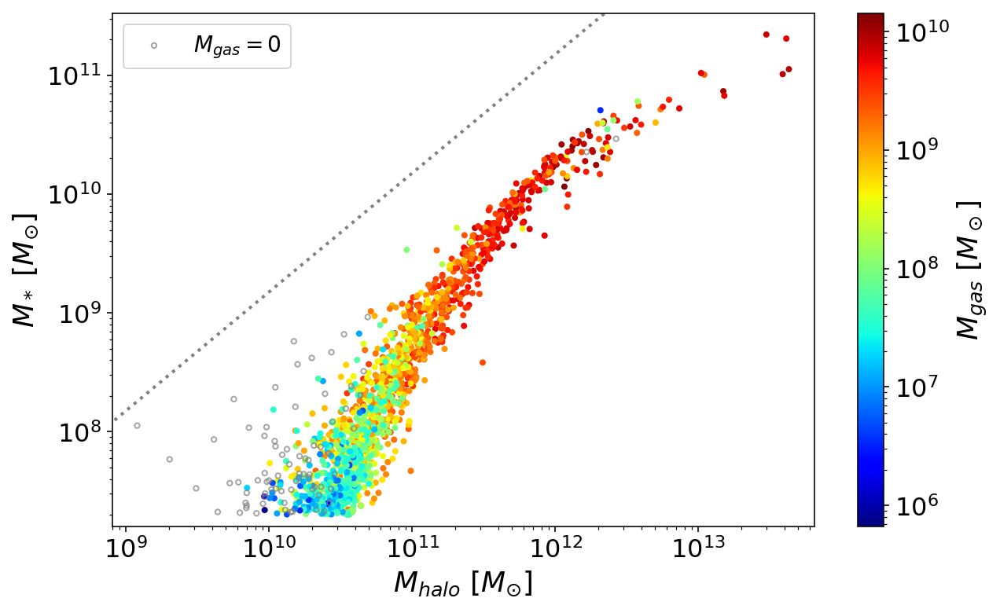

In [11]:
### plot SMHM relation of centrals:

plt.figure(figsize=(10,6))

# select only centrals:
cen = data['gal_subgroup']==0

plt.scatter(data['gal_Mhalo'][cen], data['gal_Mstar'][cen], c=data['gal_Mgas'][cen], 
            marker='.', norm=matplotlib.colors.LogNorm(), cmap='jet')

cb = plt.colorbar()
cb.set_label(r'$M_{gas}$ [$M_\odot$]')

# select only galaxies with no gas:
nogas = data['gal_Mgas'][cen]==0

plt.scatter(data['gal_Mhalo'][cen][nogas], data['gal_Mstar'][cen][nogas], c='none', 
            marker='o', s=10, edgecolor='grey', alpha=0.7,
            norm=matplotlib.colors.LogNorm(), label=r'$M_{gas}=0$')

plt.legend()


mh=np.logspace(8,14,10)
plt.plot(mh,0.15*mh, ':', lw=2, color='grey')


plt.xlim(np.min(0.8*data['gal_Mhalo']), 1.5*np.max(data['gal_Mhalo']))

plt.ylim(np.min(0.8*data['gal_Mstar']), 1.5*np.max(data['gal_Mstar']))

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$M_{halo}$ [$M_{\odot}$]')
plt.ylabel(r'$M_*$ [$M_{\odot}$]')

Text(0, 0.5, '$M_*$ [$M_{\\odot}$]')

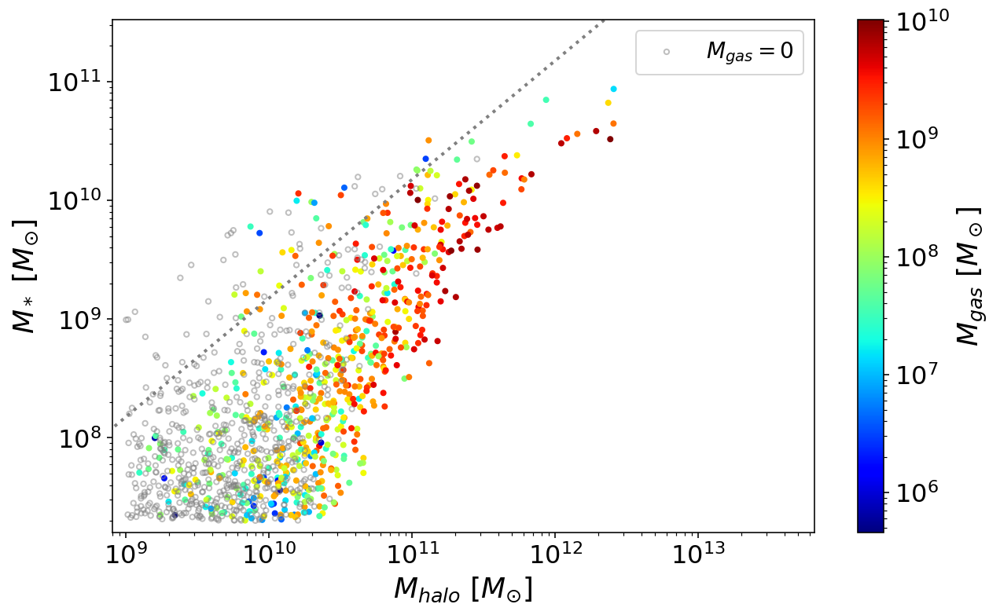

In [12]:
### plot SMHM relation of satellites:

plt.figure(figsize=(10,6))

# select satellites using mask:
sat = data['gal_subgroup']>0

plt.scatter(data['gal_Mhalo'][sat], data['gal_Mstar'][sat], c=data['gal_Mgas'][sat], 
            marker='.', norm=matplotlib.colors.LogNorm(), cmap='jet')

cb = plt.colorbar()
cb.set_label(r'$M_{gas}$ [$M_\odot$]')

# select satellites with no gas using mask:
nogas = (data['gal_Mgas'][sat]==0)

plt.scatter(data['gal_Mhalo'][sat][nogas], data['gal_Mstar'][sat][nogas], c='none', 
            marker='o', s=10, edgecolor='grey', alpha=0.5,
            norm=matplotlib.colors.LogNorm(), label=r'$M_{gas}=0$')

plt.legend()


mh=np.logspace(8,14,10)
plt.plot(mh,0.15*mh, ':', lw=2, color='grey')


plt.xlim(np.min(0.8*data['gal_Mhalo']), 1.5*np.max(data['gal_Mhalo']))

plt.ylim(np.min(0.8*data['gal_Mstar']), 1.5*np.max(data['gal_Mstar']))

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$M_{halo}$ [$M_{\odot}$]')
plt.ylabel(r'$M_*$ [$M_{\odot}$]')

Text(0, 0.5, '$M_*$ [$M_{\\odot}$]')

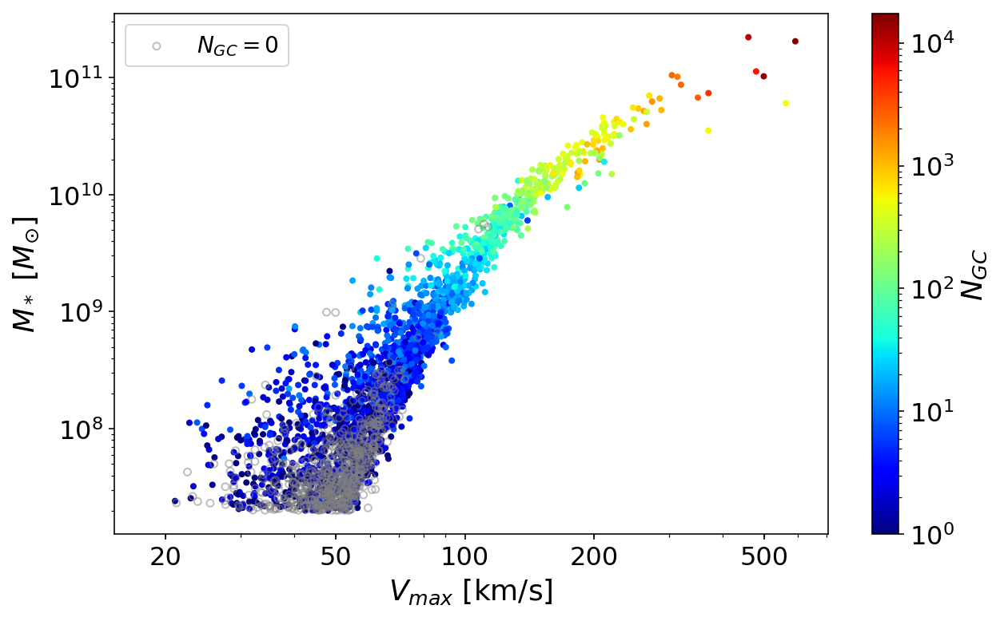

In [17]:
### Tully-Fisher relation coloured by GC number

plt.figure(figsize=(10,6))

plt.scatter(data['gal_Vmax'], data['gal_Mstar'], c=data['gal_Ngc'], marker='.', norm=matplotlib.colors.LogNorm(), cmap='jet')

cb = plt.colorbar()
cb.set_label(r'$N_{GC}$')

# select galaxies with no GCs:
nogcs = data['gal_Ngc']==0

plt.scatter(data['gal_Vmax'][nogcs], data['gal_Mstar'][nogcs], c='none', 
            marker='o', s=20, edgecolor='grey', norm=matplotlib.colors.LogNorm(), 
            alpha=0.5, label=r'$N_{GC}=0$')

plt.legend()


plt.xscale('log')
plt.yscale('log')

plt.xticks(ticks=[20,50,100,200,500], labels=[20,50,100,200,500])

plt.xlabel(r'$V_{max}$ [km/s]')
plt.ylabel(r'$M_*$ [$M_{\odot}$]')

Text(0, 0.5, '$dN/d\\log M_*$ [Mpc$^{-3}$]')

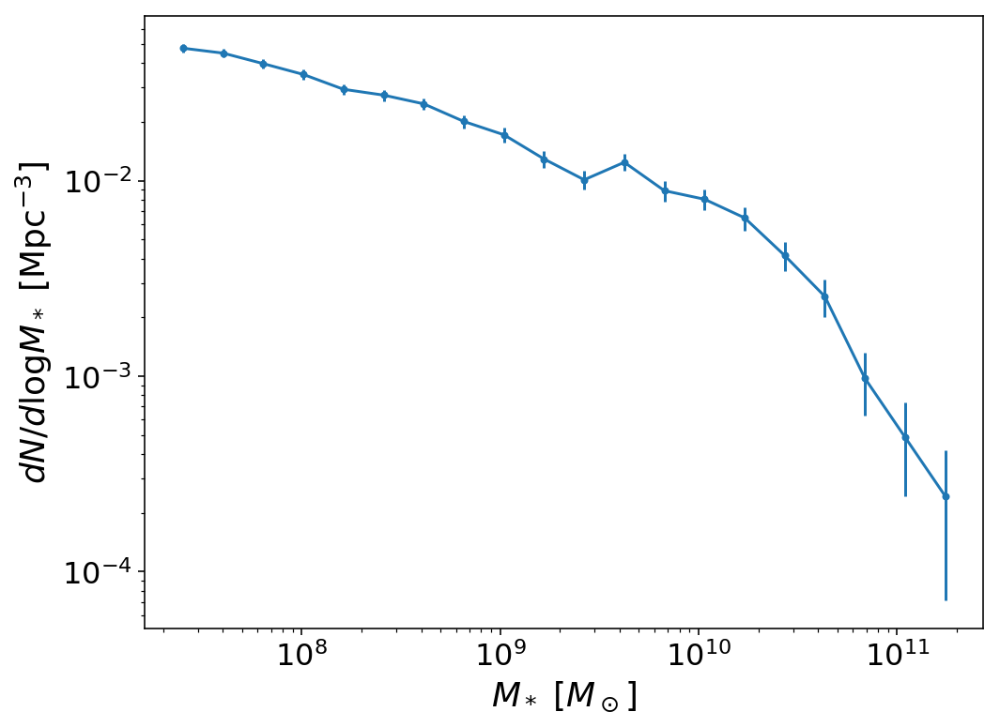

In [18]:
### stellar mass function:

plt.figure(figsize=(8,6))

vals, bins = np.histogram(np.log10(data['gal_Mstar']), bins=20)
bin_centers = (bins[:-1] + bins[1:])/2
bin_width = abs(bins[:-1] - bins[1:])

Lbox= 34.374944665781314  # [Mpc]

SMF = vals/bin_width/Lbox**3
err = np.sqrt(vals)/bin_width/Lbox**3

plt.errorbar(10**bin_centers, SMF, yerr=err, marker='.', )

plt.xscale('log')
plt.yscale('log')



plt.xlabel(r'$M_*$ [$M_\odot$]')
plt.ylabel(r'$dN/d\log M_*$ [Mpc$^{-3}$]')

Text(0, 0.5, '$Y$ [Mpc]')

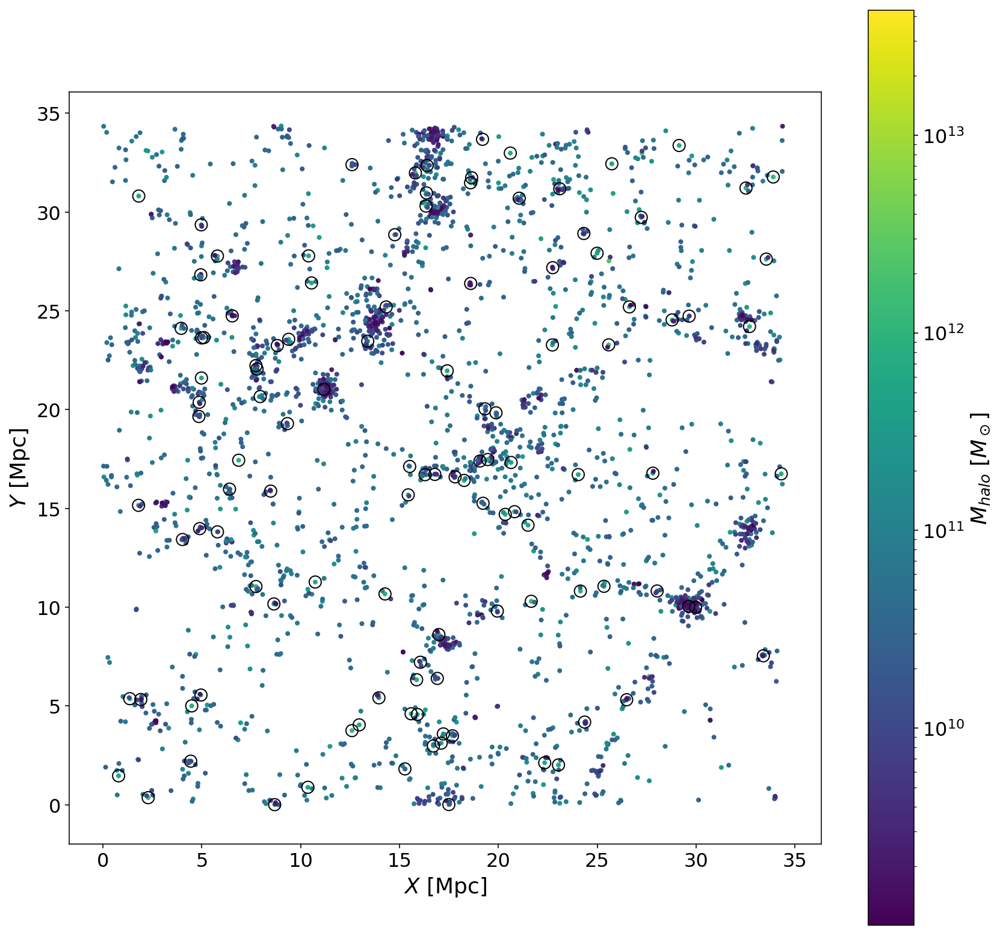

In [22]:
### X-Y projection of galaxy positions indicating MW-mass haloes

fig, ax = plt.subplots(figsize=(14,14))

ax.set_aspect('equal')

plt.scatter(data['gal_pos'][:,0], data['gal_pos'][:,1], marker='.', c=data['gal_Mhalo'], norm=matplotlib.colors.LogNorm())

cb = plt.colorbar()
cb.set_label(r'$M_{halo}$ [$M_\odot$]')


### select galaxies in ~MW halo mass range:
mask = (0.5e12 < data['gal_Mhalo'])*(data['gal_Mhalo'] < 2e12)

plt.scatter(data['gal_pos'][:,0][mask], data['gal_pos'][:,1][mask], marker='o', color='none', edgecolor='black', s=100)


plt.xlabel(r'$X$ [Mpc]')
plt.ylabel(r'$Y$ [Mpc]')

Text(0, 0.5, '$Y$ [Mpc]')

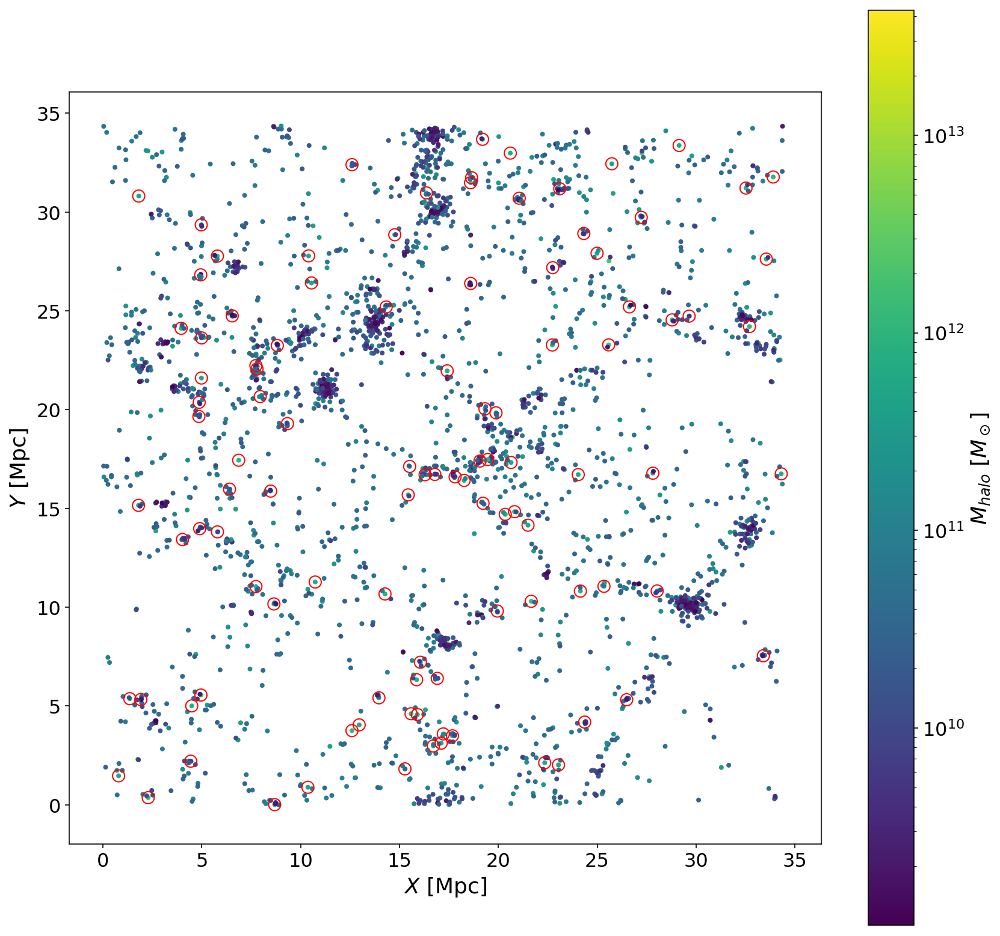

In [24]:
### X-Y projection of galaxy positions indicating MW-mass CENTRAL haloes

fig, ax = plt.subplots(figsize=(14,14))

ax.set_aspect('equal')

plt.scatter(data['gal_pos'][:,0], data['gal_pos'][:,1], marker='.', c=data['gal_Mhalo'], norm=matplotlib.colors.LogNorm())

cb = plt.colorbar()
cb.set_label(r'$M_{halo}$ [$M_\odot$]')


# select only centrals:
cen = data['gal_subgroup']==0

# select galaxies in ~MW halo mass range:
mask = (0.5e12 < data['gal_Mhalo'])*(data['gal_Mhalo'] < 2e12)

# apply both masks together:
plt.scatter(data['gal_pos'][:,0][cen*mask], data['gal_pos'][:,1][cen*mask], marker='o', color='none', edgecolor='red', s=100)


plt.xlabel(r'$X$ [Mpc]')
plt.ylabel(r'$Y$ [Mpc]')

# Pynbody analysis

## Load snapshot

In [2]:
### example for centering on first fof group and aligning the disk spin with the z-axis:


fof_id=0  # FOF ID of most massive galaxy group as example

Dir = '/home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED'
snapname = Dir+'/data/particledata_028_z000p000/eagle_subfind_particles_028_z000p000' # contains all snapshot info

### need to get these from SubFind (or from the galaxy catalog) for proper centering and disk alignment:
halo_center = np.array([29.36983276, 10.17392163, 31.37698937])
norm = np.array([ 0.98958086,  0.06682299, -0.12753201])




### pynbody load snapshot:
print(' loading snapshot:', snapname, 'into pynbody...')
s = pynbody.load(snapname)
print(' ... done\n')

print(' loading halo catalog from Subfind:')
# load the halo catalogue
h = s.halos()
print(' ... done\n')

print(' converting to physical units...')
s.physical_units()
print(' ... done\n')

### need to set very large box size for pynbody to find particles
s.properties['boxsize'] = pynbody.units.Unit("1000 Mpc")

# need to add softening lengths manually:
s['eps'] = pynbody.array.SimArray([0.35], 'kpc', dtype=s['pos'].dtype)

print(' snapshot properties:')
print(s.properties)


s.dm['mass'] = s.dm['mass']/0.6777  # corrects the DM particle masses in pynbody


### center snapshot using input halo center (only needed for pynbody plots):
galcenter = halo_center * 1e3 # [kpc]
print(' \nusing Subfind center coords for pynbody centering [kpc]:', galcenter)
s['pos'] -= galcenter # manual centering

#print(h[fof_id+1].stars['pos'])

### rotate galaxy to edge-on orientation:
print('  rotating pynbody snapshot using galaxy spin vector ...')
print('   input spin axis of disk =', norm)
### disk along xy plane:
xy_angle = np.arctan2(norm[0], norm[1])*180./np.pi
s.rotate_z( xy_angle )
norm = rotate_z(np.array([norm]), xy_angle)[0]
yz_angle = np.arctan2(norm[1], norm[2])*180./np.pi
s.rotate_x( yz_angle )
norm = rotate_x(np.array([norm]), yz_angle)[0]
print('  spin in new rotated frame (should be [0,0,1]) =', norm)


### mask to select only central subhalo:
mask_stars = h[fof_id+1].stars["SubGroupNumber"] == 0
mask_dm  = h[fof_id+1].dm["SubGroupNumber"] == 0
mask_gas = h[fof_id+1].gas["SubGroupNumber"] == 0

#print(h[fof_id+1].stars['pos'])

print( ' ... done\n')
    




 loading snapshot: /home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED/data/particledata_028_z000p000/eagle_subfind_particles_028_z000p000 into pynbody...
 ... done

 loading halo catalog from Subfind:
 ... done

 converting to physical units...
 ... done

 snapshot properties:
{'a': 0.9999999999999998, 'omegaB0': 0.0482519, 'omegaM0': 0.307, 'omegaL0': 0.693, 'boxsize': Unit("1.00e+03 Mpc"), 'h': 0.6777, 'time': Unit("1.41e+01 kpc s km**-1"), 'E(z)': 1.0000000000000002, 'Flag_Cooling': 0, 'Flag_DoublePrecision': 0, 'Flag_Feedback': 0, 'Flag_IC_Info': 3, 'Flag_Metals': 0, 'Flag_Sfr': 0, 'Flag_StellarAge': 0, 'H(z)': 2.1962758605300003e-18, 'MassTable': array([0.00000000e+00, 8.21291611e-05, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00]), 'NumFilesPerSnapshot': 32, 'NumPart_ThisFile': array([ 6559429, 32338384,        0,        0,  3300046,      609],
      dtype=int32), 'NumPart_Total': array([306127994, 680019308,         0,         0,  51869071,      9567],
   

## pynbody functions

In [6]:
### the following routines center on an fof group using the halo catalogue (for satellites you need to center manually)

def images(fof_id, type, save, path):
    
    if type in ['gas','all']:
        ### galaxy gas projection:
        print(' \nplotting gas projection...')
        plt.figure(figsize=(10,10))
        pynbody.plot.image(h[fof_id+1].gas, width = '100 kpc', units = 'Msol pc^-3', cmap='Blues')
        if save: plt.savefig(path+'gal_'+str(fof_id)+'_gas.png', bbox_inches='tight')
        print(' ... done\n')

    if type in ['stars','all']:
        ### fof group stars projection:
        print(' \nplotting stars projection...')
        plt.figure(figsize=(10,10))
        pynbody.plot.image(h[fof_id+1].stars, width = '500 kpc', units = 'Msol pc^-2', cmap="YlOrRd_r")
        if save: plt.savefig(path+'gal_'+str(fof_id)+'_stars.png', bbox_inches='tight')
        print(' ... done\n')

    if type in ['dm','all']:
        ### fof group DM projection:
        print(' \nplotting DM projection...')
        plt.figure(figsize=(10,10))
        pynbody.plot.image(h[fof_id+1].dm, width = '500 kpc', units = 'Msol pc^-2', cmap='Greys')
        if save: plt.savefig(path+'gal_'+str(fof_id)+'_DM.png', bbox_inches='tight')
        print(' ... done\n')
    
    if type in ['mock','all']:
        ### create mock image using the default bands (i, v, u)
        print(' \nmock optical image...')
        plt.figure(figsize=(10,10))
        pynbody.plot.stars.render(h[fof_id+1].stars, width='20 kpc')
        if save: plt.savefig(path+'gal_'+str(fof_id)+'_mock.png', bbox_inches='tight')
        print(' ... done\n')

        
def rotcurve(fof_id, save, path):
    
    ### rotate disk onto xy plane for RC (not needed if using subfind spin alignment)
    #print( ' \nrotating halo to face-on...')
    #halo_object.rotate_x(-90.0) 
    
    print( ' \nplotting rotation curve...')
    p  = pynbody.analysis.profile.Profile(h[fof_id+1], min=.01, max=50, type = 'log')
    pd = pynbody.analysis.profile.Profile(h[fof_id+1].dm, min=.01, max=50, type = 'log')
    ps = pynbody.analysis.profile.Profile(h[fof_id+1].stars, min=.01, max=50, type = 'log')
    pg = pynbody.analysis.profile.Profile(h[fof_id+1].gas, min=.01, max=50, type = 'log')
    
    for prof, name, lcolor in zip([p,pd,ps,pg],['total','dm','stars','gas'],['black','grey','orange','blue']) :
        plt.plot(prof['rbins'],prof['v_circ'], c=lcolor, label=name)
    
    plt.xlabel('$R$ [kpc]');
    plt.ylabel('$v_{circ}$ [km/s]');
    plt.legend()
    if save: plt.savefig(path+'gal_'+str(fof_id)+'_rotcurve.png', bbox_inches='tight')
    
    print( ' ... done\n')
    
     

## Images

 
plotting stars projection...
 ... done



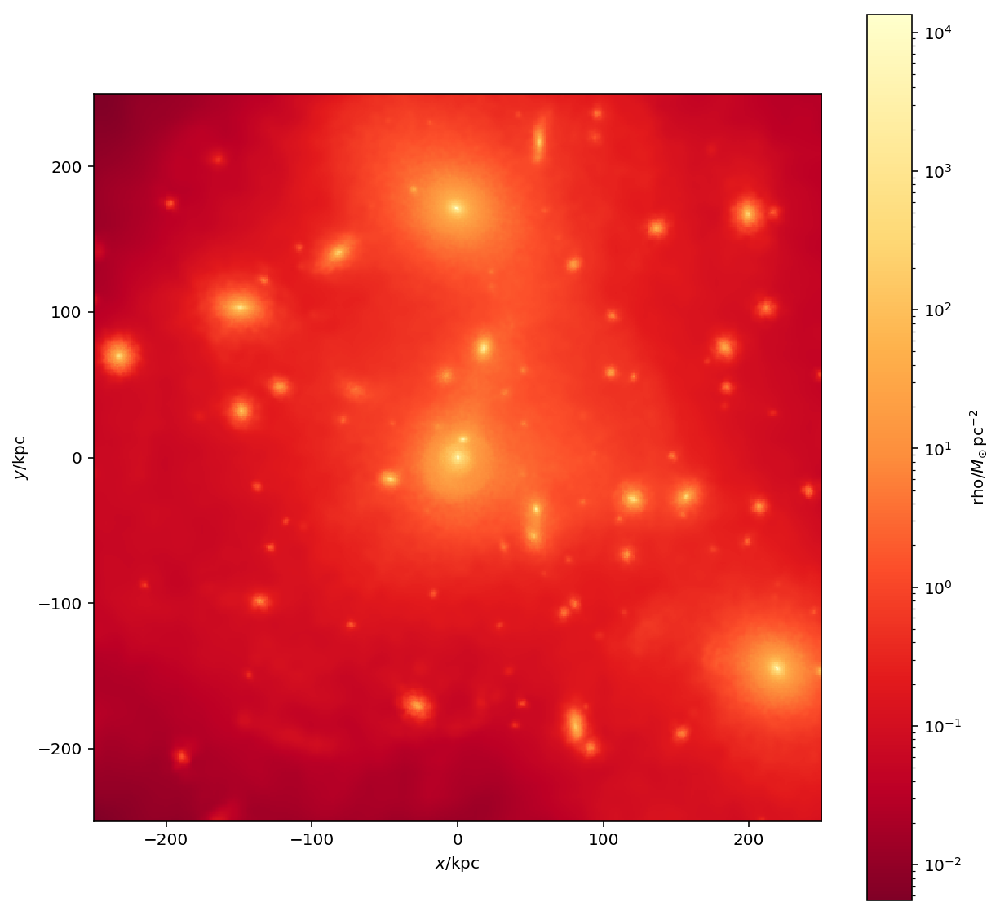

In [4]:
images(fof_id, type='stars', save=False, path='/directory/filename.pdf' )

 
mock optical image...
 ... done



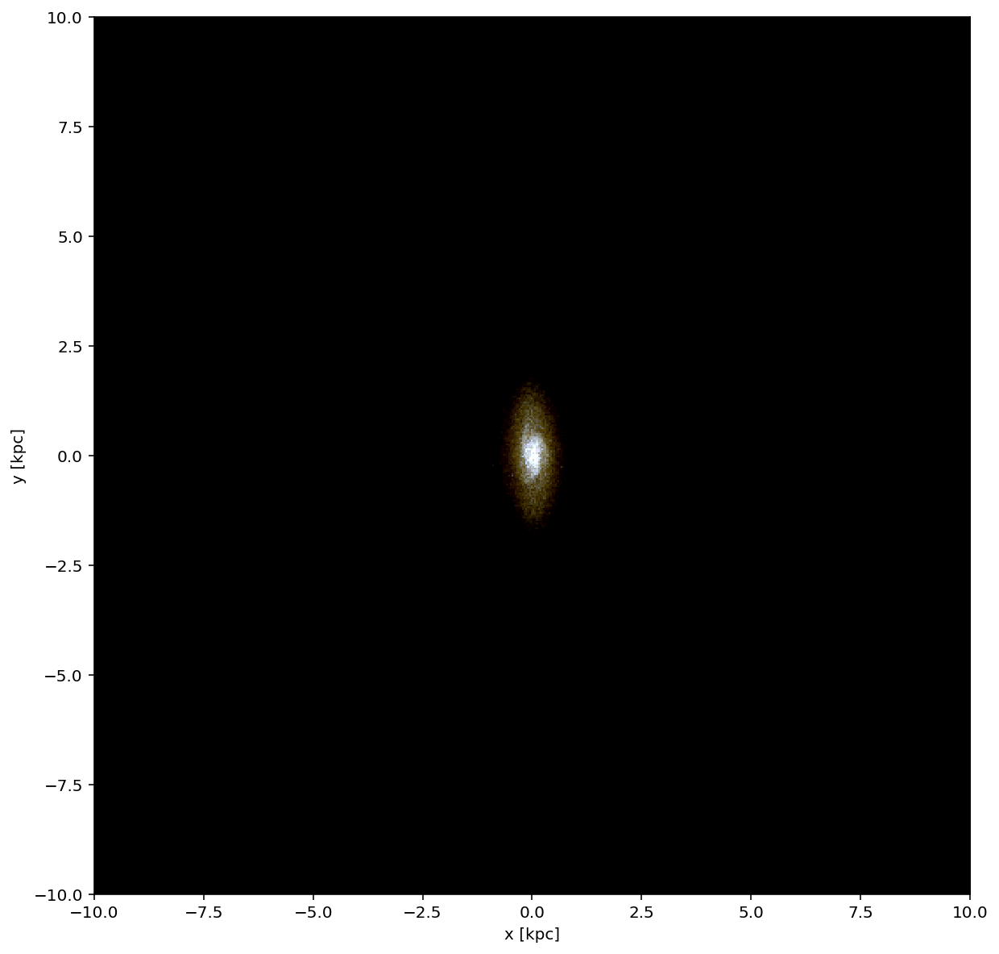

In [5]:
images(fof_id, type='mock', save=False, path='/directory/filename.pdf' )

## Rotation curve

 
plotting rotation curve...


/usr/local/lib64/python3.6/site-packages/pynbody/array.py:865: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return self.base[self._reexpress_index(item)]
pynbody.analysis.profile : Profile v_circ -- this routine assumes the disk is in the x-y plane
pynbody.analysis.profile : Profile v_circ -- this routine assumes the disk is in the x-y plane
pynbody.analysis.profile : Profile v_circ -- this routine assumes the disk is in the x-y plane
pynbody.analysis.profile : Profile v_circ -- this routine assumes the disk is in the x-y plane


 ... done



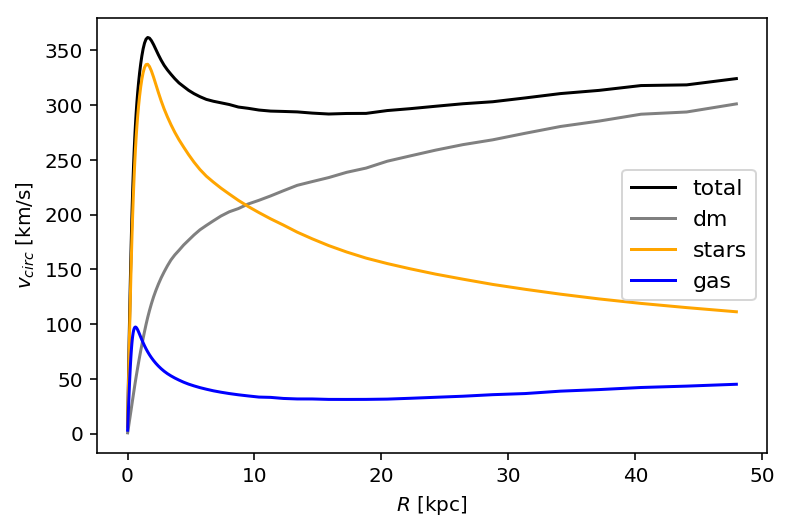

In [7]:
rotcurve(fof_id, save=False, path='/directory/filename.pdf' )

# Galaxy assembly histories

In [38]:
Dir = '/home1/datasets/E-MOSAICS/L0034N1034/RECALIBRATED'
snap = 28 # last snapshot number (redshift= 0)

Header = getAttrs(Dir, snap, 'Header')
Lbox = Header['BoxSize'] * Header['ExpansionFactor'] / Header['HubbleParam']
print('Lbox =', Lbox, 'Mpc')
Units = getAttrs(Dir, snap, 'Units')
m_dm = Header['MassTable'][1] / Header['HubbleParam'] * Units['UnitMass_in_g']   # [g]


### read DM particle data from snapshot:
pos = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap, "PartType1/Coordinates", suppress=True)
PartGroupNumber = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap, "PartType1/GroupNumber", suppress=True)
PartSubGroupNumber = read_data_mosaics(Dir, "particledata", "eagle_subfind_particles", snap, "PartType1/SubGroupNumber", suppress=True)


('Lbox =', 34.374944665781314, 'Mpc')


In [44]:
### DM halo concentration from NFW fit:


from matplotlib.ticker import AutoMinorLocator
from scipy.optimize import leastsq, curve_fit, fsolve


GRAVITY = 6.672e-8    # cgs
SOLAR_MASS = 1.989e33
CM_PER_MPC = 3.085678e24
h = 0.6777
HUBBLE = h * 100 * 1e5 / CM_PER_MPC # km s^-1 Mpc^-1 -> 1/s

rho_crit = 3*HUBBLE**2 / (8.*np.pi*GRAVITY) # [g/cm3]



# Get the NFW concentration of the haloes


def delta_c(c):
    return (200/3.) * c**3 / (np.log(1.+c) - c/(1.+c))

def NFW(r, dc, rs):
    x = r/rs
    return dc / x / (1.+x)**2 # rho/rho_crit

def residuals(const,rho,r):  # rho - rho_fit
    if const[0]<0: return 1e99
    if const[1]<0: return 1e99
    dc = const[0]
    rs = const[1]
    # implicitly solve for c using dc:
    nfw_c = fsolve(lambda c: dc - delta_c(c), x0=[10.0], xtol=1e-4)[0]
    r200 = nfw_c*rs
    mask = (r>0.05*r200) * (r<0.6*r200)
    return rho[mask]-np.log10(NFW(r[mask],*const))

def NFW_fit(rho, rbin):
    # Fit the profile 
    const = np.array([delta_c(10.), 0.2/10.*CM_PER_MPC]) # First guess
    print(const)
    popt = leastsq(residuals,const,args=(np.log10(rho), rbin), maxfev=2000)[0]
    print(popt)
    dc = popt[0]
    rs = popt[1]
    return dc, rs







#plt.figure(figsize=(16,12))


print('#Gal, M200, Vmax, VmaxRadius, c_nfw, M200_fit, r200_fit, Msub_dm')
print('#   , Msun, km/s,    Mpc    ,      ,         ,         ,        ')


for igal in range(len(data['gal_group']))[:10]:
    
    GroupNumber = data['gal_group'][igal]
    SubGroupNumber = data['gal_subgroup'][igal]
    CofP = data['gal_pos'][igal]
    
    if SubGroupNumber > 0: continue  # only centrals

    
    ### select particles in Group:
    mask = (PartGroupNumber.data==GroupNumber) #* (PartSubGroupNumber.data==SubGroupNumber)
    pos_dm = pos.data[mask] # [cm]
    pos_dm = centre_positions(pos_dm, CofP*CM_PER_MPC, Dir, snap, units='cm')
    radius = np.linalg.norm(pos_dm, axis=1)
    print(radius)

    pos_dm = pos_dm[radius<2*CM_PER_MPC]
    radius = radius[radius<2*CM_PER_MPC]
    print(radius)

    # Linear bins
    #bin_edges = np.linspace( (0.0035*CM_PER_MPC), (np.percentile(radius, 84.1344746)*1.00000001), 100 )
    # Log bins
    rmin = 0.0035*CM_PER_MPC
    rmax = np.percentile(radius, 84.1344746)*1.00000001
    bin_edges = np.logspace( np.log10(rmin), np.log10(rmax), 31)

    num, bin_edges = np.histogram(radius, bins=bin_edges)

    rho = num*m_dm / (4./3.*np.pi*(bin_edges[1:]**3-bin_edges[:-1]**3)) /rho_crit
    rbin = (bin_edges[1:]+bin_edges[:-1])/2.
    for i in range(len(num)):
        rbin[i] = np.median( radius[(radius>bin_edges[i])*(radius<=bin_edges[i+1])] )

    #for i in xrange(len(rho)):
    #  if rho[i]<30:
    #    rho = rho[:i]
    #    rbin = rbin[:i]
    #    break

    ## Fit the profile 
    #const = np.array([delta_c(10.), 0.2/10.*CM_PER_MPC]) # First guess
    #def residuals(const,rho,r):
    #  return rho-np.log10(NFW(r,*const))
    #popt = leastsq(residuals,const,args=(np.log10(rho), rbin),maxfev=2000)[0]
    #dc = popt[0]
    #rs = popt[1]

    
    ### fit the NFW profile:
    print(rho, rbin)
    dc, rs = NFW_fit(rho, rbin)

    ### solve for c200(delta_c) and R200, M200:
    nfw_c = fsolve(lambda c: dc - delta_c(c), x0=[10.0], xtol=1e-8)[0]
    r200 = nfw_c*rs
    M200 = 200.*rho_crit*(4.*np.pi/3.)*r200**3

    print('%d , %11g , %8g , %7g , %8g , %7g , %11g , %8g , %11g' % 
          (igal, data['group_M200'], data['Vmax'], data['VmaxRadius'], 
           nfw_c, M200/SOLAR_MASS, r200/CM_PER_MPC, len(pos.data)*m_dm/SOLAR_MASS))
  

    plt.plot(rbin/rs, rho, '-', label='igal%.3d'%(igal))
    plt.plot(rbin/rs, NFW(rbin, dc, rs), '--', label='NFW fit')
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('r/rs')
    plt.ylabel('rho/rho_crit')
    plt.legend()
    #plt.savefig('nfwfits.pdf')

#Gal, M200, Vmax, VmaxRadius, c_nfw, M200_fit, r200_fit, Msub_dm
#   , Msun, km/s,    Mpc    ,      ,         ,         ,        
[2.72265051e+24 2.74371742e+24 2.73937954e+24 ... 2.12682034e+24
 2.14286428e+24 2.12748259e+24]
[2.72265051e+24 2.74371742e+24 2.73937954e+24 ... 2.12682034e+24
 2.14286428e+24 2.12748259e+24]
[4.50174157e+05 3.28082535e+05 2.43778234e+05 1.82296063e+05
 1.33783671e+05 1.00945008e+05 7.62751155e+04 5.73349129e+04
 4.33261614e+04 3.33635785e+04 2.57403306e+04 1.92690695e+04
 1.48563028e+04 1.15737641e+04 8.18697388e+03 6.11539275e+03
 4.58315823e+03 3.47328562e+03 2.62791132e+03 2.05550473e+03
 1.58754184e+03 1.14332957e+03 8.76187556e+02 6.71413661e+02
 5.07775384e+02 3.92294162e+02 3.86637156e+02 2.16482099e+02
 1.37681547e+02 7.86858450e+01] [1.18716010e+22 1.41453264e+22 1.69156685e+22 2.02009591e+22
 2.41293730e+22 2.87763455e+22 3.43893882e+22 4.09888013e+22
 4.90155554e+22 5.85551593e+22 6.98751095e+22 8.34728460e+22
 9.96651996e+22 1.18831868e+23 1.4

ValueError: The array returned by a function changed size between calls